#### Ski Resort Project University of Zürich 2020
## The test notebook for case6_Davos Jakobshorn_2584_ 1540-2590 m
## setup 1: 9000 experiments 200 scenarios & 45 Policies

This notebook is used for the visualization of the "ema_workbench Ski_Resort" project. The outputs of ema_workbench experiments which have been saved after executing the python codes (XLR_Framework.py) are loaded and various visualization techniques are used and maps are produced.

### *Reading the libraries*

Main libraries are imported here, although there a few libraries that are imported later.

In [1]:
import os
import os.path
import random
from operator import add
from datetime import datetime, date, timedelta

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

import shutil
import ema_workbench
import time

from scipy.integrate import simps
from numpy import trapz
from decimal import Decimal, ROUND_DOWN, ROUND_UP

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\em_framework\optimization.py:48: ImportWarning: platypus based optimization not available
  warnings.warn("platypus based optimization not available", ImportWarning)


### *Seting up the display extent*

In [2]:
pd.set_option('display.max_columns',69)
pd.set_option('display.max_rows',119)

## XLRM Framework

## Step 5: Model deployment

### Loading the outputs

In this section using the load_results class of ema_workbench we load the saved results of python experiments (.tar.gz)

In [3]:
from ema_workbench import load_results, ema_logging
from ema_workbench.analysis.pairs_plotting import (pairs_lines, pairs_scatter,
                                                   pairs_density)
ema_logging.log_to_stderr(level=ema_logging.DEFAULT_LEVEL)

# load the data
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case1_sattel-hochstuckli\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case2_Atzmaening\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1339\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1822\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2000\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2500\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case5_champex\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b1564\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2141\setup1'
root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2584\setup1'

rootOut = os.path.join(root, 'Results_3')
fh = os.path.join(rootOut, '9000_runs.tar.gz')
experiments, outcomes = load_results(fh)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\prim.py:31: ImportWarning: altair based interactive inspection not available
  "inspection not available"), ImportWarning)
[MainProcess/INFO] results loaded succesfully from C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2584\setup1\Results_3\9000_runs.tar.gz


Check and see if data has been loaded properly or not?

12 parameters:

X2fM, X3iPot, X5temp, X6tempArt, Xfactor1, xClimateModel, xRCP, x1SnowThershold, xGoodDays, scenario, policy, model

In [4]:
print(experiments.shape)
print(list(experiments.keys()))
print(list(outcomes.keys()))

(9000, 12)
['X2fM', 'X3iPot', 'X5temp', 'X6tempArt', 'Xfactor1', 'xClimateModel', 'xRCP', 'x1SnowThershold', 'xGoodDays', 'scenario', 'policy', 'model']
['S_Ave_GoodDay', 'GCM_RCM', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


#### S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm) 
#### GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)
#### Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)
#### S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)
#### S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort
#### S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points
#### tipping_points: Number of tipping points (1981-2100)

## Step 6: Visualization of the EMA_Workbench Results

 the analysis package of ema_workbench contains a wide range of techniques for visualization and analysis of the results from series of computational experiments. 

### Visualization with ema-workbench - part1

### Pairwise Scatter Plot

[MainProcess/DEBUG] generating pairwise scatter plot


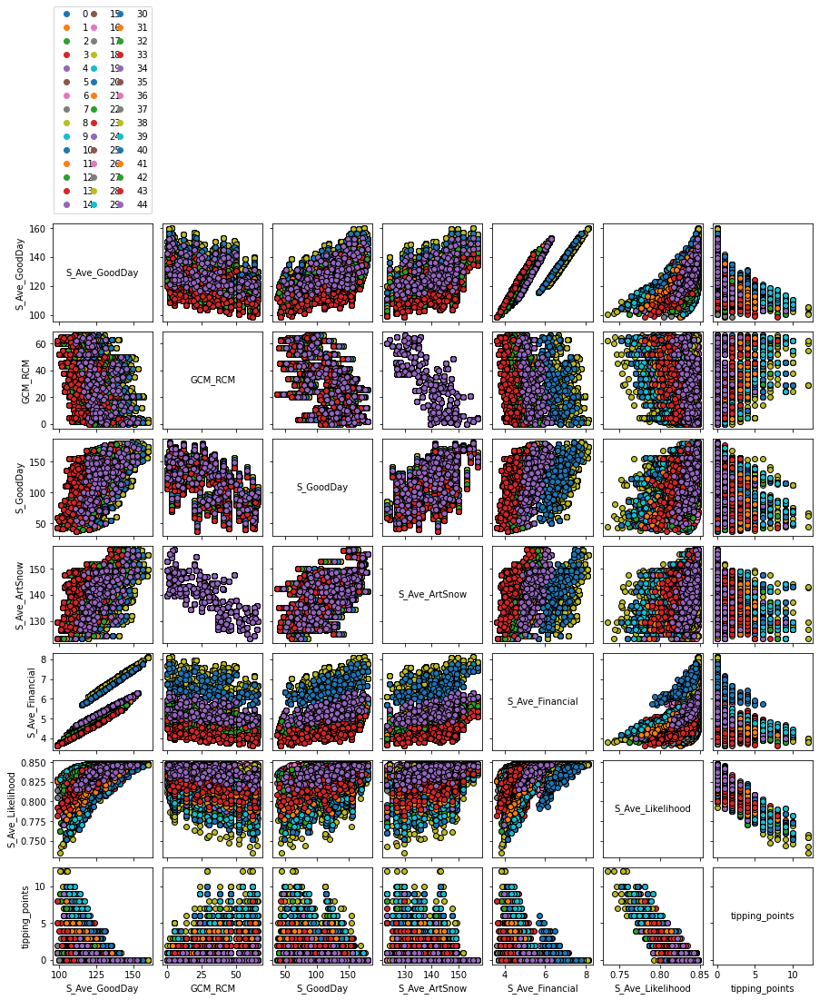

In [5]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, outcomes, group_by='policy',
                                         legend=True)
fig.set_size_inches(15, 15)

fig.savefig(os.path.join(rootOut, 'SA_All_outputs.svg'), format='svg', dpi=600)
#fig.savefig(os.path.join(rootOut, 'SA_All_outputs.tiff'), format='tiff', dpi=600)


plt.show()

In [9]:
outcomes2 = outcomes
outcomes2 = outcomes2.pop('GCM_RCM')

KeyError: 'GCM_RCM'

In [10]:
print(outcomes2)

{'S_Ave_GoodDay': array([121.23073695, 120.46306339, 123.2730261 , ..., 139.22374294,
       120.2473524 , 122.6432041 ]), 'S_GoodDay': array([[174.08084   , 146.14476   , 141.52732   , ..., 100.4438    ,
         98.85812   , 116.88928   ],
       [172.82076   , 181.        , 168.52      , ...,  58.56948   ,
        111.06224   , 100.78756   ],
       [101.2212    , 170.40644   , 178.22572   , ..., 103.70456   ,
        114.1982    ,  72.55712   ],
       ...,
       [ 90.16125   , 119.80779167, 173.063125  , ..., 108.87841667,
        129.31791667, 142.85716667],
       [102.30754167, 138.28858333, 168.008     , ..., 125.09733333,
        121.5555    , 127.51129167],
       [122.15041667, 165.42120833, 174.06075   , ..., 142.74195833,
         97.705125  , 139.20383333]]), 'S_Ave_ArtSnow': array([131.84355932, 126.43966102, 134.96872881, ..., 145.97830508,
       127.69016949, 142.5090678 ]), 'S_Ave_Financial': array([4.97288136, 4.94347458, 5.05788136, ..., 5.77084746, 5.01194915,
 

In [11]:
new_dict = {key:val for key, val in outcomes2.items() if key != 'GCM_RCM'} 

In [12]:
print(list(new_dict.keys()))

['S_Ave_GoodDay', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


[MainProcess/DEBUG] generating pairwise scatter plot
No handles with labels found to put in legend.


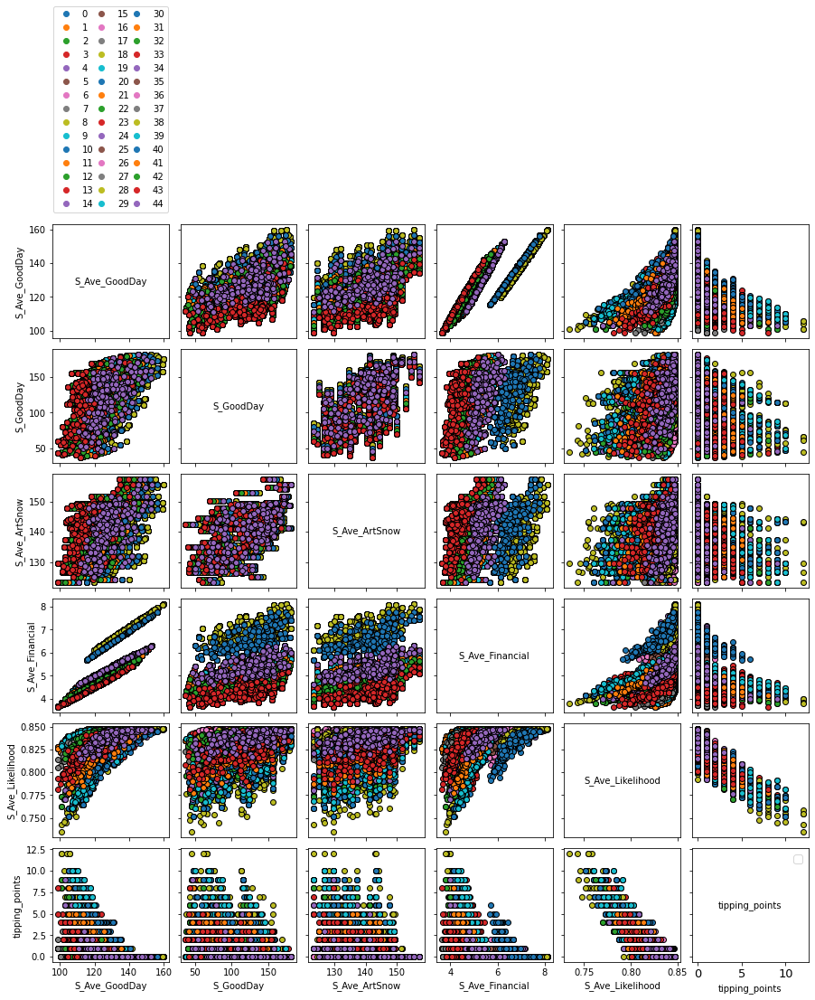

In [13]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, new_dict, group_by='policy',
                                         legend=True)

plt.yticks(fontsize=13)
plt.xticks(fontsize=13)
plt.legend(fontsize=13)

fig.set_size_inches(15, 15)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.svg'), format='svg', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.tiff'), format='tiff', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.tiff'), format='tiff', dpi=150)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.jpg'), format='jpg', dpi=150)



plt.show()

### Moving the outputs to the folder of results
### Assign the address of outputs folders

In [14]:
import tarfile

shutil.move(os.path.join(root, 'Outputs_py'), os.path.join(rootOut, 'Outputs_py'))
shutil.move(os.path.join(root, 'outSeason'), os.path.join(rootOut, 'outSeason')) 
shutil.move(os.path.join(root, 'outSeason_Likelihood_survival'), os.path.join(rootOut, 'outSeason_Likelihood_survival')) 
shutil.move(os.path.join(root, 'outSeasonArt'), os.path.join(rootOut, 'outSeasonArt')) 
shutil.move(os.path.join(root, 'outSeasonFinancial'), os.path.join(rootOut, 'outSeasonFinancial')) 

rootVisualization = rootOut
with tarfile.open(os.path.join(rootVisualization, '9000_runs.tar.gz'),"r") as zip_ref:
    zip_ref.extractall(os.path.join(rootVisualization, '9000_runs'))

# We have five types of outputs
outDaily = os.path.join(rootVisualization, 'Outputs_py')
outSeasonTippingPoint = os.path.join(rootVisualization, 'outSeason')
outSeason_Likelihood_survival = os.path.join(rootVisualization, 'outSeason_Likelihood_survival')
outSeasonArtificialSnowPossibility = os.path.join(rootVisualization, 'outSeasonArt')
outSeasonFinancial = os.path.join(rootVisualization, 'outSeasonFinancial')
out_ema = os.path.join(rootVisualization, '9000_runs')

In [15]:
df4_ema_experiment = pd.read_csv(os.path.join(out_ema, 'experiments.csv'))
df4_ema_y = pd.read_csv(os.path.join(out_ema, 'S_Ave_GoodDay.csv'), header=None)
df4_ema_y.columns = ["Yout"]
df4_ema_y1 = pd.read_csv(os.path.join(out_ema, 'GCM_RCM.csv'), header=None)
df4_ema_y1.columns = ["Yout1"]
df4_ema_y3 = pd.read_csv(os.path.join(out_ema, 'S_GoodDay.csv'), header=None)
df4_ema_y3.columns = ["Yout3" + "_" + str(i) for i in range(118)]
df4_ema_y4 = pd.read_csv(os.path.join(out_ema, 'S_Ave_ArtSnow.csv'), header=None)
df4_ema_y4.columns = ["Yout4"]
df4_ema_y5 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Financial.csv'), header=None)
df4_ema_y5.columns = ["Yout5"]
df4_ema_y6 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Likelihood.csv'), header=None)
df4_ema_y6.columns = ["Yout6"]
df4_ema_y7 = pd.read_csv(os.path.join(out_ema, 'tipping_points.csv'), header=None)
df4_ema_y7.columns = ["Yout7"]

#### Make a database from the outputs of ema framework by concatinating the every output and experiments table

In [16]:
df_final_ema = pd.concat((df4_ema_experiment, df4_ema_y, df4_ema_y1, df4_ema_y3, df4_ema_y4, df4_ema_y5, df4_ema_y6, df4_ema_y7 ), axis = 1)
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.326935,957.312700,4.532665,-1.247101,0.935556,0.850193,3.0,250.0,100.0,0,0,UZHModel,121.230737,62,174.08084,146.14476,141.52732,129.27784,164.66968,171.78616,152.80860,98.40772,159.65676,163.95908,148.38032,130.38528,148.58008,141.07348,150.01612,115.27928,118.77668,136.51032,142.45288,112.15136,...,114.94384,99.26352,24.93380,132.61468,110.74144,95.58612,88.82720,135.58640,131.37132,135.42436,19.64296,101.81456,90.36024,151.79756,94.73612,115.11444,34.91448,84.19184,67.33544,122.38692,86.44012,98.15580,104.84660,130.05032,117.02572,60.58184,76.38956,100.44380,98.85812,116.88928,131.843559,4.972881,0.805834,2.0
1,1.564115,1052.845098,5.474877,-1.803193,2.755444,0.536630,3.0,250.0,100.0,1,0,UZHModel,120.463063,53,172.82076,181.00000,168.52000,166.50736,159.79796,177.93936,154.30196,104.79512,173.26764,158.27660,132.52668,160.11724,138.73996,168.25396,181.70988,90.27664,136.45136,171.28656,109.69308,143.08300,...,108.97224,69.48884,87.02692,76.87060,75.01952,105.91940,116.64496,91.13820,141.08480,131.95872,79.93704,95.76156,55.86384,96.66540,42.79856,101.83412,93.79684,55.24480,99.84180,70.18292,80.24476,100.35204,88.12420,93.76524,89.15248,51.91280,51.10992,58.56948,111.06224,100.78756,126.439661,4.943475,0.788524,5.0
2,1.160213,909.670187,5.520439,-1.333493,2.649474,0.720566,3.0,250.0,100.0,2,0,UZHModel,123.273026,58,101.22120,170.40644,178.22572,154.47336,148.04180,127.32504,170.21008,154.69128,170.11844,130.78580,173.46856,145.59076,171.50652,180.68968,170.34360,149.66992,149.25884,174.81016,150.79380,122.31052,...,68.74660,113.15556,90.06620,101.06564,109.24968,121.38300,96.98676,117.03364,123.64324,95.84204,64.46840,111.43768,123.02780,52.34648,87.05228,90.83720,91.73428,105.70244,121.87648,57.04260,126.57752,54.38268,81.55444,77.52804,101.91180,78.00200,102.11712,103.70456,114.19820,72.55712,134.968729,5.057881,0.806072,2.0
3,1.295246,996.188724,5.758656,-1.138981,1.560372,0.013137,2.0,250.0,100.0,3,0,UZHModel,125.922269,12,135.26744,143.47008,181.77520,144.18160,146.47940,132.46120,156.96344,167.07412,117.98468,173.84624,171.04748,159.92180,172.78724,103.46592,182.00000,142.94552,129.89524,142.19840,161.27352,90.46432,...,84.99800,73.49316,106.55560,134.10644,95.68176,114.31556,114.73104,120.94628,120.67904,160.68376,102.14772,118.79156,146.94020,83.86612,95.05592,84.26060,120.51656,125.60440,101.83144,88.52080,109.02196,110.42144,81.25840,79.16852,131.15084,142.09532,104.97912,85.96856,99.12412,104.73728,143.052712,5.155169,0.827192,1.0
4,1.045140,1054.748859,5.265179,-1.532905,2.184067,0.321757,2.0,250.0,100.0,4,0,UZHModel,123.993576,19,171.79800,164.62028,182.00000,141.21448,126.80332,150.14164,130.97340,147.67428,139.80140,180.88652,136.04096,150.57724,172.26592,156.94064,146.14272,152.85104,138.73172,166.13244,154.97188,142.32728,...,151.31984,113.59212,67.21076,101.07164,121.32684,107.44952,100.78712,78.94652,99.35320,87.86904,132.87768,87.83040,65.80708,140.97012,79.78672,141.85572,119.98264,118.38364,102.11892,135.83292,143.14744,117.18868,72.65852,93.94948,103.13188,115.93944,111.06328,142.63504,96.60152,150.84508,140.540932,5.085847,0.813568,3.0


In [17]:
df_final_ema.to_csv(os.path.join(rootVisualization, 'df_final_ema.csv'), index = False)

In [18]:
# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [19]:
outFolder = rootVisualization
outSeasonFolder = os.path.join(outFolder, 'outSeason')
outSeasonFinancial = os.path.join(outFolder, 'outSeasonFinancial')
outSeasonArt = os.path.join(outFolder, 'outSeasonArt')
outSeason_Likelihood_survival = os.path.join(outFolder, 'outSeason_Likelihood_survival')

In [20]:
#### 2020/07/22 ####
all_Files = []
for filename in os.walk(outSeasonFolder):
    all_Files = filename[2]
    
totalFiles_loc = []
for i in range(len(all_Files)):
    totalFiles_loc.append(os.path.join(outSeasonFolder, all_Files[i]))
    
### 2020/08/23
all_Files_fin = []
for filename in os.walk(outSeasonFinancial):
    all_Files_fin = filename[2]
    
totalFiles_loc_fin = []
for i in range(len(all_Files_fin)):
    totalFiles_loc_fin.append(os.path.join(outSeasonFinancial, all_Files_fin[i]))
    
### 2020/08/23
all_Files_Art = []
for filename in os.walk(outSeasonArt):
    all_Files_Art = filename[2]
    
totalFiles_loc_Art = []
for i in range(len(all_Files_Art)):
    totalFiles_loc_Art.append(os.path.join(outSeasonArt, all_Files_Art[i]))

### 2020/08/23
all_Files_Like = []
for filename in os.walk(outSeason_Likelihood_survival):
    all_Files_Like = filename[2]
    
totalFiles_loc_Like = []
for i in range(len(all_Files_Like)):
    totalFiles_loc_Like.append(os.path.join(outSeason_Likelihood_survival, all_Files_Like[i]))


#### Total number of outputs (csv files) in each out folder produced by our framework

In [21]:
print(len(totalFiles_loc))
print(len(totalFiles_loc_fin))
print(len(totalFiles_loc_Art))
print(len(totalFiles_loc_Like))

9000
9000
9000
9000


In [22]:
emptyMatrixGoodDays = [np.empty([119, 69]) for _ in range(len(totalFiles_loc))]
    
for i in range(0, len(totalFiles_loc), 1):
    b = []
    with open(totalFiles_loc[i], 'r') as file:
        outputReaderlines = file.readlines()
        for j in range (len(outputReaderlines)):
            b.append(outputReaderlines[j].replace('\n','').split(','))
    
    emptyMatrixGoodDays[i] = np.array(b)

### 2020/08/23
emptyMatrixfin = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_fin))]

for i in range(0, len(totalFiles_loc_fin), 1):
    b = []
    with open(totalFiles_loc_fin[i], 'r') as file:
        outputReaderlines_fin = file.readlines()
        for j in range (len(outputReaderlines_fin)):
            b.append(outputReaderlines_fin[j].replace('\n','').split(','))
    
    emptyMatrixfin[i] = np.array(b)

### 2020/08/23
emptyMatrixArt = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Art))]

for i in range(0, len(totalFiles_loc_Art), 1):
    b = []
    with open(totalFiles_loc_Art[i], 'r') as file:
        outputReaderlines_Art = file.readlines()
        for j in range (len(outputReaderlines_Art)):
            b.append(outputReaderlines_Art[j].replace('\n','').split(','))
    
    emptyMatrixArt[i] = np.array(b)
    
### 2020/08/23
emptyMatrixLike = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Like))]

for i in range(0, len(totalFiles_loc_Like), 1):
    b = []
    with open(totalFiles_loc_Like[i], 'r') as file:
        outputReaderlines_Like = file.readlines()
        for j in range (len(outputReaderlines_Like)):
            b.append(outputReaderlines_Like[j].replace('\n','').split(','))
    
    emptyMatrixLike[i] = np.array(b)

In [23]:
#matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=2)
matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=0)
matrix_fin = np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1)), axis=0)
matrix_Art = np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1)), axis=0)
matrix_Like = np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1)), axis=0)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\interactiveshell.py:3337: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


In [24]:
print(matrix_GoodDays.shape)
print(matrix_fin.shape)
print(matrix_Art.shape)
print(matrix_Like.shape)

(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)


#### Check the header of outputs

In [25]:
print(emptyMatrixGoodDays[1][0,1])
print(emptyMatrixfin[1][0,1])
print(emptyMatrixArt[1][0,1])
print(emptyMatrixLike[1][0,1])

isOverSnow_sc_85_17
Money_sc_85_17
ArtSnowPossibility_sc_85_17
isOverSnow_sc_85_17


In [26]:
matrix_GoodDays26= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP26' in emptyMatrixGoodDays[i][0,1] or \
                             '_26_' in emptyMatrixGoodDays[i][0,1] ) , axis=0) 
matrix_GoodDays45= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP45' in emptyMatrixGoodDays[i][0,1] or \
                            '_45_' in emptyMatrixGoodDays[i][0,1] ), axis=0)
matrix_GoodDays85= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP85' in emptyMatrixGoodDays[i][0,1] or \
                            '_85_' in emptyMatrixGoodDays[i][0,1]), axis=0) 

### 2020/08/23
matrix_fin26= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP26' in emptyMatrixfin[i][0,1] or \
                             '_26_' in emptyMatrixfin[i][0,1] ) , axis=0) 
matrix_fin45= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP45' in emptyMatrixfin[i][0,1] or \
                            '_45_' in emptyMatrixfin[i][0,1] ), axis=0)
matrix_fin85= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP85' in emptyMatrixfin[i][0,1] or \
                            '_85_' in emptyMatrixfin[i][0,1]), axis=0) 

### 2020/08/23
matrix_Art26= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP26' in emptyMatrixArt[i][0,1] or \
                             '_26_' in emptyMatrixArt[i][0,1] ) , axis=0) 
matrix_Art45= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP45' in emptyMatrixArt[i][0,1] or \
                            '_45_' in emptyMatrixArt[i][0,1] ), axis=0)
matrix_Art85= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP85' in emptyMatrixArt[i][0,1] or \
                            '_85_' in emptyMatrixArt[i][0,1]), axis=0) 

### 2020/08/23
matrix_Like26= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP26' in emptyMatrixLike[i][0,1] or \
                             '_26_' in emptyMatrixLike[i][0,1] ) , axis=0) 
matrix_Like45= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP45' in emptyMatrixLike[i][0,1] or \
                            '_45_' in emptyMatrixLike[i][0,1] ), axis=0)
matrix_Like85= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP85' in emptyMatrixLike[i][0,1] or \
                            '_85_' in emptyMatrixLike[i][0,1]), axis=0) 

In [27]:
print(type(matrix_GoodDays))
print(matrix_GoodDays.ndim)
print(len(matrix_GoodDays))
print(matrix_GoodDays.size)
print(matrix_GoodDays.dtype)
print(matrix_GoodDays.dtype.name)
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

<class 'numpy.ndarray'>
3
9000
2142000
<U47
str1504
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000


In [28]:
print(matrix_GoodDays[2, 1:, 1:2].shape)
print(matrix_fin[2, 1:, 1:2].shape)
print(matrix_Art[2, 1:, 1:2].shape)
print(matrix_Like[2, 1:, 1:2].shape)

(118, 1)
(118, 1)
(118, 1)
(118, 1)


### Calculate the quantiles for each year of simulation (1981-2100)

In [29]:
q10_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.9, axis=0)


In [30]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[94.58669103]
[107.93236607]
[137.51067394]
[157.10597519]
[172.22470673]
(118, 1)
[3.67]
[4.45]
[5.71]
[6.67]
[7.64]
(118, 1)
[141.976]
[150.3]
[156.26]
[163.005]
[167.289]
(118, 1)
[100.]
[100.]
[100.]
[100.]
[100.]
(118, 1)


#### Set the parameters of making figure

In [31]:
num_Simulation = 9000
p_Step = 20
alpha_Fade = 0.04

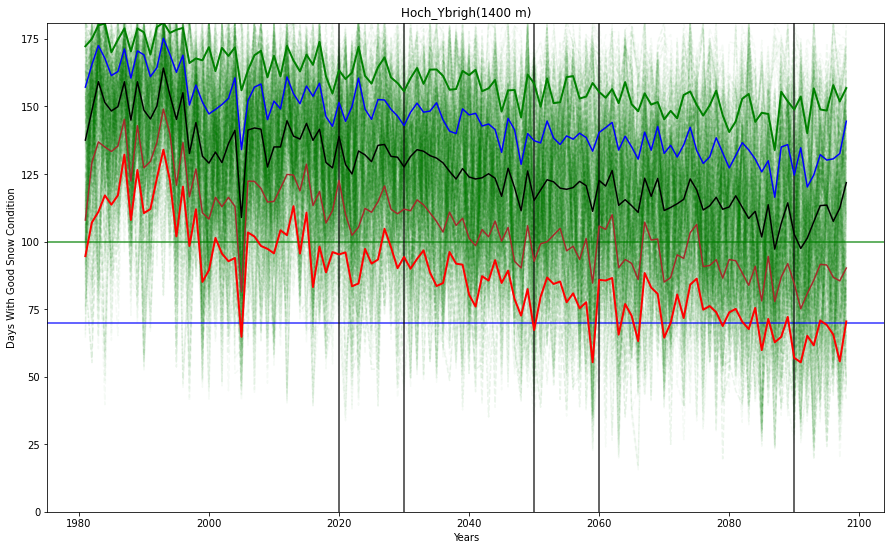

In [32]:
fig1, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_GoodDays[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=70, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=0, top =181)
axs.set_title('Hoch_Ybrigh(1400 m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig1.savefig(os.path.join(rootVisualization, 'RCP_All_number_of_day_goodSnow.svg'), format='svg', dpi=300)

plt.show()

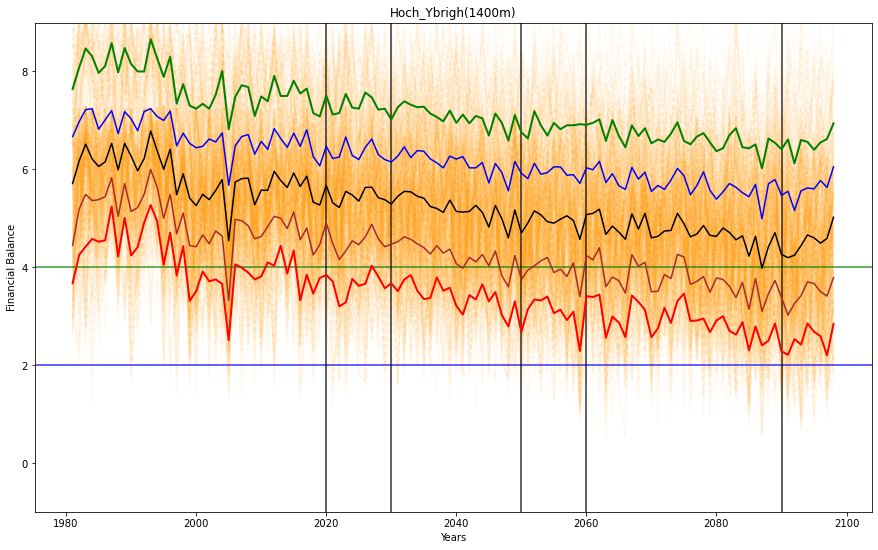

In [33]:
fig2, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_fin[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=4, color='green', alpha=0.8)
axs.axhline(y=2, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_fin, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_fin, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_fin, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_fin, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_fin, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =9)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Financial Balance')

fig2.savefig(os.path.join(rootVisualization, 'RCP_All_Financial.svg'), format='svg', dpi=300)

plt.show()

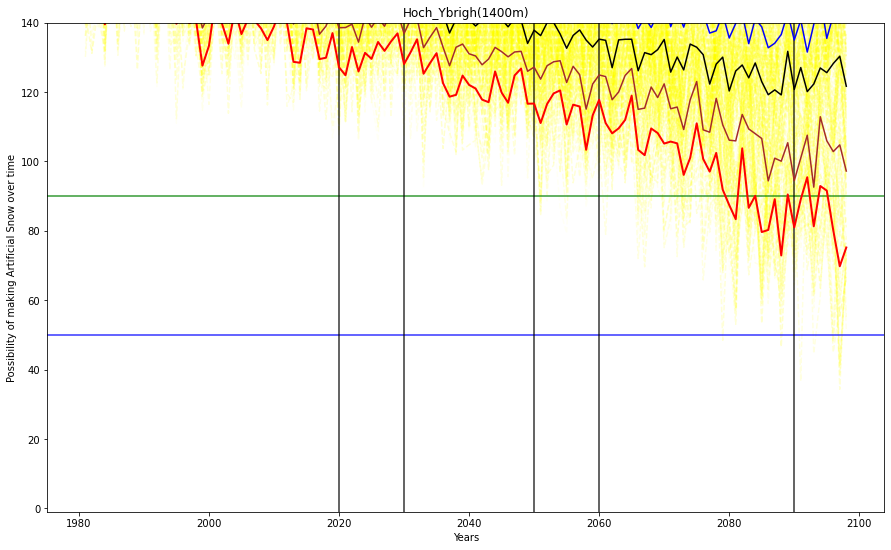

In [34]:
fig3, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Art[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='yellow', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Art, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Art, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Art, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Art, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Art, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =140)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Possibility of making Artificial Snow over time')

fig3.savefig(os.path.join(rootVisualization, 'RCP_All_ArtSnow.svg'), format='svg', dpi=300)

plt.show()

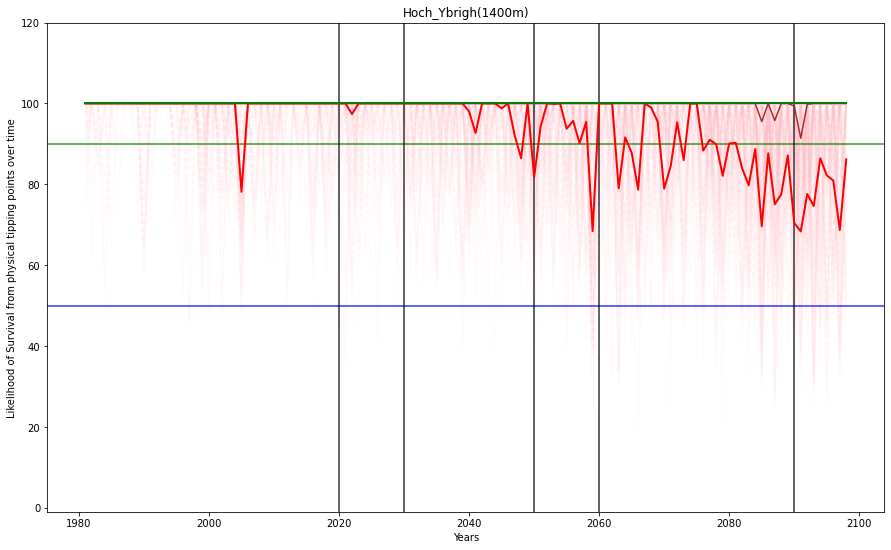

In [35]:
fig4, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Like[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Like, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Like, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Like, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Like, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Like, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =120)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Likelihood of Survival from physical tipping points over time')

fig4.savefig(os.path.join(rootVisualization, 'RCP_All_Likelihood.svg'), format='svg', dpi=300)

plt.show()

### Visualization with ema-workbench - part2 

## Scenario Discovery 
### A model driven approach to scenario development

There is ample literature on both CART and PRIM and their relative merits for use in scenario discovery.

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

In [36]:
from ema_workbench.analysis import prim

x = experiments
y = outcomes['S_Ave_GoodDay'] < 120
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 3385 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.065, coverage: 0.172821270310192, density: 1.0 restricted_dimensions: 5


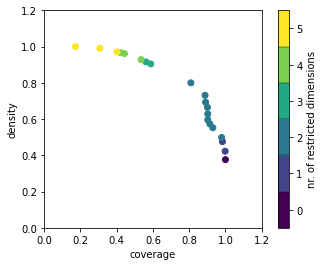

<Figure size 432x288 with 0 Axes>

In [37]:
#import mpld3
#fig, axs = plt.subplots()
#fig5, axs = plt.subplots(figsize=(15,9))
box1.show_tradeoff()
plt.show()
plt.savefig(os.path.join(rootVisualization, 'coverage_density_1.png'))
            
#mpld3.display()
#fig5.savefig(os.path.join(rootVisualization, 'box.svg'), format='svg', dpi=600)

coverage     0.88774
density     0.731144
id                10
mass        0.456667
mean        0.731144
res_dim            2
Name: 10, dtype: object

                                                     box 10  \
                                                        min   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 280.0, 250.0}   
Xfactor1                                            1.44568   

                                                             \
                                                        max   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 280.0, 250.0}   
Xfactor1                                            3.48751   

                                                  
                                       qp values  
x1SnowThershold  [1.7510559193818928e-165, -1.0]  
Xfactor1           [8.33282330949357e-158, -1.0]  



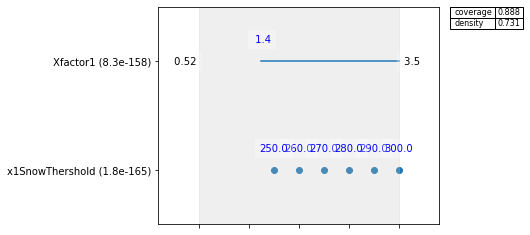

In [38]:
# Saeed : explore the inspect effect
box1.inspect(10)
box1.inspect(10, style='graph')
plt.show()

x1SnowThershold [280.0, 290.0, 300.0, 260.0, 200.0, 270.0, 240.0, 250.0, 220.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


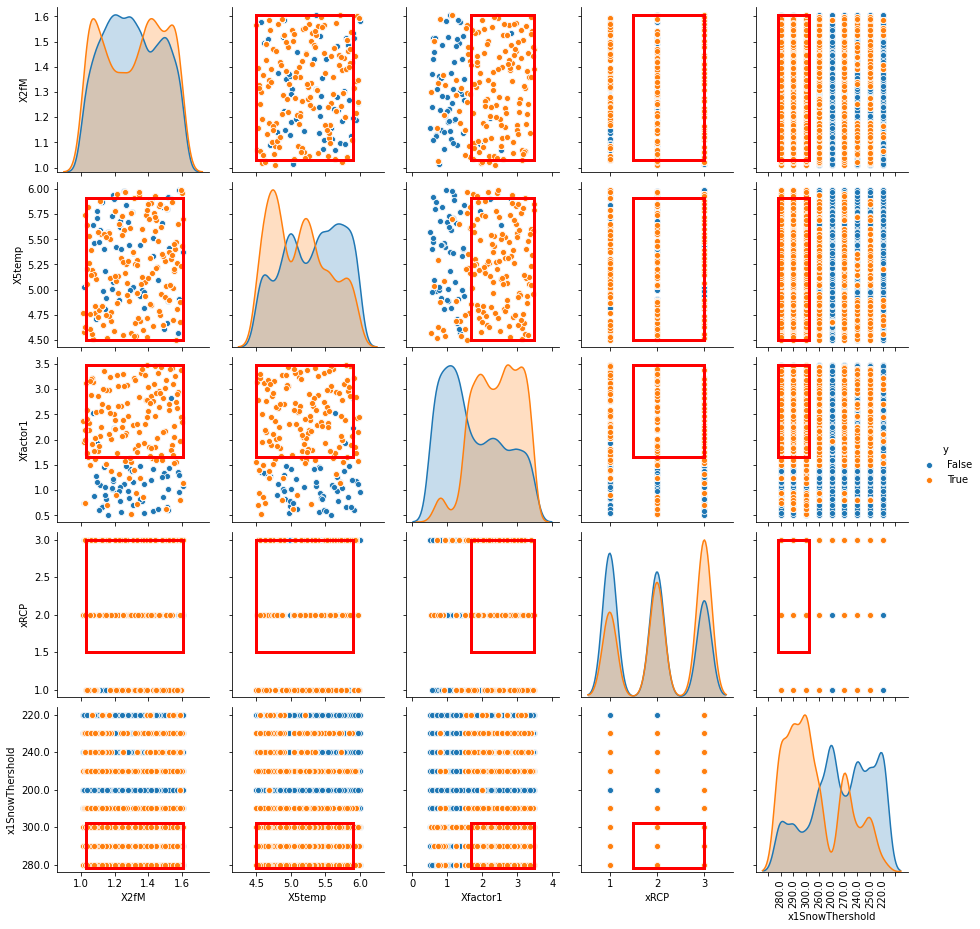

In [39]:
# fig, axs = plt.subplots()
axs1 = box1.show_pairs_scatter(18)
plt.show()
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.svg'), format='svg', dpi=600)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.tiff'), format='tiff', dpi=300)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_70.tiff'), format='tiff', dpi=150)

In [40]:
box2 = prim_alg.find_box()

[MainProcess/INFO] 8415 points remaining, containing 2800 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.06333333333333334, coverage: 0.16838995568685378, density: 1.0 restricted_dimensions: 6


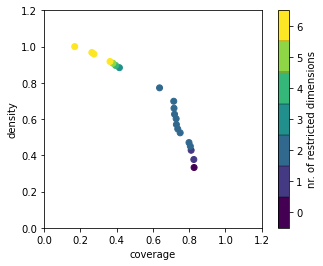

In [41]:
#import mpld3
box2.show_tradeoff()
plt.show()
#mpld3.display()
#fig.savefig(os.path.join(rootVisualization, 'box2.svg'), format='svg', dpi=600)

coverage    0.716396
density     0.659864
id                10
mass        0.408333
mean        0.659864
res_dim            2
Name: 10, dtype: object

                                                     box 10  \
                                                        min   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 280.0, 250.0}   
Xfactor1                                            1.37387   

                                                             \
                                                        max   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 280.0, 250.0}   
Xfactor1                                            3.48751   

                                                 
                                      qp values  
x1SnowThershold   [3.36583183870809e-138, -1.0]  
Xfactor1         [3.707921710944756e-111, -1.0]  



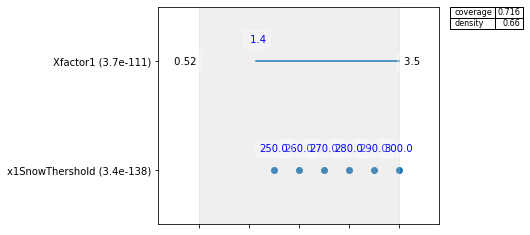

In [42]:
# Saeed : explore the inspect effect
box2.inspect(10)
box2.inspect(10, style='graph')
plt.show()

x1SnowThershold [290.0, 260.0, 300.0, 270.0, 280.0, 250.0, 200.0, 240.0, 220.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


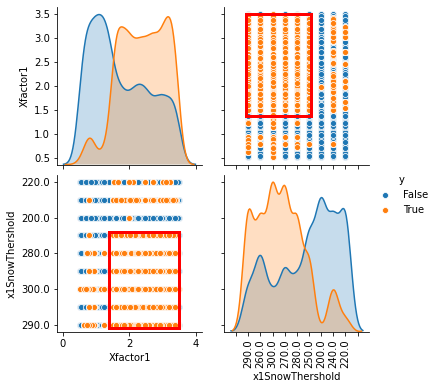

In [43]:
# fig, axs = plt.subplots()
axs2 = box2.show_pairs_scatter(10)
plt.show()
axs2.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_.svg'), format='svg', dpi=300)

### Artifical snow analysis

In [44]:
x = experiments
y = outcomes['S_Ave_ArtSnow'] < 130
prim_alg = prim.Prim(x, y, threshold=0.8)
box3 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 1080 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.9, mass: 0.1, coverage: 0.75, density: 0.9 restricted_dimensions: 5


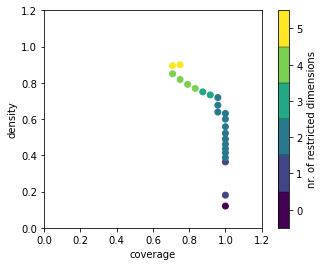

In [45]:
box3.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage      1
density     0.6
id           10
mass        0.2
mean        0.6
res_dim       2
Name: 10, dtype: object

             box 10                                         
                min       max                      qp values
X6tempArt -1.998942 -1.338091  [-1.0, 6.205239063244445e-92]
xRCP       2.500000  3.000000                    [0.0, -1.0]



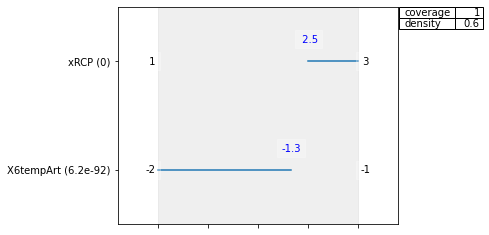

In [46]:
# Saeed : explore the inspect effect
box3.inspect(10)
box3.inspect(10, style='graph')
plt.show()

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


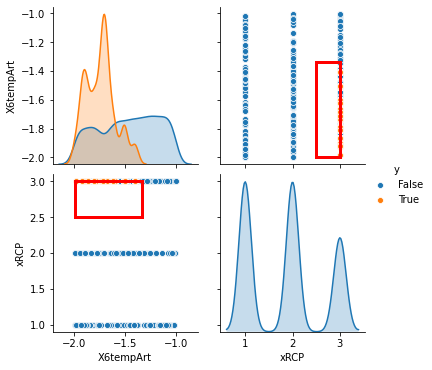

In [47]:
#fig, axs = plt.subplots()
axs4 = box3.show_pairs_scatter(10)
plt.show()
axs4.savefig(os.path.join(rootVisualization, 'multi_graphs_Artificial_40.svg'), format='tiff', dpi=300)

### Likelihood of Survival analysis

In [48]:
x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.8
prim_alg = prim.Prim(x, y, threshold=0.7)
box4 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 752 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.756578947368421, mass: 0.050666666666666665, coverage: 0.4587765957446808, density: 0.756578947368421 restricted_dimensions: 7


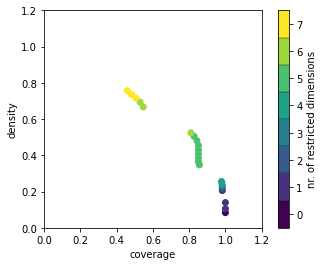

In [49]:
box4.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_liklihood.svg'), format='svg', dpi=600)

coverage     0.482713
density      0.734818
id                 20
mass        0.0548889
mean         0.734818
res_dim             7
Name: 20, dtype: object

                                                            box 20  \
                                                               min   
X5temp                                                     4.50218   
xGoodDays                                            {90.0, 100.0}   
xRCP                                                           2.5   
Xfactor1                                                   1.44502   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250.0}   
policy           {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14,...   
xClimateModel                                            0.0444688   

                                                                    \
                                                               max   
X5temp                                                     5.85347   
xG

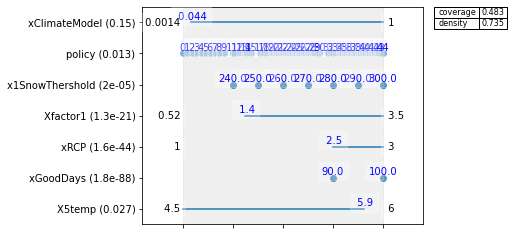

In [50]:
# Saeed : explore the inspect effect
box4.inspect(20)
box4.inspect(20, style='graph')
plt.show()

x1SnowThershold [290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250.0, 200.0, 220.0]
xGoodDays [90.0, 100.0, 80.0, 60.0, 70.0]
policy [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 16, 10, 31]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


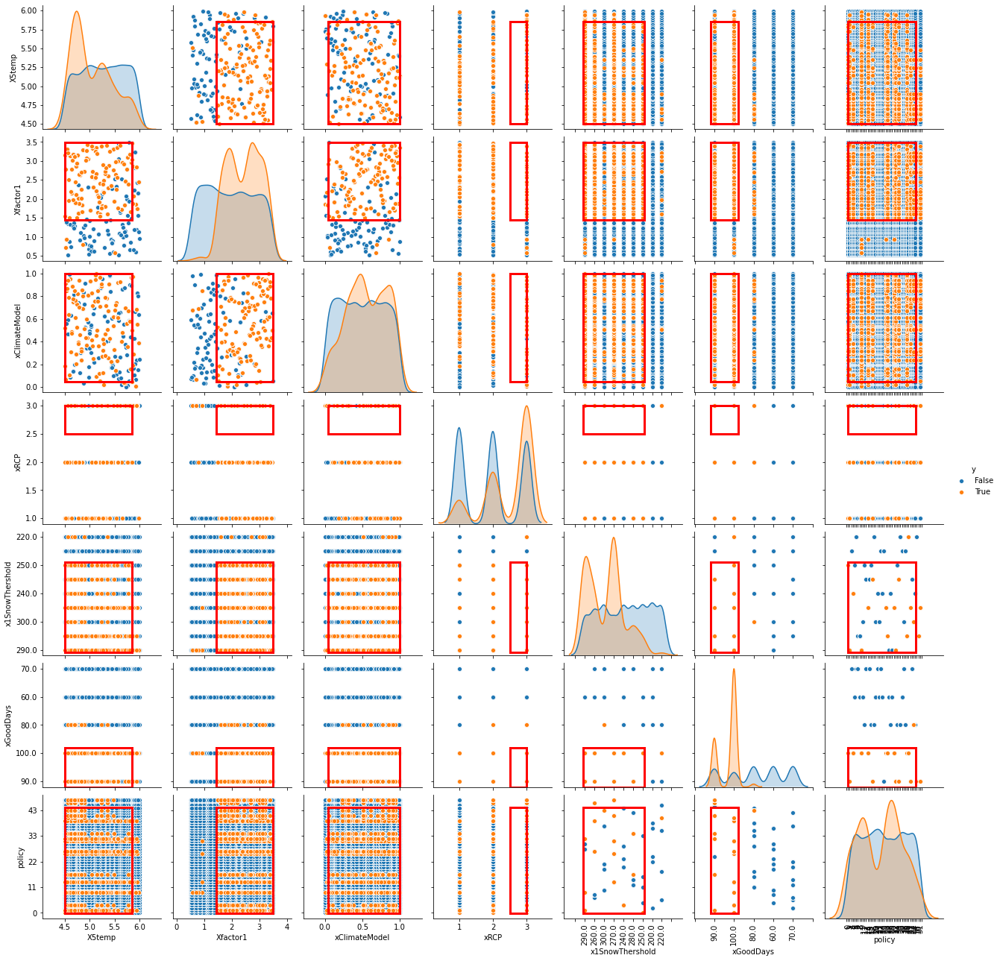

In [51]:
#fig, axs = plt.subplots()
axs3 = box4.show_pairs_scatter(20)
plt.show()
axs3.savefig(os.path.join(rootVisualization, 'multi_graphs_likehood.svg'), format='svg', dpi=600)

### Tipping points analysis

In [52]:
x = experiments
y = outcomes['tipping_points'] < 5
prim_alg = prim.Prim(x, y, threshold=0.8)
box5 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 8582 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.6222222222222222, coverage: 0.6525285481239804, density: 1.0 restricted_dimensions: 2


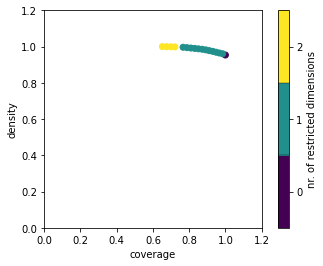

In [53]:
box5.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage    0.911326
density     0.977625
id                 5
mass        0.888889
mean        0.977625
res_dim            1
Name: 5, dtype: object

                                                    box 5  \
                                                      min   
policy  {0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15...   

                                                           \
                                                      max   
policy  {0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15...   

                                       
                            qp values  
policy  [7.144308283045608e-30, -1.0]  



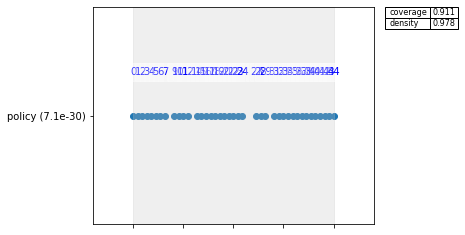

In [54]:
# Saeed : explore the inspect effect
box5.inspect(5)
box5.inspect(5, style='graph')
plt.show()

policy [0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 8, 13, 25, 26, 30]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


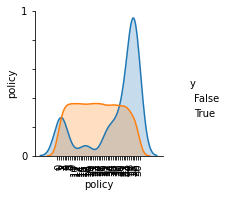

In [55]:
#fig, axs = plt.subplots()
axs5 = box5.show_pairs_scatter(5)
plt.show()

axs5.savefig(os.path.join(rootVisualization, 'multigraphs_tippingpoints.svg'), format='svg', dpi=300)

### Visualization with ema-workbench - part3

In [56]:
experiments2 = experiments
experiments2 = experiments2.pop('policy')

In [57]:
new_dict_experiments = {key:val for key, val in experiments2.items() if key != 'policy'} 

In [58]:
sns.set(font_scale=1.5)

ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.14,linecolor="grey",
                  cbar_kws={'label': 'features ranks','shrink': 0.1})

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category


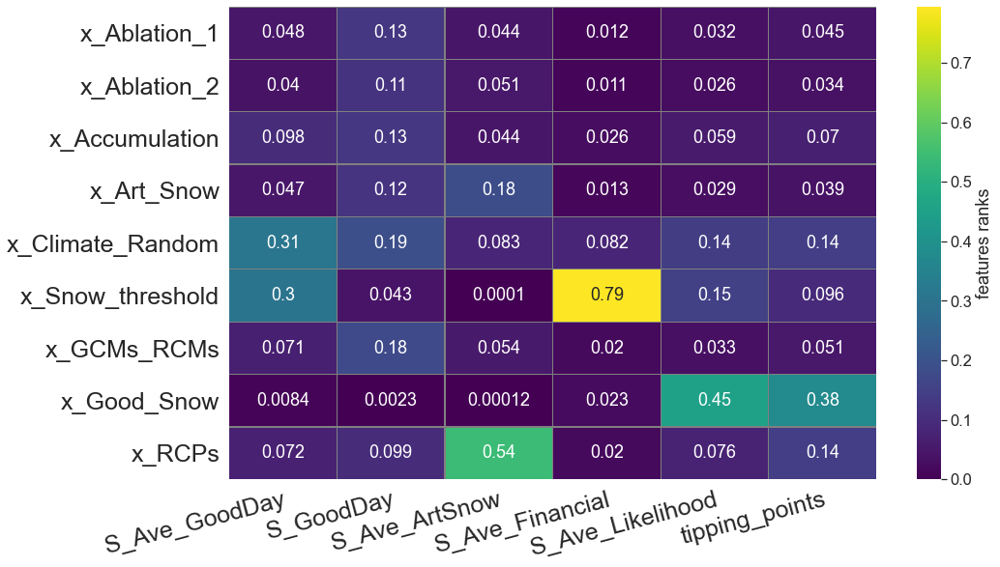

In [59]:
from ema_workbench.analysis import feature_scoring

fig6, ax6 = plt.subplots(figsize=(15,9))

x = experiments
#x = new_dict_experiments
#Y = outcomes
Y = new_dict
fs = feature_scoring.get_feature_scores_all(x, Y)
ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.28,linecolor="grey",
                  cbar_kws={'label': 'features ranks'})

# Rotate the tick labels and set their alignment.
plt.setp(ax6.get_xticklabels(), rotation=15, size = 25, ha="right",
         rotation_mode="anchor")

ylabels = ['x_Ablation_1', 'x_Ablation_2', 'x_Accumulation', 'x_Art_Snow', 'x_Climate_Random', 'x_Snow_threshold', 'x_GCMs_RCMs', 'x_Good_Snow', 'x_RCPs']
ax6.set_yticklabels(ylabels)
plt.setp(ax6.get_yticklabels(), rotation=0, size = 25, ha="right", rotation_mode="anchor")

#ax6.legend(size=13)

plt.show()

fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.svg'), format='svg', dpi=300)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.tiff'), format='tiff', dpi=150)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.jpg'), format='jpg', dpi=150)

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

[MainProcess/INFO] model dropped from analysis because only a single category


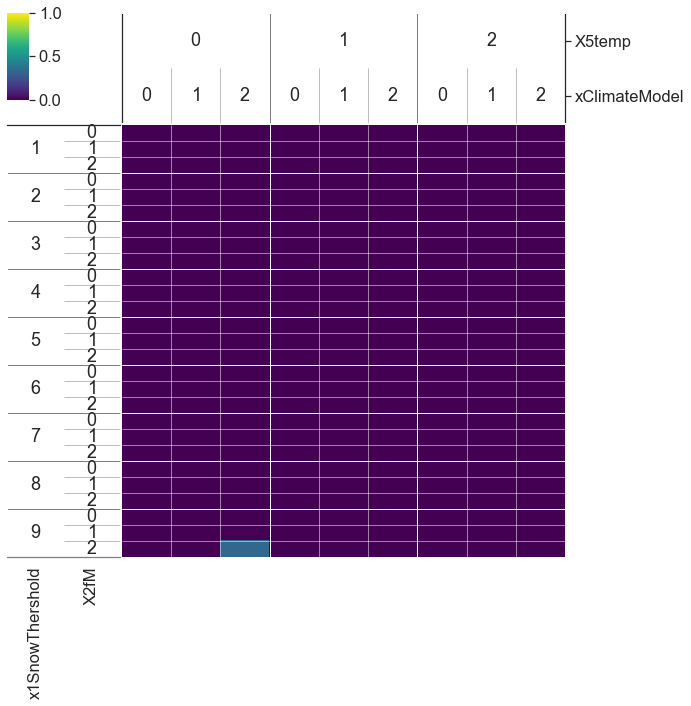

In [60]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_GoodDay'] < 100
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_gooddays.svg'), format='svg', dpi=600)

[MainProcess/INFO] model dropped from analysis because only a single category


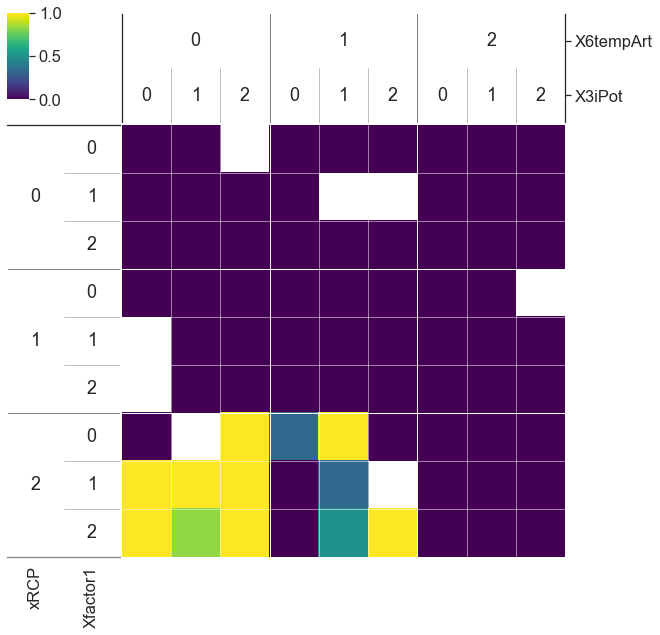

In [61]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_ArtSnow'] < 130
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Artificial.svg'), format='svg', dpi=300)

[MainProcess/INFO] model dropped from analysis because only a single category


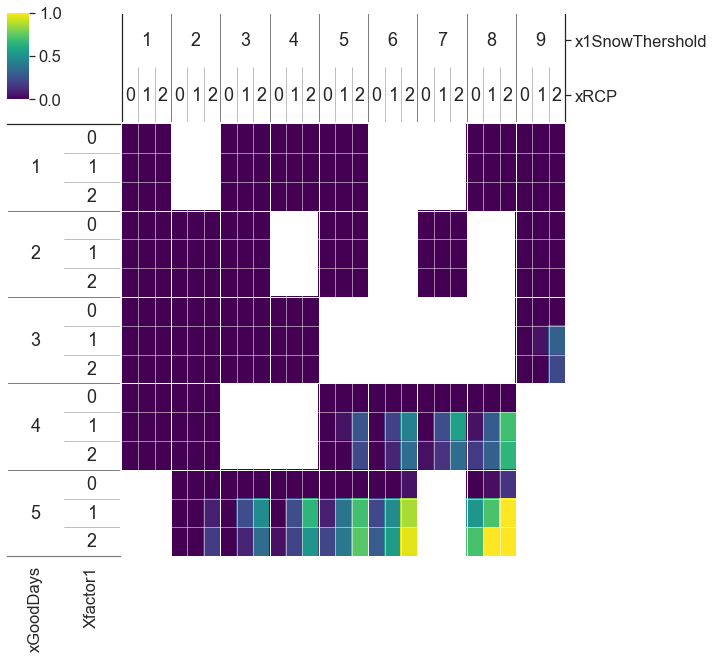

In [62]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.8
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Liklehood.svg'), format='svg', dpi=600)

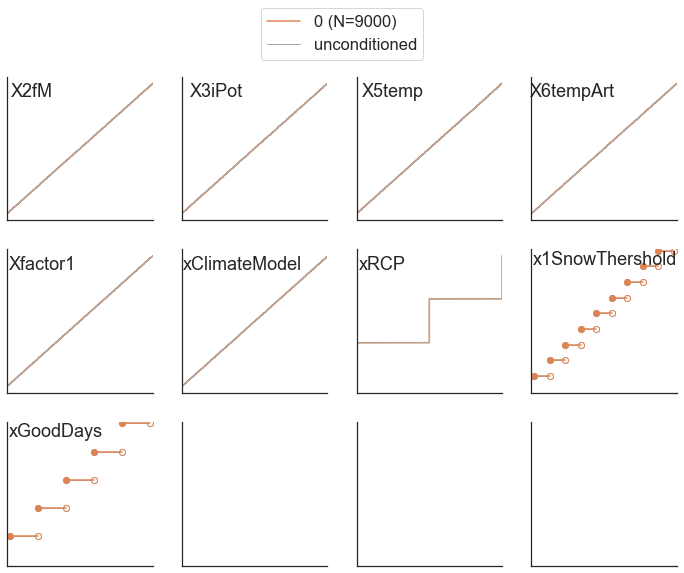

In [63]:
from ema_workbench.analysis import regional_sa
from numpy.lib import recfunctions as rf

sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_GoodDay'] < 60
fig10 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig10.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_gooddays.svg'), format='svg', dpi=600)

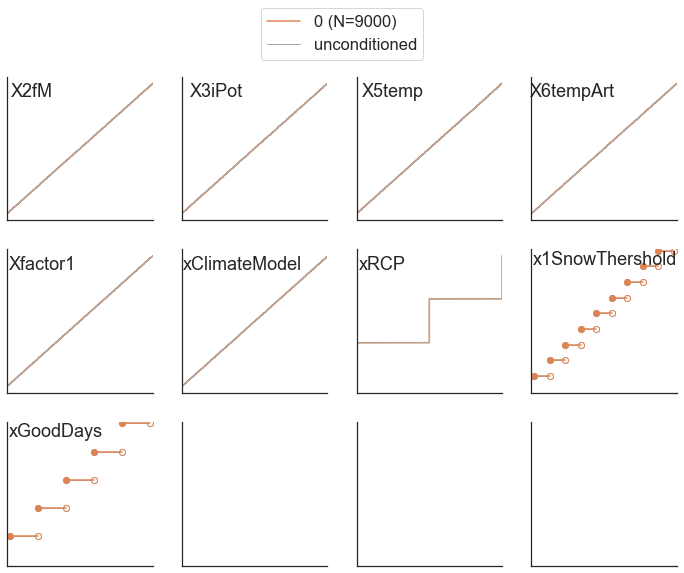

In [64]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_ArtSnow'] < 50
fig12 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig12.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

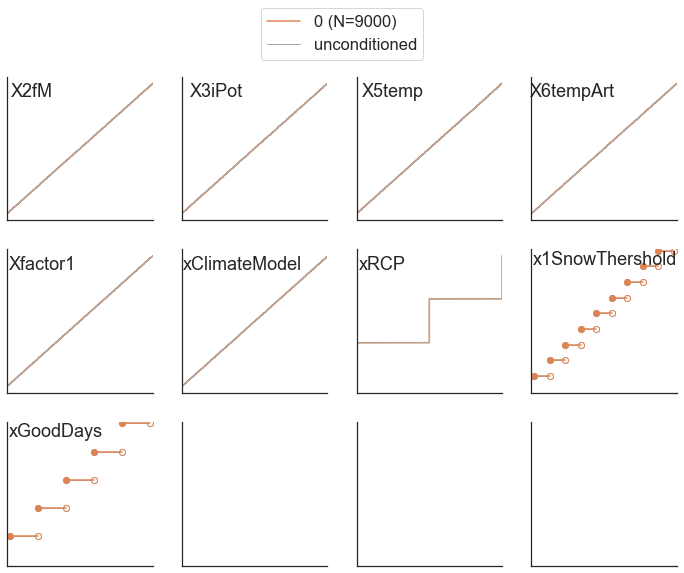

In [65]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_Likelihood'] < 0.5
fig11 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

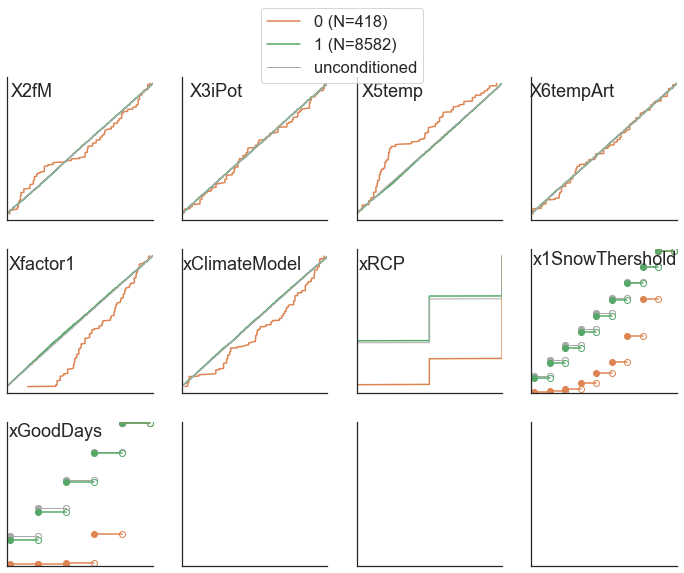

In [67]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['tipping_points'] < 5
fig11_2 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11_2.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_tipping_points.svg'), format='svg', dpi=600)

### Scatter Plots (Inputs vs Outputs)

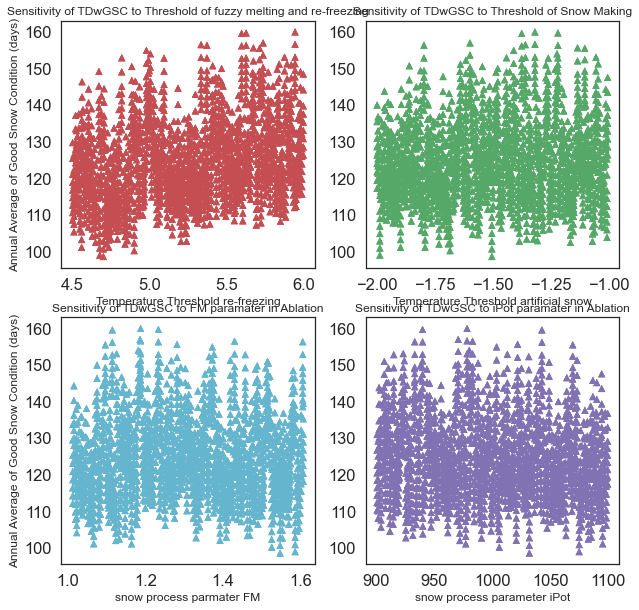

In [68]:
#fig, (ax1, ax2) = plt.subplots(1,2)
fig13, axs = plt.subplots(2, 2, figsize=(10,10))
#axs[0,0].scatter(xGoodDays, y, s = 200, c='b' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Good Days Condition')

#axs[0,1].scatter(x1SnowThershold, y, s = 200, c='orange' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Snow Threshold Condition')

axs[0,0].scatter(x5, YY, s = 50, c='r' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[0,1].scatter(x6, YY, s = 50, c='g' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')

axs[1,0].scatter(x2, YY, s = 50, c='c' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[1,1].scatter(x3, YY, s = 50, c='m' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')


# produce a legend with the unique colors from the scatter
#axs[0,0].set_xlabel("Good Days Condition")
#axs[0,1].set_xlabel("Snow Threshold Condition")
axs[0,0].set_xlabel("Temperature Threshold re-freezing", size = 12)
axs[0,1].set_xlabel("Temperature Threshold artificial snow", size = 12)
axs[1,0].set_xlabel("snow process parmater FM",size = 12)
axs[1,1].set_xlabel("snow process parameter iPot", size = 12)


axs[0,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[0,1].set_ylabel("Frequency of Tipping points")
axs[1,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[1,1].set_ylabel("Frequency of Tipping points")
#axs[2,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[2,1].set_ylabel("Frequency of Tipping points")

#axs[0,0].set_title('Sensitivity of TDwGSC to Policy-1 (less that 100 days)')
#axs[0,1].set_title('Sensitivity of TDwGSC to Policy-2 (300 mm)')
axs[0,0].set_title('Sensitivity of TDwGSC to Threshold of fuzzy melting and re-freezing', size = 12)
axs[0,1].set_title('Sensitivity of TDwGSC to Threshold of Snow Making', size = 12)
axs[1,0].set_title('Sensitivity of TDwGSC to FM paramater in Ablation', size = 12)
axs[1,1].set_title('Sensitivity of TDwGSC to iPot paramater in Ablation', size = 12)


#axs[0,0].text(0, 130, r'A', fontsize=15)
#axs[0,1].text(-1.9, 130, r'B', fontsize=15)
#axs[1,0].text(1.04, 130, r'C', fontsize=15)
#axs[1,1].text(920, 130, r'D', fontsize=15)

fig13.savefig(os.path.join(rootVisualization, 'SA4_All.svg'), format='svg', dpi=300)

plt.show()

## 3D Scatter Plot

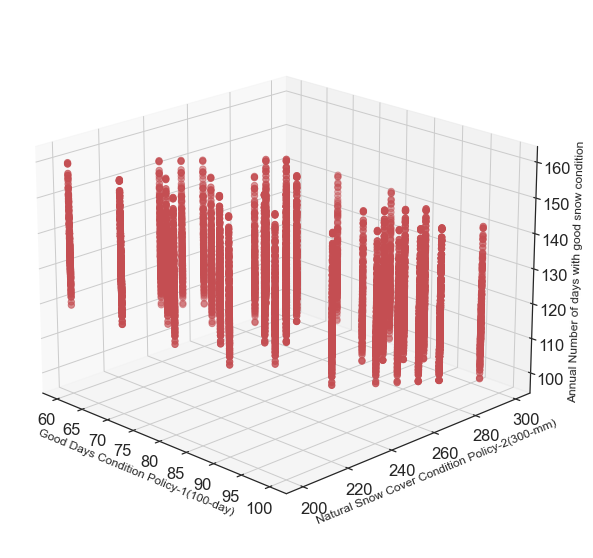

In [69]:
from mpl_toolkits.mplot3d import Axes3D 
fig14 = plt.figure(figsize=(15,10))
ax = fig14.add_subplot(111, projection='3d')

ax.scatter(xGoodDays, x1SnowThershold, YY, s = 40, c='r', marker='o')

ax.set_xlabel('Good Days Condition Policy-1(100-day)', size = 12)
ax.set_ylabel('Natural Snow Cover Condition Policy-2(300-mm)', size = 12)
ax.set_zlabel('Annual Number of days with good snow condition', size = 12)


#ax.scatter(100, 300, 40, color='green')


#x = np.linspace(75,100,5)
#y = np.linspace(220,300,16)
#X,Y = np.meshgrid(x,y)
#Z= X + Y -X - Y + 40 
#surf = ax.plot_surface(X, Y, Z, alpha = 0.2)
ax.view_init(20, -45)

fig14.savefig(os.path.join(rootVisualization, 'SA_Policy_All.svg'), format='svg', dpi=300)
plt.show()

In [70]:
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.326935,957.312700,4.532665,-1.247101,0.935556,0.850193,3.0,250.0,100.0,0,0,UZHModel,121.230737,62,174.08084,146.14476,141.52732,129.27784,164.66968,171.78616,152.80860,98.40772,159.65676,163.95908,148.38032,130.38528,148.58008,141.07348,150.01612,115.27928,118.77668,136.51032,142.45288,112.15136,...,114.94384,99.26352,24.93380,132.61468,110.74144,95.58612,88.82720,135.58640,131.37132,135.42436,19.64296,101.81456,90.36024,151.79756,94.73612,115.11444,34.91448,84.19184,67.33544,122.38692,86.44012,98.15580,104.84660,130.05032,117.02572,60.58184,76.38956,100.44380,98.85812,116.88928,131.843559,4.972881,0.805834,2.0
1,1.564115,1052.845098,5.474877,-1.803193,2.755444,0.536630,3.0,250.0,100.0,1,0,UZHModel,120.463063,53,172.82076,181.00000,168.52000,166.50736,159.79796,177.93936,154.30196,104.79512,173.26764,158.27660,132.52668,160.11724,138.73996,168.25396,181.70988,90.27664,136.45136,171.28656,109.69308,143.08300,...,108.97224,69.48884,87.02692,76.87060,75.01952,105.91940,116.64496,91.13820,141.08480,131.95872,79.93704,95.76156,55.86384,96.66540,42.79856,101.83412,93.79684,55.24480,99.84180,70.18292,80.24476,100.35204,88.12420,93.76524,89.15248,51.91280,51.10992,58.56948,111.06224,100.78756,126.439661,4.943475,0.788524,5.0
2,1.160213,909.670187,5.520439,-1.333493,2.649474,0.720566,3.0,250.0,100.0,2,0,UZHModel,123.273026,58,101.22120,170.40644,178.22572,154.47336,148.04180,127.32504,170.21008,154.69128,170.11844,130.78580,173.46856,145.59076,171.50652,180.68968,170.34360,149.66992,149.25884,174.81016,150.79380,122.31052,...,68.74660,113.15556,90.06620,101.06564,109.24968,121.38300,96.98676,117.03364,123.64324,95.84204,64.46840,111.43768,123.02780,52.34648,87.05228,90.83720,91.73428,105.70244,121.87648,57.04260,126.57752,54.38268,81.55444,77.52804,101.91180,78.00200,102.11712,103.70456,114.19820,72.55712,134.968729,5.057881,0.806072,2.0
3,1.295246,996.188724,5.758656,-1.138981,1.560372,0.013137,2.0,250.0,100.0,3,0,UZHModel,125.922269,12,135.26744,143.47008,181.77520,144.18160,146.47940,132.46120,156.96344,167.07412,117.98468,173.84624,171.04748,159.92180,172.78724,103.46592,182.00000,142.94552,129.89524,142.19840,161.27352,90.46432,...,84.99800,73.49316,106.55560,134.10644,95.68176,114.31556,114.73104,120.94628,120.67904,160.68376,102.14772,118.79156,146.94020,83.86612,95.05592,84.26060,120.51656,125.60440,101.83144,88.52080,109.02196,110.42144,81.25840,79.16852,131.15084,142.09532,104.97912,85.96856,99.12412,104.73728,143.052712,5.155169,0.827192,1.0
4,1.045140,1054.748859,5.265179,-1.532905,2.184067,0.321757,2.0,250.0,100.0,4,0,UZHModel,123.993576,19,171.79800,164.62028,182.00000,141.21448,126.80332,150.14164,130.97340,147.67428,139.80140,180.88652,136.04096,150.57724,172.26592,156.94064,146.14272,152.85104,138.73172,166.13244,154.97188,142.32728,...,151.31984,113.59212,67.21076,101.07164,121.32684,107.44952,100.78712,78.94652,99.35320,87.86904,132.87768,87.83040,65.80708,140.97012,79.78672,141.85572,119.98264,118.38364,102.11892,135.83292,143.14744,117.18868,72.65852,93.94948,103.13188,115.93944,111.06328,142.63504,96.60152,150.84508,140.540932,5.085847,0.813568,3.0


# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [71]:
df_final_ema.tail()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
8995,1.078727,991.219005,5.157671,-1.754204,1.776731,0.780875,1.0,240.0,80.0,195,44,UZHModel,127.158691,9,137.733708,176.763125,130.753250,169.405417,156.224792,142.944833,139.722792,158.629333,154.517375,148.646417,165.864167,181.000000,175.547625,152.497417,97.381208,170.392417,136.275333,141.977250,66.000625,144.663417,...,124.340833,143.563417,84.783875,127.261333,128.123250,129.197833,123.957542,129.729250,90.580625,115.681667,97.714833,115.534000,121.688292,128.252875,169.941667,134.244625,99.293875,107.341125,74.280292,113.140542,108.378667,98.790417,105.287917,127.041958,123.815500,86.157750,80.844208,133.325583,153.956208,131.942750,142.394661,5.294915,0.840349,0.0
8996,1.156532,1024.511250,4.521039,-1.088528,0.711653,0.063395,3.0,240.0,80.0,196,44,UZHModel,129.767401,38,177.061667,174.676167,155.948625,155.696333,137.452375,169.678292,161.261917,174.284125,181.000000,165.903083,175.117083,159.945208,153.940167,173.611917,105.861583,181.000000,167.394208,153.844542,150.192458,122.452667,...,115.348083,118.831667,109.371125,113.970917,40.366208,116.554625,120.791625,117.600875,137.319542,110.425083,107.262625,92.603250,83.864375,140.721292,65.977917,131.642333,108.515417,140.436417,121.907542,84.975375,140.398750,26.364125,136.759917,115.887500,123.141958,110.077750,89.141000,107.146792,62.099875,102.522667,133.360000,5.371271,0.827081,0.0
8997,1.353647,974.252921,5.447876,-1.003626,0.834092,0.168615,3.0,240.0,80.0,197,44,UZHModel,139.223743,41,90.161250,119.807792,173.063125,152.825458,152.568250,162.354792,176.241167,170.732625,167.597458,166.274583,162.377208,166.934167,169.565083,156.549792,146.041875,180.698500,145.391917,153.120917,172.743333,88.872583,...,138.132042,134.334333,147.006417,151.031750,138.664542,151.665667,150.234333,98.088708,152.612375,147.290875,83.937500,141.333042,138.047042,143.077542,136.151375,134.537083,73.119292,106.577375,98.309375,133.381792,135.104375,98.902542,96.333500,120.023000,119.017667,118.392083,159.728583,108.878417,129.317917,142.857167,145.978305,5.770847,0.846840,0.0
8998,1.447386,984.369619,5.691535,-1.715723,2.916666,0.041027,3.0,240.0,80.0,198,44,UZHModel,120.247352,37,102.307542,138.288583,168.008000,125.181667,144.488000,153.855250,147.907792,149.344375,168.250792,168.056375,164.327875,130.756000,132.603958,156.069500,173.766458,180.383708,121.942708,130.345500,164.224917,98.139458,...,129.895208,117.575208,127.215833,94.110708,106.508125,149.860792,115.547792,77.377708,89.507000,79.526333,91.580125,115.470458,105.088667,99.693125,112.765083,92.824375,82.677292,130.247167,73.111125,76.026208,101.795625,74.009375,74.194125,93.051542,69.831458,90.959500,115.445000,125.097333,121.555500,127.511292,127.690169,5.011949,0.832954,0.0
8999,1.417371,916.938661,4.847239,-1.364599,1.836074,0.315159,2.0,240.0,80.0,199,44,UZHModel,122.643204,19,122.150417,165.421208,174.060750,126.679583,121.099458,145.357750,130.730625,150.200792,140.997958,180.965125,138.319000,149.025792,171.488667,158.505875,144.693875,155.747542,132.355917,158.794875,156.833417,144.741875,...,150.219333,115.439208,69.926333,103.443958,122.847875,110.572333,90.836917,77.339625,100.964250,89.103708,133.593833,90.302542,68.004625,141.195750,81.410708,142.230458,121.378208,120.320000,94.645125,136.106292,144.887542,118.978917,75.266083,90.679250,103.953083,116.047583,108.612333,142.741958,97.705125,139.203833,142.509068,5.

In [72]:
filt_S = (df_final_ema['scenario'] == 1)
x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']

In [73]:
x_policy[1]

250.0

In [74]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.564115,1052.845098,5.474877,-1.803193,2.755444,0.53663,3.0,250.0,100.0,1,0,UZHModel,120.463063,53,172.820760,181.000000,168.520000,166.507360,159.797960,177.939360,154.301960,104.795120,173.267640,158.276600,132.526680,160.117240,138.739960,168.253960,181.709880,90.276640,136.451360,171.286560,109.693080,143.083000,...,108.972240,69.488840,87.026920,76.870600,75.019520,105.919400,116.644960,91.138200,141.084800,131.958720,79.937040,95.761560,55.863840,96.665400,42.798560,101.834120,93.796840,55.244800,99.841800,70.182920,80.244760,100.352040,88.124200,93.765240,89.152480,51.912800,51.109920,58.569480,111.062240,100.787560,126.439661,4.943475,0.788524,5.0
201,1.564115,1052.845098,5.474877,-1.803193,2.755444,0.53663,3.0,290.0,90.0,1,1,UZHModel,112.463853,53,166.264276,180.250897,162.274310,155.980345,153.555621,170.300172,149.277000,93.799690,168.128655,146.374310,122.004897,157.627069,130.666103,162.360517,180.633759,81.352310,126.808276,164.641483,97.002828,129.024517,...,98.163621,59.904172,77.629138,66.682931,64.672000,95.802414,107.180103,82.830862,138.164724,119.219414,75.639069,86.310828,48.158483,92.097414,36.895310,95.255862,87.262103,47.624828,92.868207,64.390759,69.176517,92.320310,80.829172,88.489828,76.855586,44.752414,44.060276,50.490931,101.037345,86.885828,126.439661,4.279831,0.786906,4.0
401,1.564115,1052.845098,5.474877,-1.803193,2.755444,0.53663,3.0,200.0,70.0,1,2,UZHModel,130.519856,53,180.159700,181.000000,173.698100,175.111150,169.027250,180.957550,161.442700,120.188950,179.377450,167.287550,147.174650,160.997400,150.720750,177.050300,182.000000,102.472050,152.284900,179.917400,117.000350,159.896050,...,119.396900,85.147000,102.108400,90.059450,93.774400,115.684350,127.629500,100.303700,145.595850,142.037400,86.023800,102.464150,69.715000,103.929900,53.498200,109.303200,103.287400,67.808950,109.113150,78.106500,96.732900,111.421800,100.909350,101.971450,107.278750,64.891000,63.887400,73.211850,122.133650,125.396050,126.439661,6.651271,0.836273,0.0
601,1.564115,1052.845098,5.474877,-1.803193,2.755444,0.53663,3.0,240.0,100.0,1,3,UZHModel,122.471890,53,174.521625,181.000000,169.448250,168.777000,161.387083,179.223375,155.635208,107.818917,174.414458,160.379875,135.089500,160.297625,140.855500,169.972875,181.864458,92.609250,139.220167,172.936167,112.146292,147.211458,...,111.207167,72.384208,89.653042,79.597292,78.145333,108.043792,118.947458,93.352292,141.921667,135.082000,80.989083,97.129000,58.191500,97.943125,44.581833,103.421625,95.642375,57.518542,101.699250,71.690542,83.508500,102.610083,90.257792,95.278417,92.722583,54.075833,53.239500,61.009875,113.419542,104.987042,126.439661,5.091017,0.793746,4.0
801,1.564115,1052.845098,5.474877,-1.803193,2.755444,0.53663,3.0,250.0,60.0,1,4,UZHModel,120.463063,53,172.820760,181.000000,168.520000,166.507360,159.797960,177.939360,154.301960,104.795120,173.267640,158.276600,132.526680,160.117240,138.739960,168.253960,181.709880,90.276640,136.451360,171.286560,109.693080,143.083000,...,108.972240,69.488840,87.026920,76.870600,75.019520,105.919400,116.644960,91.138200,141.084800,131.958720,79.937040,95.761560,55.863840,96.665400,42.798560,101.834120,93.796840,55.244800,99.841800,70.182920,80.244760,100.352040,88.124200,93.765240,89.152480,51.912800,51.109920,58.569480,111.062240,100.787560,126.439661,4.943475,0.833283,1.0
1001,1.564115,1052.845098,5.474877,-1.803193,2.755444

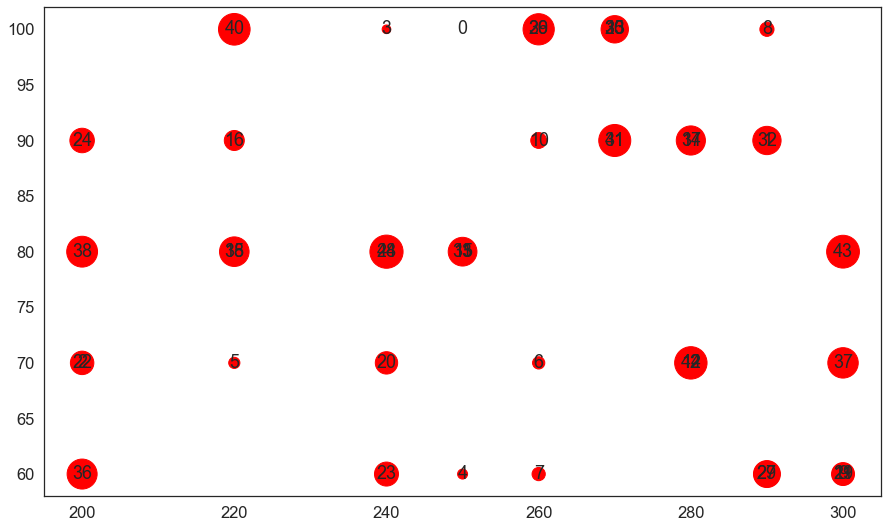

In [75]:
#x_policy = x1SnowThershold 
#y_policy = xGoodDays 

#ranking = np.random.normal(size=9000)
#scenarios = df_final_ema['policy'].values


fig, ax_n = plt.subplots(figsize=(15,9))


x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']
#colors = np.random.rand(N)


# Because the price is much too small when being provided as size for ``s``,
# we normalize it to some useful point sizes, s=0.3*(price*3)**2
ax_n.scatter(x_policy, y_policy, s = scenarios * 25, c = 'red' , cmap="Spectral")

for x_pos, y_pos, label in zip(x_policy, y_policy, scenarios):
    ax_n.annotate(label,
                xy=(x_pos, y_pos),
                xytext=(0, 0),
                textcoords='offset points',
                ha='center',
                va='center')

plt.show()

### Defining the Q0.9 and Q0.1 databases

In [76]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[94.58669103]
[107.93236607]
[137.51067394]
[157.10597519]
[172.22470673]
(118, 1)
[3.67]
[4.45]
[5.71]
[6.67]
[7.64]
(118, 1)
[141.976]
[150.3]
[156.26]
[163.005]
[167.289]
(118, 1)
[100.]
[100.]
[100.]
[100.]
[100.]
(118, 1)


In [77]:
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000


In [78]:
print(matrix_GoodDays[:, :, 1:2].shape)
print(matrix_GoodDays[3, 0, 1:2])
print(matrix_GoodDays[4].shape)

(9000, 119, 1)
['isOverSnow_sc_45_11']
(119, 2)


## Analysis for different RCP2.6, RCP4.5, and RCP8.5
### Calculate quantiles for each RCP scenarios

In [79]:
q10_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.9, axis=0)



#2020/08/13
q10_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.9, axis=0)


q10_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.9, axis=0)


#### Make dataframes from quantiles

In [80]:
dfq50_26 = pd.DataFrame(q50_years_26)
dfq50_26.columns = ['median26']
dfq50_45 = pd.DataFrame(q50_years_45)
dfq50_45.columns = ['median45']
dfq50_85 = pd.DataFrame(q50_years_85)
dfq50_85.columns = ['median85']

dfq90_26 = pd.DataFrame(q90_years_26)
dfq90_26.columns = ['Q90_26']
dfq90_45 = pd.DataFrame(q90_years_45)
dfq90_45.columns = ['Q90_45']
dfq90_85 = pd.DataFrame(q90_years_85)
dfq90_85.columns = ['Q90_85']

dfq10_26 = pd.DataFrame(q10_years_26)
dfq10_26.columns = ['Q10_26']
dfq10_45 = pd.DataFrame(q10_years_45)
dfq10_45.columns = ['Q10_45']
dfq10_85 = pd.DataFrame(q10_years_85)
dfq10_85.columns = ['Q10_85']

### 2020/08/13
dfq50_fin_26 = pd.DataFrame(q50_years_fin_26)
dfq50_fin_26.columns = ['median26']
dfq50_fin_45 = pd.DataFrame(q50_years_fin_45)
dfq50_fin_45.columns = ['median45']
dfq50_fin_85 = pd.DataFrame(q50_years_fin_85)
dfq50_fin_85.columns = ['median85']

dfq90_fin_26 = pd.DataFrame(q90_years_fin_26)
dfq90_fin_26.columns = ['median26']
dfq90_fin_45 = pd.DataFrame(q90_years_fin_45)
dfq90_fin_45.columns = ['median45']
dfq90_fin_85 = pd.DataFrame(q90_years_fin_85)
dfq90_fin_85.columns = ['median85']

dfq10_fin_26 = pd.DataFrame(q10_years_fin_26)
dfq10_fin_26.columns = ['median26']
dfq10_fin_45 = pd.DataFrame(q10_years_fin_45)
dfq10_fin_45.columns = ['median45']
dfq10_fin_85 = pd.DataFrame(q10_years_fin_85)
dfq10_fin_85.columns = ['median85']

dfq50_Art_26 = pd.DataFrame(q50_years_Art_26)
dfq50_Art_26.columns = ['median26']
dfq50_Art_45 = pd.DataFrame(q50_years_Art_45)
dfq50_Art_45.columns = ['median45']
dfq50_Art_85 = pd.DataFrame(q50_years_Art_85)
dfq50_Art_85.columns = ['median85']

dfq90_Art_26 = pd.DataFrame(q90_years_Art_26)
dfq90_Art_26.columns = ['median26']
dfq90_Art_45 = pd.DataFrame(q90_years_Art_45)
dfq90_Art_45.columns = ['median45']
dfq90_Art_85 = pd.DataFrame(q90_years_Art_85)
dfq90_Art_85.columns = ['median85']

dfq10_Art_26 = pd.DataFrame(q10_years_Art_26)
dfq10_Art_26.columns = ['median26']
dfq10_Art_45 = pd.DataFrame(q10_years_Art_45)
dfq10_Art_45.columns = ['median45']
dfq10_Art_85 = pd.DataFrame(q10_years_Art_85)
dfq10_Art_85.columns = ['median85']

dfq50_Like_26 = pd.DataFrame(q50_years_Like_26)
dfq50_Like_26.columns = ['median26']
dfq50_Like_45 = pd.DataFrame(q50_years_Like_45)
dfq50_Like_45.columns = ['median45']
dfq50_Like_85 = pd.DataFrame(q50_years_Like_85)
dfq50_Like_85.columns = ['median85']

dfq90_Like_26 = pd.DataFrame(q90_years_Like_26)
dfq90_Like_26.columns = ['median26']
dfq90_Like_45 = pd.DataFrame(q90_years_Like_45)
dfq90_Like_45.columns = ['median45']
dfq90_Like_85 = pd.DataFrame(q90_years_Like_85)
dfq90_Like_85.columns = ['median85']

dfq10_Like_26 = pd.DataFrame(q10_years_Like_26)
dfq10_Like_26.columns = ['median26']
dfq10_Like_45 = pd.DataFrame(q10_years_Like_45)
dfq10_Like_45.columns = ['median45']
dfq10_Like_85 = pd.DataFrame(q10_years_Like_85)
dfq10_Like_85.columns = ['median85']

In [81]:
dfq50_26.head()

,median26
0,135.068880
1,148.735481
2,159.287727
3,155.074720
4,154.270280


In [82]:
dfAllAverages = pd.concat((dfq50_26, dfq50_45, dfq50_85), axis=1)
dfAllAverages_Q90 = pd.concat((dfq90_26, dfq90_45, dfq90_85), axis=1)
dfAllAverages_Q10 = pd.concat((dfq10_26, dfq10_45, dfq10_85), axis=1)

dfAllAverages_fin = pd.concat((dfq50_fin_26, dfq50_fin_45, dfq50_fin_85), axis=1)
dfAllAverages_Q90_fin = pd.concat((dfq90_fin_26, dfq90_fin_45, dfq90_fin_85), axis=1)
dfAllAverages_Q10_fin = pd.concat((dfq10_fin_26, dfq10_fin_45, dfq10_fin_85), axis=1)

dfAllAverages_Art = pd.concat((dfq50_Art_26, dfq50_Art_45, dfq50_Art_85), axis=1)
dfAllAverages_Q90_Art = pd.concat((dfq90_Art_26, dfq90_Art_45, dfq90_Art_85), axis=1)
dfAllAverages_Q10_Art = pd.concat((dfq10_Art_26, dfq10_Art_45, dfq10_Art_85), axis=1)

dfAllAverages_Like = pd.concat((dfq50_Like_26, dfq50_Like_45, dfq50_Like_85), axis=1)
dfAllAverages_Q90_Like = pd.concat((dfq90_Like_26, dfq90_Like_45, dfq90_Like_85), axis=1)
dfAllAverages_Q10_Like = pd.concat((dfq10_Like_26, dfq10_Like_45, dfq10_Like_85), axis=1)

In [83]:
dfAllAverages.head()

,median26,median45,median85
0,135.068880,131.517214,145.485938
1,148.735481,149.414759,144.497716
2,159.287727,160.161000,157.618183
3,155.074720,145.337720,152.516673
4,154.270280,142.716583,149.823195


In [84]:
print('*** All RCPs***')
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)
print('*** RCP2.6***')
print(q10_years_26[0])
print(q25_years_26[0])
print(q50_years_26[0])
print(q75_years_26[0])
print(q90_years_26[0])
print(q50_years_26.shape)
print('*** RCP4.5***')
print(q10_years_45[0])
print(q25_years_45[0])
print(q50_years_45[0])
print(q75_years_45[0])
print(q90_years_45[0])
print(q50_years_45.shape)
print('*** RCP8.5***')
print(q10_years_85[0])
print(q25_years_85[0])
print(q50_years_85[0])
print(q75_years_85[0])
print(q90_years_85[0])
print(q50_years_85.shape)

*** All RCPs***
[94.58669103]
[107.93236607]
[137.51067394]
[157.10597519]
[172.22470673]
(118, 1)
*** RCP2.6***
[96.69486667]
[108.6658]
[135.06888]
[155.31434483]
[167.98840909]
(118, 1)
*** RCP4.5***
[93.29307407]
[107.00653571]
[131.51721429]
[154.81851852]
[170.75113636]
(118, 1)
*** RCP8.5***
[94.41389655]
[108.44806897]
[145.48593769]
[162.75590909]
[174.38304]
(118, 1)


In [85]:
print('*** All RCPs***')
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)
print('*** RCP2.6***')
print(q10_years_fin_26[0])
print(q25_years_fin_26[0])
print(q50_years_fin_26[0])
print(q75_years_fin_26[0])
print(q90_years_fin_26[0])
print(q50_years_fin_26.shape)
print('*** RCP4.5***')
print(q10_years_fin_45[0])
print(q25_years_fin_45[0])
print(q50_years_fin_45[0])
print(q75_years_fin_45[0])
print(q90_years_fin_45[0])
print(q50_years_fin_45.shape)
print('*** RCP8.5***')
print(q10_years_fin_85[0])
print(q25_years_fin_85[0])
print(q50_years_fin_85[0])
print(q75_years_fin_85[0])
print(q90_years_fin_85[0])
print(q50_years_fin_85.shape)

*** All RCPs***
[3.67]
[4.45]
[5.71]
[6.67]
[7.64]
(118, 1)
*** RCP2.6***
[3.81]
[4.45]
[5.65]
[6.55]
[7.57]
(118, 1)
*** RCP4.5***
[3.57]
[4.37]
[5.61]
[6.58]
[7.37]
(118, 1)
*** RCP8.5***
[3.68]
[4.58]
[5.895]
[6.79]
[7.81]
(118, 1)


#### Set the parameters of making figure

In [86]:
p_Step = 20
alpha_Fade = 0.11

### RCP 2.6 Number of days with Good Snow Condition over the time

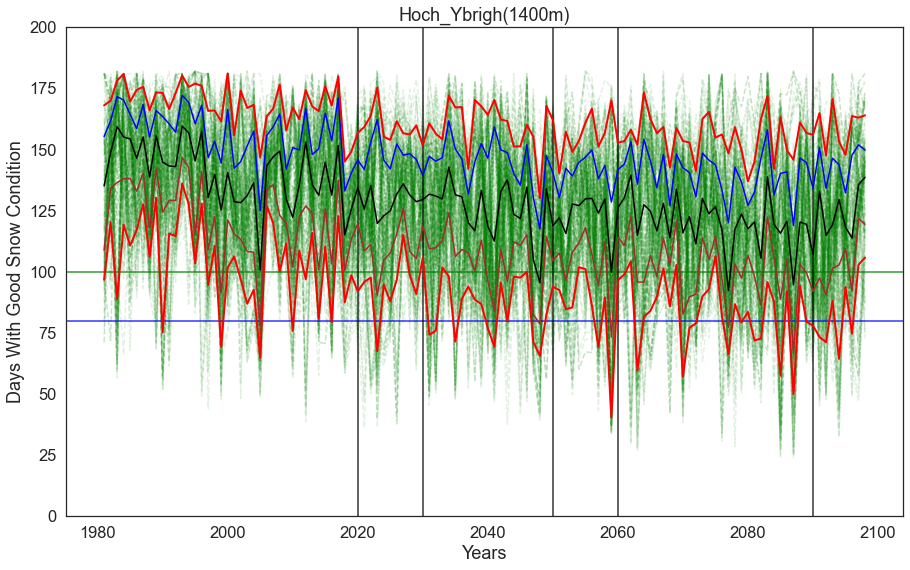

In [87]:
fig15, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_26, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig15.savefig(os.path.join(rootVisualization, 'RCP26.svg'), format='svg', dpi=300)
plt.show()

### RCP 4.5 Number of days with Good Snow Condition over the time

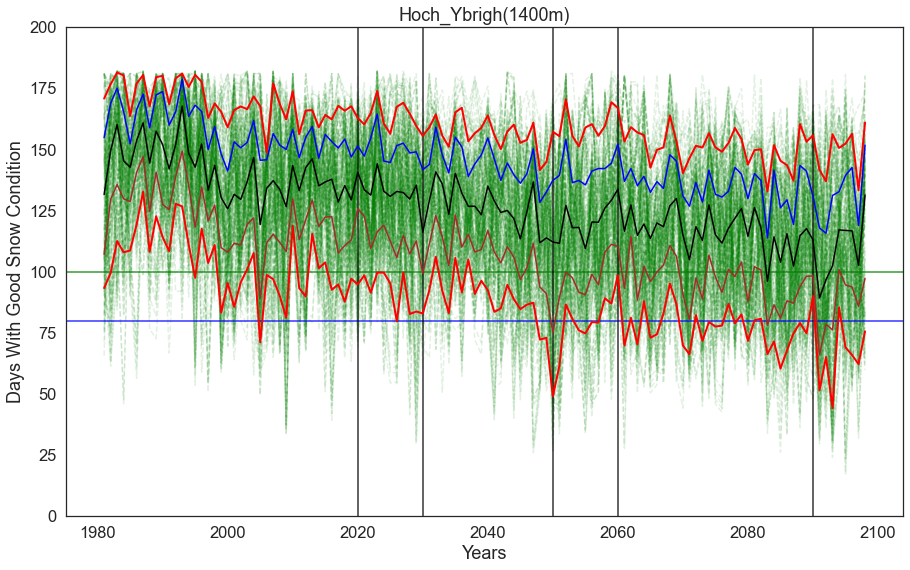

In [88]:
fig16, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_45, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig16.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

### RCP 8.5 Number of days with Good Snow Condition over the time

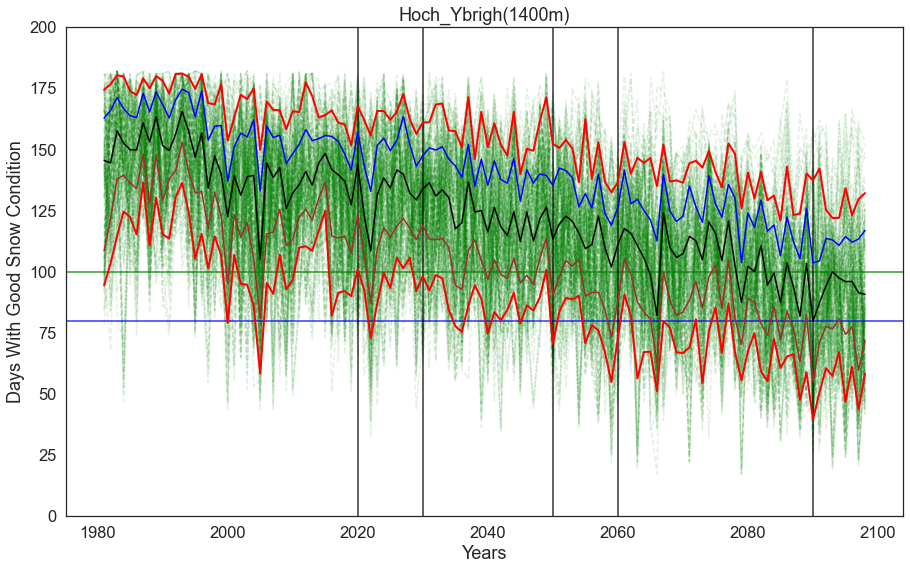

In [89]:
fig17, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_85, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig17.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

In [90]:
title_Figs = 'case6_Davos Jakobhorn, elv_b 2250m, RCP2.6'

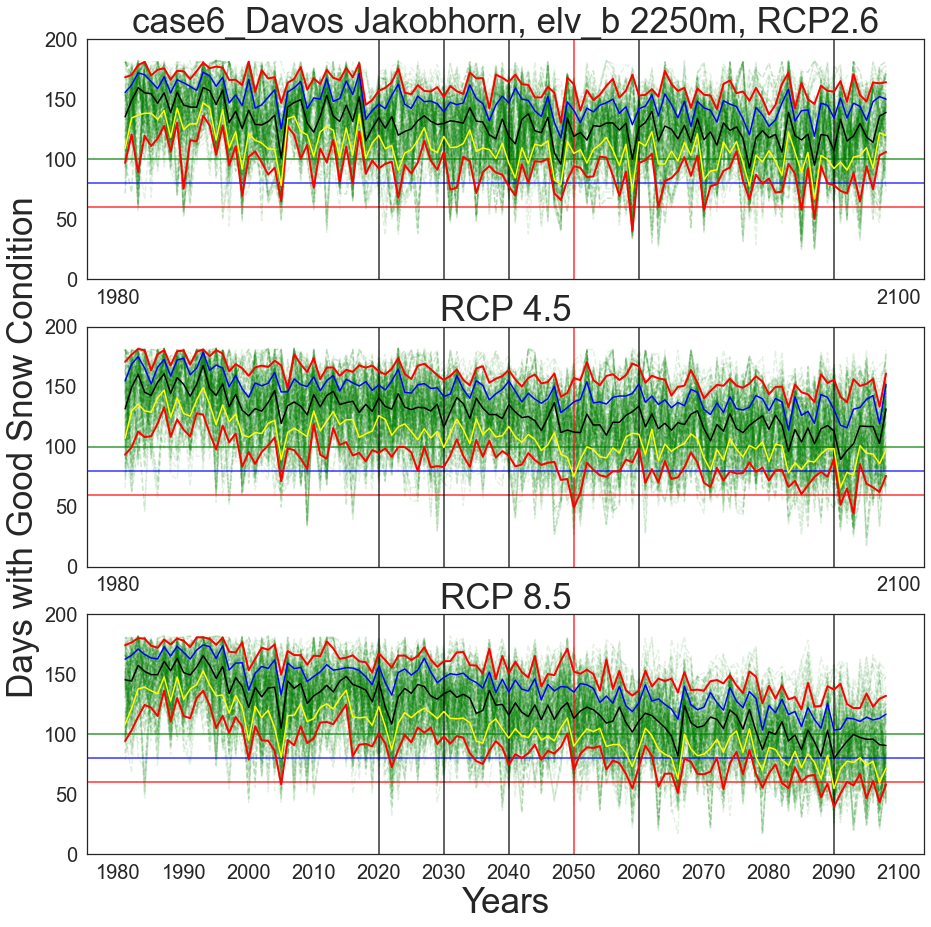

In [91]:
fig18, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)    

    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=100, color='green', alpha=0.8)
axs[0].axhline(y=80, color='blue', alpha=0.8)
axs[0].axhline(y=60, color='red', alpha=0.8)

axs[1].axhline(y=100, color='green', alpha=0.8)
axs[1].axhline(y=80, color='blue', alpha=0.8)
axs[1].axhline(y=60, color='red', alpha=0.8)

axs[2].axhline(y=100, color='green', alpha=0.8)
axs[2].axhline(y=80, color='blue', alpha=0.8)
axs[2].axhline(y=60, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =200)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =200)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Days with Good Snow Condition', fontsize=35)

axs[2].set_ylim(bottom=0, top =200)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)

fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.svg'), format='svg', dpi=300)
fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.tiff'), format='tiff', dpi=150)

plt.show()

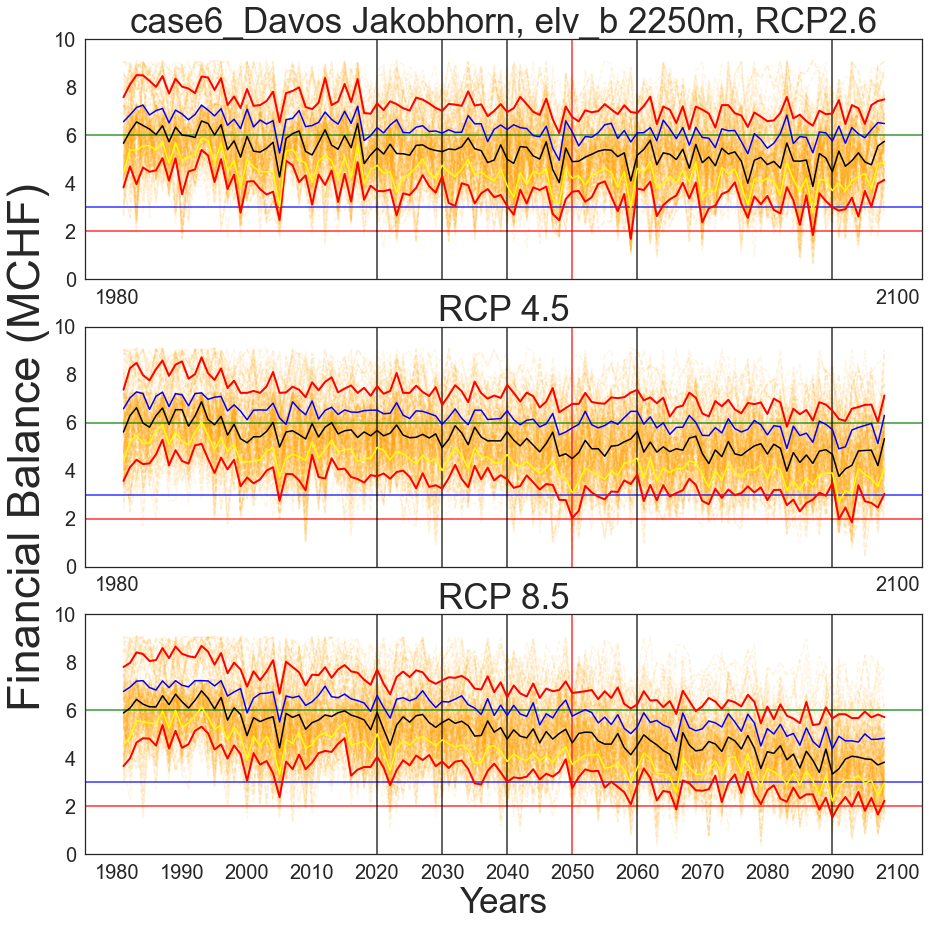

In [92]:
fig19, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_fin26), p_Step):
    a = matrix_fin26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin45), p_Step):
    a = matrix_fin45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin85), p_Step):
    a = matrix_fin85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)    

axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=6, color='green', alpha=0.8)
axs[0].axhline(y=3, color='blue', alpha=0.8)
axs[0].axhline(y=2, color='red', alpha=0.8)

axs[1].axhline(y=6, color='green', alpha=0.8)
axs[1].axhline(y=3, color='blue', alpha=0.8)
axs[1].axhline(y=2, color='red', alpha=0.8)

axs[2].axhline(y=6, color='green', alpha=0.8)
axs[2].axhline(y=3, color='blue', alpha=0.8)
axs[2].axhline(y=2, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_fin_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_fin_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_fin_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_fin_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_fin_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_fin_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_fin_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_fin_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_fin_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_fin_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_fin_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =10)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =10)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Financial Balance (MCHF)', fontsize=45)

axs[2].set_ylim(bottom=0, top =10
               )
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)


fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.svg'), format='svg', dpi=300)
fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.tiff'), format='tiff', dpi=150)


plt.show()

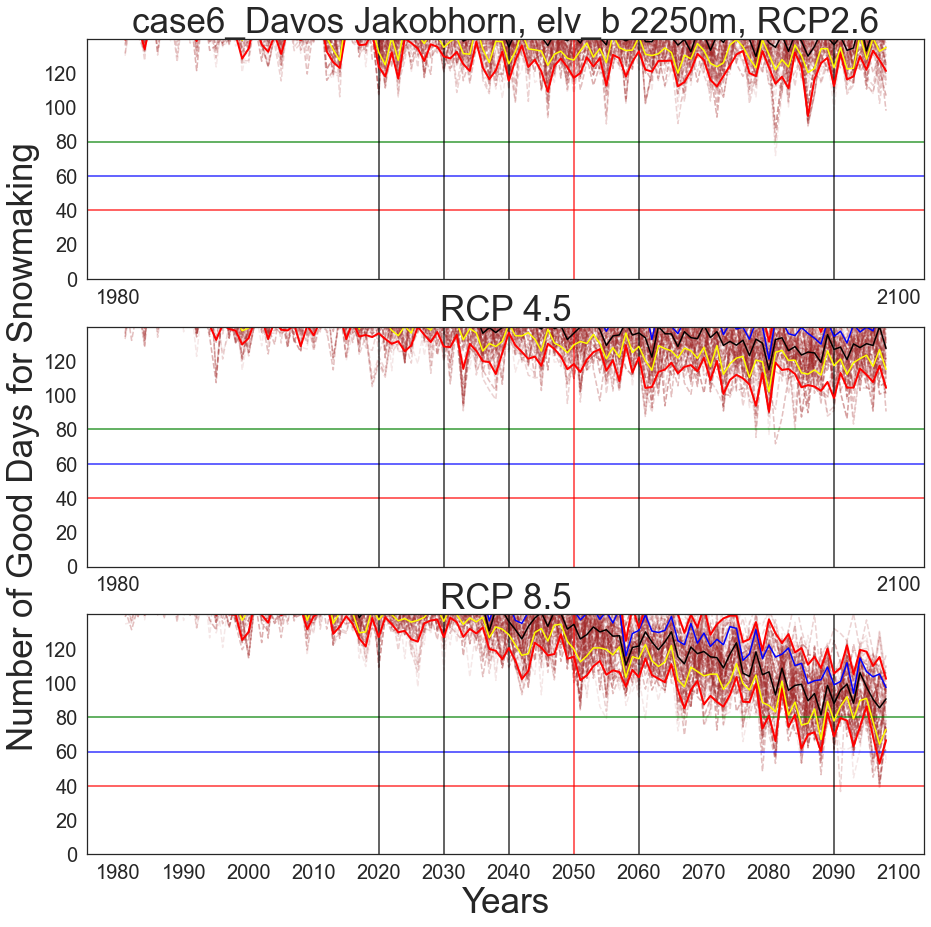

In [93]:
fig20, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Art26), p_Step):
    a = matrix_Art26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art45), p_Step):
    a = matrix_Art45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art85), p_Step):
    a = matrix_Art85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)    

    
    
    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=60, color='blue', alpha=0.8)
axs[0].axhline(y=40, color='red', alpha=0.8)

axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=60, color='blue', alpha=0.8)
axs[1].axhline(y=40, color='red', alpha=0.8)

axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=60, color='blue', alpha=0.8)
axs[2].axhline(y=40, color='red', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Art_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Art_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Art_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Art_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Art_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Art_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Art_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Art_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Art_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Art_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Art_85, color='red', linewidth = 2, alpha=1)



axs[0].set_ylim(bottom=0, top =140)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)

axs[1].set_ylim(bottom=0, top =140)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Number of Good Days for Snowmaking', fontsize=35)

axs[2].set_ylim(bottom=0, top =140)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)


fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.svg'), format='svg', dpi=300)
fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.tiff'), format='tiff', dpi=150)


plt.show()

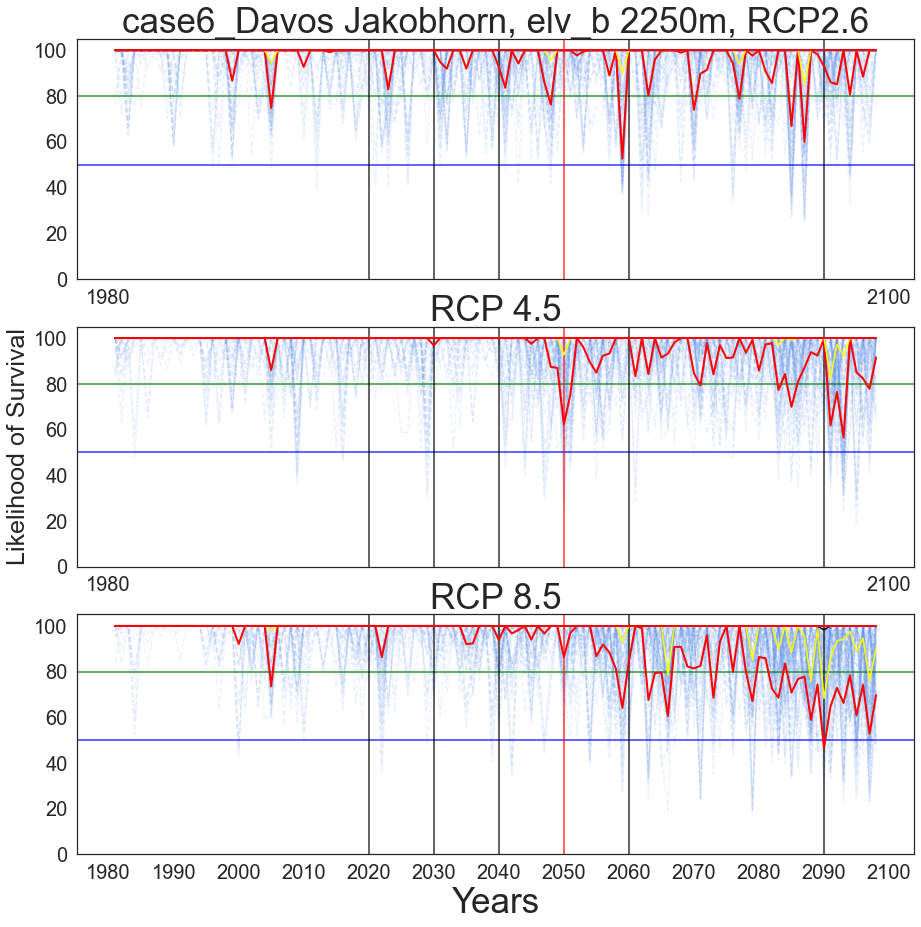

In [94]:
fig21, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Like26), p_Step):
    a = matrix_Like26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like45), p_Step):
    a = matrix_Like45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like85), p_Step):
    a = matrix_Like85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)    


axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)    
    

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=50, color='blue', alpha=0.8)
axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=50, color='blue', alpha=0.8)
axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=50, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Like_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Like_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Like_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Like_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Like_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Like_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Like_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Like_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Like_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Like_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Like_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =105)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Likelihood of Survival', fontsize=12)

axs[1].set_ylim(bottom=0, top =105)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Likelihood of Survival', fontsize=25)

axs[2].set_ylim(bottom=0, top =105)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)


axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Likelihood of Survival', fontsize=12)


fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.svg'), format='svg', dpi=300)
fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.tiff'), format='tiff', dpi=150)


plt.show()

In [95]:
dfAllAverages.head()

,median26,median45,median85
0,135.068880,131.517214,145.485938
1,148.735481,149.414759,144.497716
2,159.287727,160.161000,157.618183
3,155.074720,145.337720,152.516673
4,154.270280,142.716583,149.823195


### Worst Case: Quantile 0.10 >> 90% of the scenarios satisfy this condition

In [96]:
title_Figs2 = 'Davos Jakobhorn,2250m'

In [97]:
y_axis = np.arange(1981, 2100, step= 20)

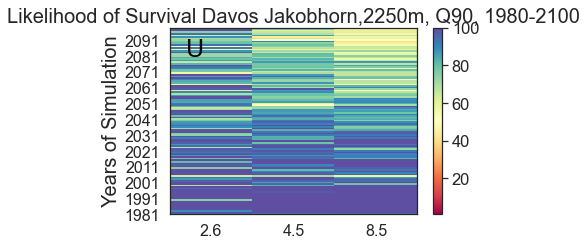

In [99]:
from matplotlib.ticker import FuncFormatter


fig22, (ax3) = plt.subplots(1, 1, figsize=(9,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c3 = ax3.pcolor(dfAllAverages_Q10, cmap='Spectral', vmin=1, vmax=100, offsets = 0.35)
cb3 = fig22.colorbar(c3)

#xticks(np.arange(0, 4, step=1))
ax3.set_title('default: no edges')


#ax3.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax3.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q90, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax3.text(0.2, 100, 'U', color = 'Black', fontsize=25)

fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.svg'), format='svg', dpi=300)
fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.tiff'), format='tiff', dpi=300)


fig22.tight_layout()
plt.show()

### Median Case: Quantile 0.5 >> 50 % of the scenarios satisfy this condition

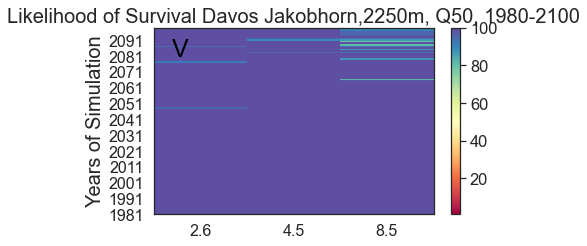

In [100]:
from matplotlib.ticker import FuncFormatter


fig23, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages, cmap='Spectral' ,vmin=1, vmax=100, offsets = .35)
cb4 = fig23.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q50, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'V', color = 'Black', fontsize=25)


fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.svg'), format='svg', dpi=300)
fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.tiff'), format='tiff', dpi=300)
#fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.jpg'), format='jpg', dpi=300)


fig23.tight_layout()
plt.show()

### Best Case: Quantile 0.9 >> Only 10 % of the scenarios satisfy this condition

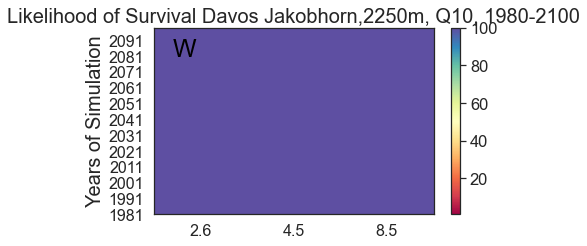

In [101]:
from matplotlib.ticker import FuncFormatter


fig24, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages_Q90, cmap='Spectral' ,vmin=1, vmax=100)
cb4 = fig24.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q10, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'W', color = 'Black', fontsize=25)


fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.svg'), format='svg', dpi=300)
fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.tiff'), format='tiff', dpi=300)



fig24.tight_layout()
plt.show()

### Making dataframes for all RCP2.6 , RCP4.5, and RCP8.5 scenarios

In [102]:
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(matrix_GoodDays.shape)

(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
(9000, 119, 2)


In [103]:
pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1]).head()

,Season
0,1981-1982
1,1982-1983
2,1983-1984
3,1984-1985
4,1985-1986


In [104]:
df26_all = pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1])
for i in range(len(matrix_GoodDays26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays26[i,0,1:])])
    df26_all = pd.concat((df26_all, b), axis = 1)

In [105]:
df26_all.head(7)
df26_all.to_csv(os.path.join(rootVisualization, 'df26_all.csv'), index = False)

In [106]:
matrix_GoodDays45[2,0,1:]

array(['isOverSnow_sc_45_1'], dtype='<U47')

In [107]:
df45_all = pd.DataFrame((matrix_GoodDays45[0][1:,0:1]), columns=matrix_GoodDays45[0,0,0:1])
for i in range(len(matrix_GoodDays45)):
    #b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=matrix_GoodDays45[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays45[i,0,1:])])

    df45_all = pd.concat((df45_all, b), axis = 1)

In [108]:
df45_all.head(7)
df45_all.to_csv(os.path.join(rootVisualization, 'df45_all.csv'), index = False)

In [109]:
df85_all = pd.DataFrame((matrix_GoodDays85[0][1:,0:1]), columns=matrix_GoodDays85[0,0,0:1])
for i in range(len(matrix_GoodDays85)):
    #b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=matrix_GoodDays85[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays85[i,0,1:])])

    df85_all = pd.concat((df85_all, b), axis = 1)

In [110]:
df85_all.head(7)
df85_all.to_csv(os.path.join(rootVisualization, 'df85_all.csv'), index = False)

In [111]:
df26_all_Matrix = df26_all.to_numpy()
df45_all_Matrix = df45_all.to_numpy()
df85_all_Matrix = df85_all.to_numpy()

In [112]:
df26_all_fin = pd.DataFrame((matrix_fin26[0][1:,0:1]), columns=matrix_fin26[0,0,0:1])
for i in range(len(matrix_fin26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin26[i,0,1:])])
    df26_all_fin = pd.concat((df26_all_fin, b), axis = 1)

In [113]:
df26_all_fin.head(7)

,Season,sc_1_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_3_['Money_sc_26_9'],sc_4_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_5_['Money_sc_26_6'],sc_6_['Money_sc_26_8'],sc_7_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_8_['Money_sc_26_2'],sc_9_['Money_sc_26_5'],sc_10_['Money_sc_26_10'],sc_11_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_12_['Money_sc_26_6'],sc_13_['Money_sc_26_10'],sc_14_['Money_sc_26_2'],sc_15_['Money_sc_26_12'],sc_16_['Money_sc_26_6'],sc_17_['Money_sc_26_8'],sc_18_['Money_sc_26_8'],sc_19_['Money_sc_26_5'],sc_20_['Money_sc_26_4'],sc_21_['Money_sc_26_5'],sc_22_['Money_sc_26_5'],sc_23_['Money_sc_26_1'],sc_24_['Money_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_25_['Money_sc_26_6'],sc_26_['Money_sc_26_3'],sc_27_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_28_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_29_['Money_sc_26_11'],sc_30_['Money_sc_26_11'],sc_31_['Money_sc_26_3'],sc_32_['Money_sc_26_8'],sc_33_['Money_sc_26_11'],...,sc_2982_['Money_sc_26_7'],sc_2983_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2984_['Money_sc_26_11'],sc_2985_['Money_sc_26_7'],sc_2986_['Money_sc_26_6'],sc_2987_['Money_sc_26_8'],sc_2988_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2989_['Money_sc_26_4'],sc_2990_['Money_sc_26_7'],sc_2991_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2992_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2993_['Money_sc_26_12'],sc_2994_['Money_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2995_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2996_['Money_sc_26_2'],sc_2997_['Money_sc_26_4'],sc_2998_['Money_sc_26_8'],sc_2999_['Money_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_3000_['Money_sc_26_3'],sc_3001_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_3002_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3003_['Money_sc_26_9'],sc_3004_['Money_sc_26_3'],sc_3005_['Money_sc_26_6'],sc_3006_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_3007_['Money_sc_26_10'],sc_3008_['Money_sc_26_6'],sc_3009_['Money_sc_26_1'],sc_3010_['Money_sc_26_5'],sc_3011_['Money_sc_26_11'],sc_3012_['Money_sc_26_9'],sc_3013_['Money_sc_26_6'],sc_3014_['Money_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_3015_['Money_sc_26_10']
0,1981-1982,9.049999999999994,4.61,5.439999999999994,7.339999999999983,8.289999999999985,6.669999999999992,5.669999999999988,5.159999999999999,6.6600000000000055,6.209999999999987,5.879999999999993,7.429999999999982,6.289999999999987,5.549999999999993,4.449999999999999,7.429999999999982,5.369999999999997,8.489999999999988,4.659999999999996,5.579999999999989,4.639999999999995,5.16999999999999,7.379999999999982,6.839999999999985,8.149999999999983,7.209999999999983,9.049999999999994,5.749999999999989,8.339999999999986,8.339999999999986,8.209999999999983,7.569999999999989,8.339999999999986,...,4.400000000000003,4.510000000000002,6.670000000000005,4.709999999999994,6.550000000000005,6.400000000000002,5.370000000000004,4.400000000000003,4.400000000000003,6.050000000000004,7.220000000000005,3.2699999999999974,6.720000000000005,4.530000000000004,4.4700000000000015,4.390000000000003,6.680000000000005,6.720000000000005,5.860000000000005,6.0800000000000045,4.6700000000000035,5.930000000000004,6.150000000000005,6.550000000000005,5.240000000000004,5.160000000000004,6.630000000000005,7.2400000000000055,4.29,5.850000000000005,5.930000000000004,6.550000000000005,6.720000000000005,5.630000000000004
1,1982-1983,8.84999999999999,5.5000000000000036,8.319999999999984,8.66999999999999,7.259999999999987,7.87999999999998,8.029999999999982,8.869999999999992,6.490000000000005,7.179999999999983,6.999999999999986,5.699999999999994,7.179999999999983,7.109999999999986,8.099999999999982,6.1599999999999895,6.250000000000004,8.319999999999984,8.109999999999982,7.339999999999983,8.109999999999982,5.679999999999989,7.309999999999984,7.259999999999987,7.259999999999987,7.629999999999981,8.579999999999988,7.139999999999984,7.96999999999998,7.309999999999983,7.069999999999985,6.879999999999985,7.759999999999981,...,3.5999999999

In [114]:
df45_all_fin = pd.DataFrame((matrix_fin45[0][1:,0:1]), columns=matrix_fin45[0,0,0:1])
for i in range(len(matrix_fin45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin45[i,0,1:])])
    df45_all_fin = pd.concat((df45_all_fin, b), axis = 1)

In [115]:
df45_all_fin.head(7)

,Season,sc_1_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_2_['Money_sc_45_11'],sc_3_['Money_sc_45_1'],sc_4_['Money_sc_45_8'],sc_5_['Money_sc_45_14'],sc_6_['Money_sc_45_21'],sc_7_['Money_sc_45_20'],sc_8_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_9_['Money_sc_45_24'],sc_10_['Money_sc_45_18'],sc_11_['Money_sc_45_12'],sc_12_['Money_sc_45_24'],sc_13_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_14_['Money_sc_45_5'],sc_15_['Money_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_16_['Money_SMHI-RCA-NORESM-EUR44-RCP45-pcp'],sc_17_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_18_['Money_sc_45_9'],sc_19_['Money_sc_45_20'],sc_20_['Money_sc_45_13'],sc_21_['Money_sc_45_18'],sc_22_['Money_SMHI-RCA-IPSL-EUR44-RCP45-pcp'],sc_23_['Money_sc_45_15'],sc_24_['Money_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_25_['Money_sc_45_18'],sc_26_['Money_sc_45_23'],sc_27_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP45-pcp'],sc_28_['Money_sc_45_20'],sc_29_['Money_sc_45_7'],sc_30_['Money_sc_45_19'],sc_31_['Money_sc_45_9'],sc_32_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_33_['Money_sc_45_13'],...,sc_2982_['Money_sc_45_19'],sc_2983_['Money_sc_45_8'],sc_2984_['Money_sc_45_11'],sc_2985_['Money_sc_45_5'],sc_2986_['Money_sc_45_20'],sc_2987_['Money_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_2988_['Money_sc_45_10'],sc_2989_['Money_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_2990_['Money_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_2991_['Money_sc_45_23'],sc_2992_['Money_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_2993_['Money_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_2994_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_2995_['Money_sc_45_3'],sc_2996_['Money_sc_45_3'],sc_2997_['Money_sc_45_6'],sc_2998_['Money_sc_45_7'],sc_2999_['Money_sc_45_10'],sc_3000_['Money_sc_45_19'],sc_3001_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP45-pcp'],sc_3002_['Money_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_3003_['Money_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_3004_['Money_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_3005_['Money_sc_45_24'],sc_3006_['Money_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_3007_['Money_sc_45_22'],sc_3008_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP45-pcp'],sc_3009_['Money_sc_45_25'],sc_3010_['Money_sc_45_16'],sc_3011_['Money_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_3012_['Money_sc_45_15'],sc_3013_['Money_sc_45_2'],sc_3014_['Money_sc_45_19'],sc_3015_['Money_sc_45_8']
0,1981-1982,3.9800000000000026,5.900000000000005,6.939999999999984,8.759999999999991,9.049999999999994,5.67999999999999,4.749999999999991,5.359999999999994,7.9999999999999805,5.839999999999989,5.42999999999999,7.759999999999986,7.339999999999983,6.440000000000005,8.899999999999991,6.879999999999984,5.359999999999994,8.06999999999998,6.279999999999996,7.369999999999984,6.849999999999987,8.74999999999999,5.229999999999993,5.88999999999999,5.839999999999989,4.799999999999994,5.999999999999992,3.940000000000003,8.619999999999989,6.029999999999992,5.559999999999991,6.449999999999987,6.049999999999993,...,6.170000000000004,5.230000000000002,5.900000000000005,6.440000000000005,3.940000000000003,4.660000000000004,6.7000000000000055,5.120000000000004,7.090000000000005,7.080000000000005,5.900000000000005,5.900000000000005,4.2700000000000005,5.710000000000004,5.730000000000005,6.500000000000005,6.820000000000006,6.790000000000005,6.380000000000005,4.6700000000000035,4.8100000000000005,7.2400000000000055,7.050000000000006,5.720000000000004,4.530000000000004,3.269999999999997,4.79,7.2400000000000055,2.6799999999999993,5.900000000000005,5.630000000000004,6.230000000000005,6.090000000000004,5.150000000000002
1,1982-1983,6.020000000000005,6.870000000000005,7.439999999999983,8.269999999999984,7.8299999999999805,8.969999999999994,7.349999999999983,7.599999999999982,7.949999999999981,8.409999999999986,3.7300000000000013,7.689999999999984,8.949999999999992,5.880000000000004,8.859999999999992,7.1699999999999875,7.219999999999984,4.29,7.349999999999983,7.669999999999981,7.749999999999982,7.019999999999984,8.79999999999999,7.339999999999983,8.409999999999986,6.989999999999988,7.02999999999998

In [116]:
df85_all_fin = pd.DataFrame((matrix_fin85[0][1:,0:1]), columns=matrix_fin85[0,0,0:1])
for i in range(len(matrix_fin85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin85[i,0,1:])])
    df85_all_fin = pd.concat((df85_all_fin, b), axis = 1)

In [117]:
df85_all_fin.head(7)

,Season,sc_1_['Money_SMHI-RCA-IPSL-EUR11-RCP85-pcp'],sc_2_['Money_sc_85_17'],sc_3_['Money_SMHI-RCA-IPSL-EUR11-RCP85-pcp'],sc_4_['Money_sc_85_17'],sc_5_['Money_sc_85_22'],sc_6_['Money_sc_85_22'],sc_7_['Money_sc_85_30'],sc_8_['Money_sc_85_14'],sc_9_['Money_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_10_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_11_['Money_sc_85_19'],sc_12_['Money_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_13_['Money_sc_85_16'],sc_14_['Money_sc_85_5'],sc_15_['Money_sc_85_9'],sc_16_['Money_sc_85_21'],sc_17_['Money_sc_85_22'],sc_18_['Money_sc_85_8'],sc_19_['Money_sc_85_10'],sc_20_['Money_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_21_['Money_sc_85_17'],sc_22_['Money_sc_85_6'],sc_23_['Money_sc_85_2'],sc_24_['Money_sc_85_9'],sc_25_['Money_sc_85_4'],sc_26_['Money_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_27_['Money_sc_85_9'],sc_28_['Money_sc_85_1'],sc_29_['Money_sc_85_29'],sc_30_['Money_sc_85_29'],sc_31_['Money_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_32_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_33_['Money_sc_85_21'],...,sc_2937_['Money_sc_85_10'],sc_2938_['Money_CLMCOM-CCLM4-HADGEM-EUR11-RCP85-pcp'],sc_2939_['Money_sc_85_27'],sc_2940_['Money_CLMCOM-CCLM5-MIROC-EUR44-RCP85-pcp'],sc_2941_['Money_sc_85_27'],sc_2942_['Money_sc_85_18'],sc_2943_['Money_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_2944_['Money_CLMCOM-CCLM5-MIROC-EUR44-RCP85-pcp'],sc_2945_['Money_sc_85_23'],sc_2946_['Money_sc_85_10'],sc_2947_['Money_sc_85_16'],sc_2948_['Money_sc_85_1'],sc_2949_['Money_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_2950_['Money_CLMCOM-CCLM4-HADGEM-EUR44-RCP85-pcp'],sc_2951_['Money_sc_85_1'],sc_2952_['Money_sc_85_7'],sc_2953_['Money_CLMCOM-CCLM5-MPIESM-EUR44-RCP85-pcp'],sc_2954_['Money_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_2955_['Money_sc_85_28'],sc_2956_['Money_sc_85_25'],sc_2957_['Money_sc_85_16'],sc_2958_['Money_SMHI-RCA-ECEARTH-EUR11-RCP85-pcp'],sc_2959_['Money_sc_85_28'],sc_2960_['Money_sc_85_22'],sc_2961_['Money_sc_85_26'],sc_2962_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_2963_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_2964_['Money_sc_85_5'],sc_2965_['Money_sc_85_10'],sc_2966_['Money_sc_85_21'],sc_2967_['Money_sc_85_7'],sc_2968_['Money_CLMCOM-CCLM4-HADGEM-EUR11-RCP85-pcp'],sc_2969_['Money_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_2970_['Money_sc_85_1']
0,1981-1982,7.080000000000005,7.080000000000005,8.899999999999991,8.889999999999992,5.459999999999993,5.229999999999993,6.489999999999986,6.729999999999987,4.859999999999995,7.389999999999983,7.649999999999982,8.519999999999987,4.060000000000003,7.639999999999982,8.06999999999998,5.3199999999999985,6.089999999999989,7.269999999999984,7.379999999999982,6.14999999999999,7.629999999999981,7.139999999999988,8.209999999999983,8.64999999999999,6.869999999999987,8.879999999999992,8.06999999999998,5.2799999999999905,6.169999999999987,6.169999999999987,8.78999999999999,5.619999999999992,6.429999999999989,...,6.1200000000000045,7.100000000000006,6.090000000000004,6.090000000000005,5.760000000000004,7.080000000000005,6.730000000000006,6.090000000000005,7.080000000000005,6.0400000000000045,4.030000000000003,6.7400000000000055,3.9799999999999973,7.220000000000005,6.7400000000000055,6.300000000000005,4.170000000000001,6.960000000000005,4.260000000000001,6.440000000000005,6.750000000000005,7.2400000000000055,6.540000000000005,4.300000000000001,4.440000000000002,4.360000000000002,4.360000000000002,6.0400000000000045,5.750000000000004,5.170000000000003,6.220000000000005,7.100000000000006,3.859999999999998,4.150000000000003
1,1982-1983,5.950000000000005,7.2400000000000055,7.469999999999982,9.049999999999994,8.64999999999999,8.64999999999999,7.299999999999984,5.34999999999999,6.079999999999991,8.949999999999992,5.819999999999991,8.319999999999984,6.310000000000005,7.849999999999981,6.54999999999999,8.70999999999999,4.219999999999997,8.819999999999991,6.349999999999988,8.999999999999993,9.049999999999994,6.409999999999986,7.189999999999986,7.97999999999998,8.609999999999989,8.129999999999985,6.809999

In [118]:
df26_all_Art = pd.DataFrame((matrix_Art26[0][1:,0:1]), columns=matrix_Art26[0,0,0:1])
for i in range(len(matrix_Art26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art26[i,0,1:])])
    df26_all_Art = pd.concat((df26_all_Art, b), axis = 1)

In [119]:
df26_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_3_['ArtSnowPossibility_sc_26_9'],sc_4_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_5_['ArtSnowPossibility_sc_26_6'],sc_6_['ArtSnowPossibility_sc_26_8'],sc_7_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_8_['ArtSnowPossibility_sc_26_2'],sc_9_['ArtSnowPossibility_sc_26_5'],sc_10_['ArtSnowPossibility_sc_26_10'],sc_11_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_12_['ArtSnowPossibility_sc_26_6'],sc_13_['ArtSnowPossibility_sc_26_10'],sc_14_['ArtSnowPossibility_sc_26_2'],sc_15_['ArtSnowPossibility_sc_26_12'],sc_16_['ArtSnowPossibility_sc_26_6'],sc_17_['ArtSnowPossibility_sc_26_8'],sc_18_['ArtSnowPossibility_sc_26_8'],sc_19_['ArtSnowPossibility_sc_26_5'],sc_20_['ArtSnowPossibility_sc_26_4'],sc_21_['ArtSnowPossibility_sc_26_5'],sc_22_['ArtSnowPossibility_sc_26_5'],sc_23_['ArtSnowPossibility_sc_26_1'],sc_24_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_25_['ArtSnowPossibility_sc_26_6'],sc_26_['ArtSnowPossibility_sc_26_3'],sc_27_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_28_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_29_['ArtSnowPossibility_sc_26_11'],sc_30_['ArtSnowPossibility_sc_26_11'],sc_31_['ArtSnowPossibility_sc_26_3'],sc_32_['ArtSnowPossibility_sc_26_8'],sc_33_['ArtSnowPossibility_sc_26_11'],...,sc_2982_['ArtSnowPossibility_sc_26_7'],sc_2983_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2984_['ArtSnowPossibility_sc_26_11'],sc_2985_['ArtSnowPossibility_sc_26_7'],sc_2986_['ArtSnowPossibility_sc_26_6'],sc_2987_['ArtSnowPossibility_sc_26_8'],sc_2988_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2989_['ArtSnowPossibility_sc_26_4'],sc_2990_['ArtSnowPossibility_sc_26_7'],sc_2991_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2992_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2993_['ArtSnowPossibility_sc_26_12'],sc_2994_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2995_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2996_['ArtSnowPossibility_sc_26_2'],sc_2997_['ArtSnowPossibility_sc_26_4'],sc_2998_['ArtSnowPossibility_sc_26_8'],sc_2999_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_3000_['ArtSnowPossibility_sc_26_3'],sc_3001_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_3002_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3003_['ArtSnowPossibility_sc_26_9'],sc_3004_['ArtSnowPossibility_sc_26_3'],sc_3005_['ArtSnowPossibility_sc_26_6'],sc_3006_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_3007_['ArtSnowPossibility_sc_26_10'],sc_3008_['ArtSnowPossibility_sc_26_6'],sc_3009_['ArtSnowPossibility_sc_26_1'],sc_3010_['ArtSnowPossibility_sc_26_5'],sc_3011_['ArtSnowPossibility_sc_26_11'],sc_3012_['ArtSnowPossibility_sc_26_9'],sc_3013_['ArtSnowPossibility_sc_26_6'],sc_3014_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_3015_['ArtSnowPossibility_sc_26_10']
0,1981-1982,166.45999999999995,153.0,153.22000000000003,159.39,155.28000000000003,152.95000000000002,149.86999999999998,162.72000000000006,165.94999999999996,131.5,154.33,143.65000000000003,136.17,147.16,164.13000000000005,137.20000000000002,150.25000000000003,168.95,164.23000000000002,159.71,164.94000000000005,161.25,136.07999999999996,151.41,156.38000000000002,151.48,168.31000000000003,167.48000000000005,148.04000000000002,154.89,152.16,171.91000000000003,156.04,...,139.20999999999998,145.5,156.04,154.62,163.5,167.38,154.85,161.98000000000002,141.35999999999999,160.20999999999998,168.77,170.39,164.35,163.51,139.59,163.39999999999998,166.29000000000002,163.08000000000004,152.25,159.17000000000002,154.83999999999997,167.25000000000009,157.76999999999998,159.74999999999994,166.12999999999997,130.08999999999997,160.10000000000002,176.54999999999998,164.75,159.93,167.36999999999998,162.83999999999997,162.86999999999992,146.90999999999994
1

In [120]:
df45_all_Art = pd.DataFrame((matrix_Art45[0][1:,0:1]), columns=matrix_Art45[0,0,0:1])
for i in range(len(matrix_Art45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art45[i,0,1:])])
    df45_all_Art = pd.concat((df45_all_Art, b), axis = 1)

In [121]:
df45_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_2_['ArtSnowPossibility_sc_45_11'],sc_3_['ArtSnowPossibility_sc_45_1'],sc_4_['ArtSnowPossibility_sc_45_8'],sc_5_['ArtSnowPossibility_sc_45_14'],sc_6_['ArtSnowPossibility_sc_45_21'],sc_7_['ArtSnowPossibility_sc_45_20'],sc_8_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_9_['ArtSnowPossibility_sc_45_24'],sc_10_['ArtSnowPossibility_sc_45_18'],sc_11_['ArtSnowPossibility_sc_45_12'],sc_12_['ArtSnowPossibility_sc_45_24'],sc_13_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_14_['ArtSnowPossibility_sc_45_5'],sc_15_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_16_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP45-pcp'],sc_17_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_18_['ArtSnowPossibility_sc_45_9'],sc_19_['ArtSnowPossibility_sc_45_20'],sc_20_['ArtSnowPossibility_sc_45_13'],sc_21_['ArtSnowPossibility_sc_45_18'],sc_22_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR44-RCP45-pcp'],sc_23_['ArtSnowPossibility_sc_45_15'],sc_24_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_25_['ArtSnowPossibility_sc_45_18'],sc_26_['ArtSnowPossibility_sc_45_23'],sc_27_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP45-pcp'],sc_28_['ArtSnowPossibility_sc_45_20'],sc_29_['ArtSnowPossibility_sc_45_7'],sc_30_['ArtSnowPossibility_sc_45_19'],sc_31_['ArtSnowPossibility_sc_45_9'],sc_32_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_33_['ArtSnowPossibility_sc_45_13'],...,sc_2982_['ArtSnowPossibility_sc_45_19'],sc_2983_['ArtSnowPossibility_sc_45_8'],sc_2984_['ArtSnowPossibility_sc_45_11'],sc_2985_['ArtSnowPossibility_sc_45_5'],sc_2986_['ArtSnowPossibility_sc_45_20'],sc_2987_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_2988_['ArtSnowPossibility_sc_45_10'],sc_2989_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_2990_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_2991_['ArtSnowPossibility_sc_45_23'],sc_2992_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_2993_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_2994_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_2995_['ArtSnowPossibility_sc_45_3'],sc_2996_['ArtSnowPossibility_sc_45_3'],sc_2997_['ArtSnowPossibility_sc_45_6'],sc_2998_['ArtSnowPossibility_sc_45_7'],sc_2999_['ArtSnowPossibility_sc_45_10'],sc_3000_['ArtSnowPossibility_sc_45_19'],sc_3001_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP45-pcp'],sc_3002_['ArtSnowPossibility_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_3003_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_3004_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_3005_['ArtSnowPossibility_sc_45_24'],sc_3006_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP45-pcp'],sc_3007_['ArtSnowPossibility_sc_45_22'],sc_3008_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP45-pcp'],sc_3009_['ArtSnowPossibility_sc_45_25'],sc_3010_['ArtSnowPossibility_sc_45_16'],sc_3011_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_3012_['ArtSnowPossibility_sc_45_15'],sc_3013_['ArtSnowPossibility_sc_45_2'],sc_3014_['ArtSnowPossibility_sc_45_19'],sc_3015_['ArtSnowPossibility_sc_45_8']
0,1981-1982,144.35000000000005,155.39,169.69000000000003,155.14999999999998,152.71,148.24,141.67,144.35000000000005,157.55000000000004,150.26999999999998,165.54,161.60999999999999,159.64,163.07999999999993,162.06000000000003,143.00000000000003,146.31,150.94,146.4,164.17,175.35000000000002,152.77,155.37999999999997,172.06000000000003,150.66999999999996,140.68999999999994,150.94,157.00000000000003,160.57000000000005,153.76000000000002,168.13000000000002,164.92,167.28,...,159.43,157.94,155.39,163.07999999999993,157.00000000000003,163.43999999999997,157.73,169.92000000000004,157.96,143.53000000000003,132.76999999999995,136.15999999999997,151.85,152.17000000000002,150.31,165.26000000000002,163.62,157.11999999999995,157.66,152.87000000000003,141.03000000000003,162.84,160.89,135.77999999999997,168.95999999999995,154.119999

In [122]:
df85_all_Art = pd.DataFrame((matrix_Art85[0][1:,0:1]), columns=matrix_Art85[0,0,0:1])
for i in range(len(matrix_Art85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art85[i,0,1:])])
    df85_all_Art = pd.concat((df85_all_Art, b), axis = 1)

In [123]:
df85_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR11-RCP85-pcp'],sc_2_['ArtSnowPossibility_sc_85_17'],sc_3_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR11-RCP85-pcp'],sc_4_['ArtSnowPossibility_sc_85_17'],sc_5_['ArtSnowPossibility_sc_85_22'],sc_6_['ArtSnowPossibility_sc_85_22'],sc_7_['ArtSnowPossibility_sc_85_30'],sc_8_['ArtSnowPossibility_sc_85_14'],sc_9_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_10_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_11_['ArtSnowPossibility_sc_85_19'],sc_12_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_13_['ArtSnowPossibility_sc_85_16'],sc_14_['ArtSnowPossibility_sc_85_5'],sc_15_['ArtSnowPossibility_sc_85_9'],sc_16_['ArtSnowPossibility_sc_85_21'],sc_17_['ArtSnowPossibility_sc_85_22'],sc_18_['ArtSnowPossibility_sc_85_8'],sc_19_['ArtSnowPossibility_sc_85_10'],sc_20_['ArtSnowPossibility_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_21_['ArtSnowPossibility_sc_85_17'],sc_22_['ArtSnowPossibility_sc_85_6'],sc_23_['ArtSnowPossibility_sc_85_2'],sc_24_['ArtSnowPossibility_sc_85_9'],sc_25_['ArtSnowPossibility_sc_85_4'],sc_26_['ArtSnowPossibility_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_27_['ArtSnowPossibility_sc_85_9'],sc_28_['ArtSnowPossibility_sc_85_1'],sc_29_['ArtSnowPossibility_sc_85_29'],sc_30_['ArtSnowPossibility_sc_85_29'],sc_31_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_32_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_33_['ArtSnowPossibility_sc_85_21'],...,sc_2937_['ArtSnowPossibility_sc_85_10'],sc_2938_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR11-RCP85-pcp'],sc_2939_['ArtSnowPossibility_sc_85_27'],sc_2940_['ArtSnowPossibility_CLMCOM-CCLM5-MIROC-EUR44-RCP85-pcp'],sc_2941_['ArtSnowPossibility_sc_85_27'],sc_2942_['ArtSnowPossibility_sc_85_18'],sc_2943_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP85-pcp'],sc_2944_['ArtSnowPossibility_CLMCOM-CCLM5-MIROC-EUR44-RCP85-pcp'],sc_2945_['ArtSnowPossibility_sc_85_23'],sc_2946_['ArtSnowPossibility_sc_85_10'],sc_2947_['ArtSnowPossibility_sc_85_16'],sc_2948_['ArtSnowPossibility_sc_85_1'],sc_2949_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_2950_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR44-RCP85-pcp'],sc_2951_['ArtSnowPossibility_sc_85_1'],sc_2952_['ArtSnowPossibility_sc_85_7'],sc_2953_['ArtSnowPossibility_CLMCOM-CCLM5-MPIESM-EUR44-RCP85-pcp'],sc_2954_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_2955_['ArtSnowPossibility_sc_85_28'],sc_2956_['ArtSnowPossibility_sc_85_25'],sc_2957_['ArtSnowPossibility_sc_85_16'],sc_2958_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP85-pcp'],sc_2959_['ArtSnowPossibility_sc_85_28'],sc_2960_['ArtSnowPossibility_sc_85_22'],sc_2961_['ArtSnowPossibility_sc_85_26'],sc_2962_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_2963_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_2964_['ArtSnowPossibility_sc_85_5'],sc_2965_['ArtSnowPossibility_sc_85_10'],sc_2966_['ArtSnowPossibility_sc_85_21'],sc_2967_['ArtSnowPossibility_sc_85_7'],sc_2968_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR11-RCP85-pcp'],sc_2969_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_2970_['ArtSnowPossibility_sc_85_1']
0,1981-1982,158.66999999999996,161.37,158.66999999999996,161.37,148.15000000000006,146.82999999999996,137.98999999999998,165.91000000000003,148.96000000000006,155.82999999999998,144.68,163.75999999999996,153.17,159.18,153.72999999999996,166.66000000000003,149.09999999999997,142.17999999999998,151.43000000000004,168.87000000000003,144.27999999999997,163.21000000000004,171.06,166.25,158.33,160.71,154.82999999999998,139.92,151.14000000000001,161.28999999999994,149.87000000000003,155.67999999999998,148.88,...,157.98,160.44000000000003,160.31000000000003,146.87,160.25000000000003,161.31000000000006,160.98000000000005,151.59999999999994,148.16999999999996,152.64999999999998,151.88,168.97000000000003,152.40999999999997,155.68999999999997,173.01000000000002,154.31999999999996,150.66000000000005,159.79,145.51999999999998,159.15,162.979

### Survival Map CH2018 RCP2.6

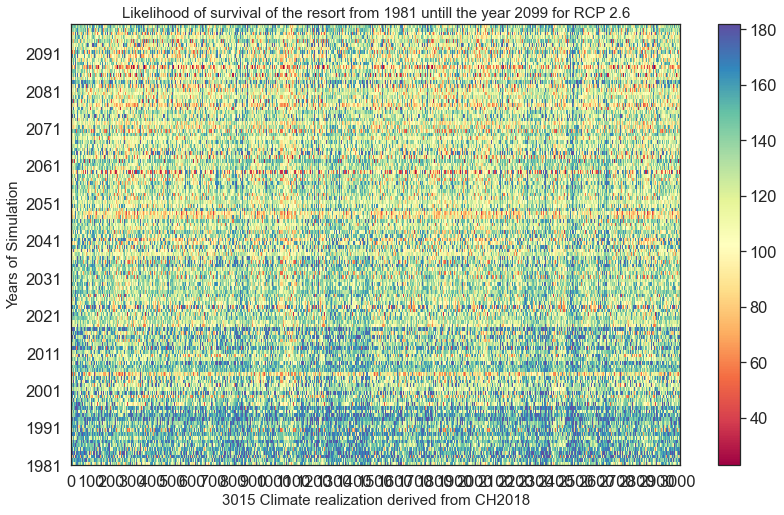

In [124]:
fig25, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df26_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig25.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays26), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays26)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 2.6), fontsize=15)

fig25.tight_layout()
plt.show()

### Survival AMap CH2018 RCP4.5

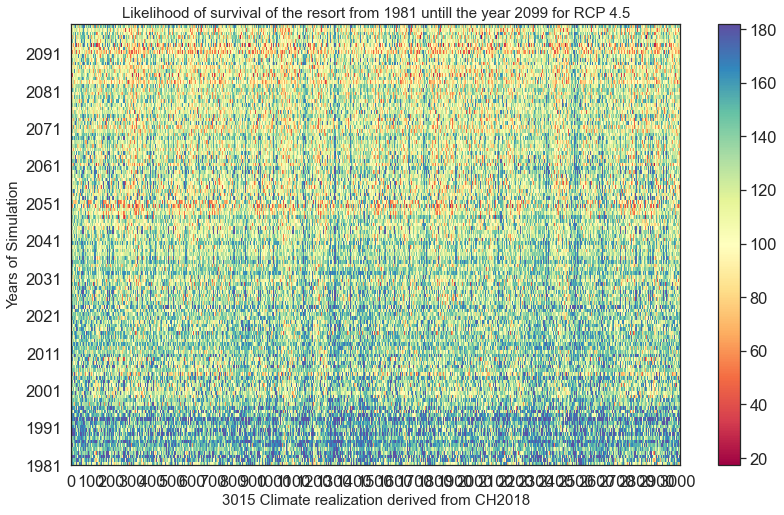

In [125]:
fig26, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df45_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig26.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays45), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays45)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 4.5), fontsize=15)

fig26.tight_layout()
plt.show()

### Survival Map CH2018 RCP8.5

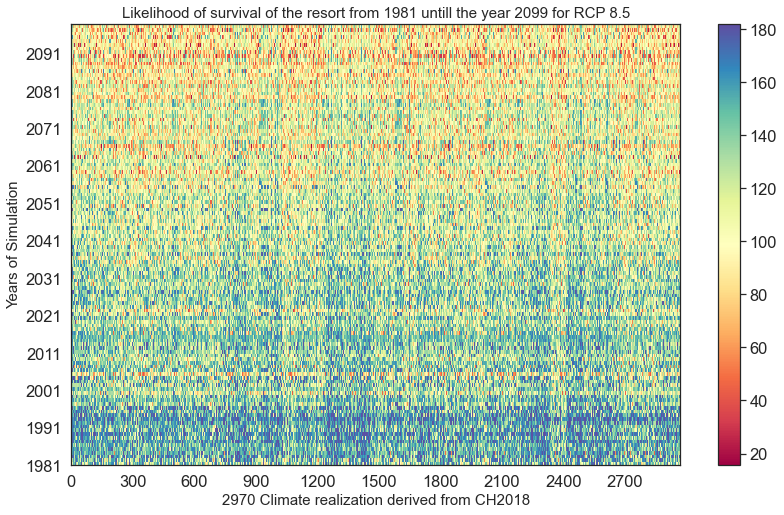

In [126]:
fig27, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df85_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')

cb3 = fig27.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays85), step=300)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays85)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 8.5), fontsize=15)

fig27.tight_layout()
plt.show()

## 3 years of not having good snow days in 10 years

### version 1: fixed threshold

In [127]:
def tipping_points_freq(df):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    dfColumns= df.columns
    
    scenarios_length= len(dfColumns)
    simulations_Length = len(df[dfColumns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df[dfColumns[i]].iloc[j]) < 100.0:
                m += 1
                if m == 3:
                    tipping_freq[i] += 1
                    m = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                continue    
                #break
    return tipping_freq

### version 2: dynamic threshold

In [128]:
def tipping_points_freq2(df2, threshold):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df2Columns= df2.columns
    
    scenarios_length= len(df2Columns)
    simulations_Length = len(df2[df2Columns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df2[df2Columns[i]].iloc[j]) < threshold[i-1] -10:
                m += 1
                mm += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                mm = 0
                continue    
                #break
    return tipping_freq

### version 3: Time rolling and policy selection added

In [129]:
def tipping_points_freq3(df3, threshold, beginningYear, endYear, policy, tippingpoint_threshold, scenario):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df3Columns= df3.columns
    
    scenarios_length= len(df3Columns)
    #simulations_Length = len(df3[df3Columns[1]])
    simulations_Length = endYear - beginningYear + 1
    statring_year = beginningYear - 1981 
    tipping_freq = np.zeros(scenarios_length)
    goodPolicy = []
    goodScenario = []
    goodTippingPoint = []
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 + statring_year, statring_year + simulations_Length + 1, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            mm += 1
            if float(df3[df3Columns[i]].iloc[j]) < threshold[i-1]:
                m += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                if mm > 10:
                    m = 0
                    mm = 0
                #continue    
                #break
                
        if tipping_freq[i] < tippingpoint_threshold:
            goodPolicy.append(policy[i-1])
            goodScenario.append(scenario[i-1])
            goodTippingPoint.append(tipping_freq[i])
        else:
            continue
            
    return tipping_freq, goodTippingPoint, goodPolicy, goodScenario

In [130]:
df26_all.shape

(118, 3016)

In [131]:
filt_S26 = (df_final_ema['xRCP'] == 1)
thresholds_26 = df_final_ema.loc[filt_S26, 'xGoodDays']
thresholds_26_m = thresholds_26.to_numpy()
thresholds_26_pol = df_final_ema.loc[filt_S26, 'policy']
thresholds_26_pol_m = thresholds_26_pol.to_numpy()
thresholds_26_sce = df_final_ema.loc[filt_S26, 'scenario']
thresholds_26_sce_m = thresholds_26_sce.to_numpy()

filt_S45 = (df_final_ema['xRCP'] == 2)
thresholds_45 = df_final_ema.loc[filt_S45, 'xGoodDays']
thresholds_45_m = thresholds_45.to_numpy()
thresholds_45_pol = df_final_ema.loc[filt_S45, 'policy']
thresholds_45_pol_m = thresholds_45_pol.to_numpy()
thresholds_45_sce = df_final_ema.loc[filt_S45, 'scenario']
thresholds_45_sce_m = thresholds_45_sce.to_numpy()

filt_S85 = (df_final_ema['xRCP'] == 3)
thresholds_85 = df_final_ema.loc[filt_S85, 'xGoodDays']
thresholds_85_m = thresholds_85.to_numpy()
thresholds_85_pol = df_final_ema.loc[filt_S85, 'policy']
thresholds_85_pol_m = thresholds_85_pol.to_numpy()
thresholds_85_sce = df_final_ema.loc[filt_S85, 'scenario']
thresholds_85_sce_m = thresholds_85_sce.to_numpy()


In [132]:
type(df26_all)

pandas.core.frame.DataFrame

In [133]:
thresholds_85_sce_m

array([  0,   1,   2, ..., 196, 197, 198], dtype=int64)

In [134]:
thresholds_45_sce_m

array([  3,   4,   5, ..., 185, 191, 199], dtype=int64)

In [135]:
df26_allColumns = df26_all.columns

In [136]:
df26_all[df26_allColumns[1]].iloc[0]

'181.0'

In [137]:
df26_all.head()

,Season,sc_1_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_3_['isOverSnow_sc_26_9'],sc_4_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_5_['isOverSnow_sc_26_6'],sc_6_['isOverSnow_sc_26_8'],sc_7_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_8_['isOverSnow_sc_26_2'],sc_9_['isOverSnow_sc_26_5'],sc_10_['isOverSnow_sc_26_10'],sc_11_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_12_['isOverSnow_sc_26_6'],sc_13_['isOverSnow_sc_26_10'],sc_14_['isOverSnow_sc_26_2'],sc_15_['isOverSnow_sc_26_12'],sc_16_['isOverSnow_sc_26_6'],sc_17_['isOverSnow_sc_26_8'],sc_18_['isOverSnow_sc_26_8'],sc_19_['isOverSnow_sc_26_5'],sc_20_['isOverSnow_sc_26_4'],sc_21_['isOverSnow_sc_26_5'],sc_22_['isOverSnow_sc_26_5'],sc_23_['isOverSnow_sc_26_1'],sc_24_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_25_['isOverSnow_sc_26_6'],sc_26_['isOverSnow_sc_26_3'],sc_27_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_28_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_29_['isOverSnow_sc_26_11'],sc_30_['isOverSnow_sc_26_11'],sc_31_['isOverSnow_sc_26_3'],sc_32_['isOverSnow_sc_26_8'],sc_33_['isOverSnow_sc_26_11'],...,sc_2982_['isOverSnow_sc_26_7'],sc_2983_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2984_['isOverSnow_sc_26_11'],sc_2985_['isOverSnow_sc_26_7'],sc_2986_['isOverSnow_sc_26_6'],sc_2987_['isOverSnow_sc_26_8'],sc_2988_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2989_['isOverSnow_sc_26_4'],sc_2990_['isOverSnow_sc_26_7'],sc_2991_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2992_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_2993_['isOverSnow_sc_26_12'],sc_2994_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2995_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_2996_['isOverSnow_sc_26_2'],sc_2997_['isOverSnow_sc_26_4'],sc_2998_['isOverSnow_sc_26_8'],sc_2999_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_3000_['isOverSnow_sc_26_3'],sc_3001_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_3002_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3003_['isOverSnow_sc_26_9'],sc_3004_['isOverSnow_sc_26_3'],sc_3005_['isOverSnow_sc_26_6'],sc_3006_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_3007_['isOverSnow_sc_26_10'],sc_3008_['isOverSnow_sc_26_6'],sc_3009_['isOverSnow_sc_26_1'],sc_3010_['isOverSnow_sc_26_5'],sc_3011_['isOverSnow_sc_26_11'],sc_3012_['isOverSnow_sc_26_9'],sc_3013_['isOverSnow_sc_26_6'],sc_3014_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_3015_['isOverSnow_sc_26_10']
0,1981-1982,181.0,111.88996,112.82599999999995,148.34918181818182,166.5724090909091,139.4876818181818,115.2167272727273,107.46086363636367,162.44451999999995,127.4235909090909,120.83736363636362,149.32345454545458,131.06295454545455,110.60086363636368,92.00740909090905,149.32345454545458,129.17755999999994,169.90140909090906,95.45727272727271,111.45209090909091,94.44681818181819,106.23818181818186,150.48318181818183,139.3977727272727,164.9167727272727,148.07795454545453,181.0,117.92349999999999,167.9884090909091,167.9884090909091,164.3556818181818,154.58818181818185,167.9884090909091,...,105.12207999999998,106.46168000000002,164.38648,111.76364000000005,158.97568,154.30939999999987,126.96212000000008,106.0326,105.12207999999998,143.685,178.21588,79.62576000000006,164.03504000000004,111.62660000000002,108.66580000000002,105.50647999999997,159.46699999999993,164.03504000000004,141.87580000000003,144.45735999999997,112.73484,141.56992000000002,149.09963999999997,158.97568,130.95332,125.23895999999999,160.63216,181.0,104.67459999999998,144.63936,141.56992000000002,158.97568,163.71024,135.06888000000012
1,1982-1983,177.6778636363636,131.67036000000002,168.0538181818182,176.16727272727272,148.44068181818182,157.48363636363635,160.9804090909091,178.1230909090909,161.65879999999999,144.2337727272727,140.55804545454544,118.40263636363638,144.2337727272727,142.8472727272727,163.97718181818183,120.95381818181816,151.83432,167.41663636363637,163.52136363636362,147.550636363

In [138]:
thresholds_45_sce_m.shape

(3015,)

In [139]:
#print(thresholds_85.shape)
print(type(thresholds_85_m))
print(thresholds_85_m[1])
print(thresholds_85_pol_m[20])
print(thresholds_85_sce_m[20])

<class 'numpy.ndarray'>
100.0
0
72


In [140]:
T1RCP26 = tipping_points_freq(df26_all)
T1RCP45 = tipping_points_freq(df45_all)
T1RCP85 = tipping_points_freq(df85_all)

In [141]:
T1RCP26_m = tipping_points_freq2(df26_all, thresholds_26_m)
T1RCP45_m = tipping_points_freq2(df45_all, thresholds_45_m)
T1RCP85_m = tipping_points_freq2(df85_all, thresholds_85_m)

In [142]:
T1RCP26_m_3 , tipping26_3, scenario26_3, policy26_3= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2097, thresholds_26_pol_m, 10, thresholds_26_sce_m)
T1RCP45_m_3 , tipping45_3, scenario45_3, policy45_3= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2097, thresholds_45_pol_m, 10, thresholds_45_sce_m)
T1RCP85_m_3 , tipping85_3, scenario85_3, policy85_3= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2097, thresholds_85_pol_m, 10, thresholds_85_sce_m)

In [143]:
print(len( policy26_3))
print(len( policy45_3))
print(len( policy85_3))

2976
2882
2660


In [144]:
print(len(scenario26_3))
print(len(scenario45_3))
print(len(scenario85_3))

2976
2882
2660


In [145]:
print(len(tipping26_3))
print(len(tipping45_3))
print(len(tipping85_3))

2976
2882
2660


In [146]:
print(len(T1RCP26_m_3))
print(len(T1RCP45_m_3))
print(len(T1RCP85_m_3))

3016
3016
2971


In [147]:
print(len(T1RCP26[1:]))
print(len(T1RCP45[1:]))
print(len(T1RCP85[1:]))

3015
3015
2970


In [148]:
type(T1RCP85)

numpy.ndarray

In [149]:
T1RCP85.shape

(2971,)

In [150]:
print(type(T1RCP85_m_3))
print(type(scenario85_3))
print(type(policy85_3))

<class 'numpy.ndarray'>
<class 'list'>
<class 'list'>


In [151]:
tipping26_3_df = pd.DataFrame(tipping26_3, columns =['tippingPoint26'])
tipping45_3_df = pd.DataFrame(tipping45_3, columns =['tippingPoint45'])
tipping85_3_df = pd.DataFrame(tipping85_3, columns =['tippingPoint85'])

scenario26_m_3 = pd.DataFrame(scenario26_3, columns =['Scenario26'])
scenario45_m_3 = pd.DataFrame(scenario45_3, columns =['Scenario45'])
scenario85_m_3 = pd.DataFrame(scenario85_3, columns =['Scenario85'])

policy26_m_3 = pd.DataFrame(policy26_3, columns =['Policy26'])
policy45_m_3 = pd.DataFrame(policy45_3, columns =['Policy45'])
policy85_m_3 = pd.DataFrame(policy85_3, columns =['Policy85'])

In [152]:
df_final_tipping_point = pd.concat((tipping26_3_df, scenario26_m_3, policy26_m_3, 
                                    tipping45_3_df, scenario45_m_3, policy45_m_3,
                                    tipping85_3_df, scenario85_m_3, policy85_m_3), axis = 1)

df_final_tipping_point.head(38)

,tippingPoint26,Scenario26,Policy26,tippingPoint45,Scenario45,Policy45,tippingPoint85,Scenario85,Policy85
0,1.0,0,8,0.0,0.0,3.0,6.0,0.0,0.0
1,0.0,0,11,7.0,0.0,4.0,3.0,0.0,2.0
2,2.0,0,18,1.0,0.0,5.0,7.0,0.0,9.0
3,0.0,0,19,4.0,0.0,6.0,4.0,0.0,12.0
4,3.0,0,22,4.0,0.0,7.0,6.0,0.0,23.0
5,2.0,0,27,1.0,0.0,10.0,6.0,0.0,28.0
6,0.0,0,29,2.0,0.0,13.0,7.0,0.0,32.0
7,0.0,0,30,0.0,0.0,14.0,0.0,0.0,33.0
8,5.0,0,31,4.0,0.0,15.0,1.0,0.0,38.0
9,1.0,0,41,7.0,0.0,16.0,7.0,0.0,40.0


### Specify the number of runs
for instance : number_Simulations = 9000

In [153]:
number_Simulations = 9000
x_axis = np.arange(1,number_Simulations + 2)

In [154]:
print("The lengthe of Y is: {}".format(len(T1RCP26[1:])))
print("The lengthe of X is: {}".format(len(matrix_GoodDays26) + 1 -1))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP45[1:])))
print("The lengthe of X is: {}".format((len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1) -(len(matrix_GoodDays26) + 1)))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP85[1:])))
print("The lengthe of X is: {}".format(number_Simulations+1 - (len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1)))

The lengthe of Y is: 3015
The lengthe of X is: 3015
***
The lengthe of Y is: 3015
The lengthe of X is: 3015
***
The lengthe of Y is: 2970
The lengthe of X is: 2970


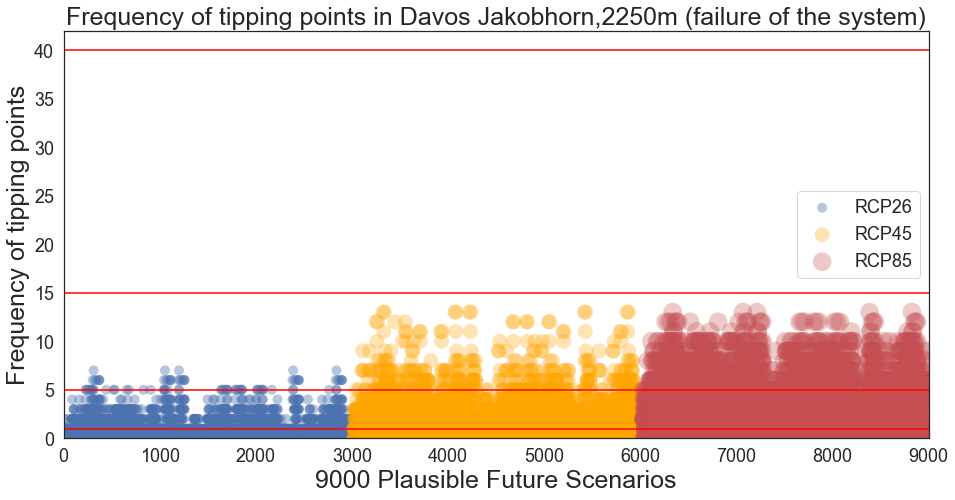

In [155]:
fig28, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.svg'), format='svg', dpi=1200)
fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.tiff'), format='tiff', dpi=150)

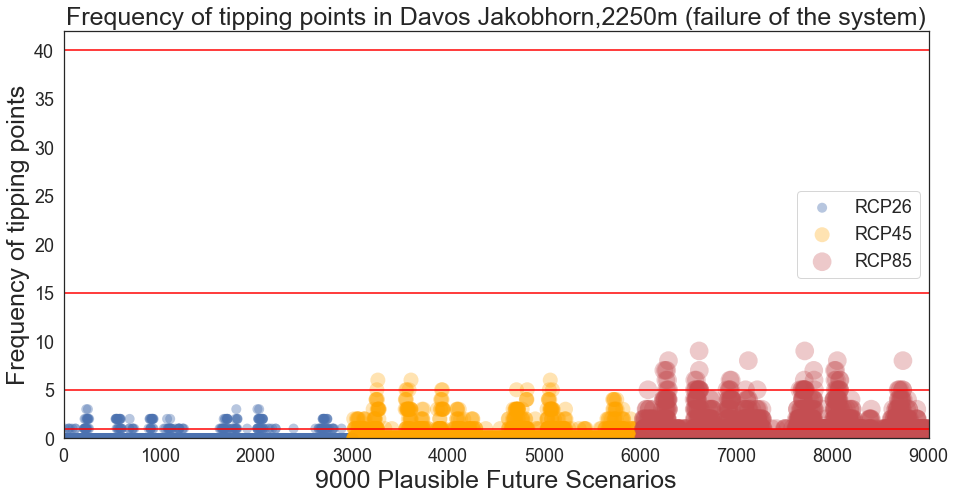

In [156]:
fig29, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.svg'), format='svg', dpi=1200)
fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.tiff'), format='tiff', dpi=150)

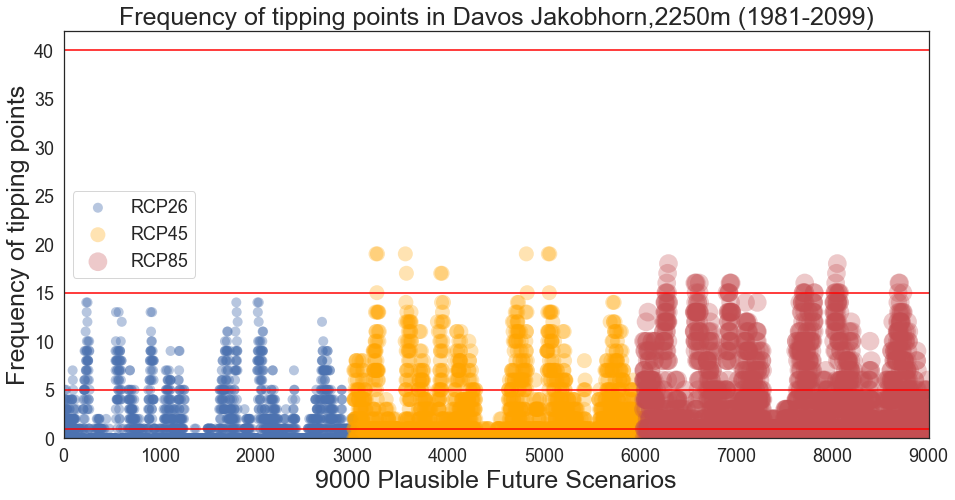

In [157]:
fig30, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.svg'), format='svg', dpi=1200)
fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.tiff'), format='tiff', dpi=150)

### Check the 45 policies

In [158]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.564115,1052.845098,5.474877,-1.803193,2.755444,0.53663,3.0,250.0,100.0,1,0,UZHModel,120.463063,53,172.820760,181.000000,168.520000,166.507360,159.797960,177.939360,154.301960,104.795120,173.267640,158.276600,132.526680,160.117240,138.739960,168.253960,181.709880,90.276640,136.451360,171.286560,109.693080,143.083000,...,108.972240,69.488840,87.026920,76.870600,75.019520,105.919400,116.644960,91.138200,141.084800,131.958720,79.937040,95.761560,55.863840,96.665400,42.798560,101.834120,93.796840,55.244800,99.841800,70.182920,80.244760,100.352040,88.124200,93.765240,89.152480,51.912800,51.109920,58.569480,111.062240,100.787560,126.439661,4.943475,0.788524,5.0
201,1.564115,1052.845098,5.474877,-1.803193,2.755444,0.53663,3.0,290.0,90.0,1,1,UZHModel,112.463853,53,166.264276,180.250897,162.274310,155.980345,153.555621,170.300172,149.277000,93.799690,168.128655,146.374310,122.004897,157.627069,130.666103,162.360517,180.633759,81.352310,126.808276,164.641483,97.002828,129.024517,...,98.163621,59.904172,77.629138,66.682931,64.672000,95.802414,107.180103,82.830862,138.164724,119.219414,75.639069,86.310828,48.158483,92.097414,36.895310,95.255862,87.262103,47.624828,92.868207,64.390759,69.176517,92.320310,80.829172,88.489828,76.855586,44.752414,44.060276,50.490931,101.037345,86.885828,126.439661,4.279831,0.786906,4.0
401,1.564115,1052.845098,5.474877,-1.803193,2.755444,0.53663,3.0,200.0,70.0,1,2,UZHModel,130.519856,53,180.159700,181.000000,173.698100,175.111150,169.027250,180.957550,161.442700,120.188950,179.377450,167.287550,147.174650,160.997400,150.720750,177.050300,182.000000,102.472050,152.284900,179.917400,117.000350,159.896050,...,119.396900,85.147000,102.108400,90.059450,93.774400,115.684350,127.629500,100.303700,145.595850,142.037400,86.023800,102.464150,69.715000,103.929900,53.498200,109.303200,103.287400,67.808950,109.113150,78.106500,96.732900,111.421800,100.909350,101.971450,107.278750,64.891000,63.887400,73.211850,122.133650,125.396050,126.439661,6.651271,0.836273,0.0
601,1.564115,1052.845098,5.474877,-1.803193,2.755444,0.53663,3.0,240.0,100.0,1,3,UZHModel,122.471890,53,174.521625,181.000000,169.448250,168.777000,161.387083,179.223375,155.635208,107.818917,174.414458,160.379875,135.089500,160.297625,140.855500,169.972875,181.864458,92.609250,139.220167,172.936167,112.146292,147.211458,...,111.207167,72.384208,89.653042,79.597292,78.145333,108.043792,118.947458,93.352292,141.921667,135.082000,80.989083,97.129000,58.191500,97.943125,44.581833,103.421625,95.642375,57.518542,101.699250,71.690542,83.508500,102.610083,90.257792,95.278417,92.722583,54.075833,53.239500,61.009875,113.419542,104.987042,126.439661,5.091017,0.793746,4.0
801,1.564115,1052.845098,5.474877,-1.803193,2.755444,0.53663,3.0,250.0,60.0,1,4,UZHModel,120.463063,53,172.820760,181.000000,168.520000,166.507360,159.797960,177.939360,154.301960,104.795120,173.267640,158.276600,132.526680,160.117240,138.739960,168.253960,181.709880,90.276640,136.451360,171.286560,109.693080,143.083000,...,108.972240,69.488840,87.026920,76.870600,75.019520,105.919400,116.644960,91.138200,141.084800,131.958720,79.937040,95.761560,55.863840,96.665400,42.798560,101.834120,93.796840,55.244800,99.841800,70.182920,80.244760,100.352040,88.124200,93.765240,89.152480,51.912800,51.109920,58.569480,111.062240,100.787560,126.439661,4.943475,0.833283,1.0
1001,1.564115,1052.845098,5.474877,-1.803193,2.755444

In [217]:
df_final_ema[filt_S].to_csv(os.path.join(rootVisualization, 'df_policies.csv'), index = False)

In [159]:
T1RCP26_m_3_1980 , tipping26_3_1980, scenario26_3_1980, policy26_3_1980= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2010, thresholds_26_pol_m, 30, thresholds_26_sce_m)
T1RCP45_m_3_1980 , tipping45_3_1980, scenario45_3_1980, policy45_3_1980= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2010, thresholds_45_pol_m, 30, thresholds_45_sce_m)
T1RCP85_m_3_1980 , tipping85_3_1980, scenario85_3_1980, policy85_3_1980= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2010, thresholds_85_pol_m, 30, thresholds_85_sce_m)

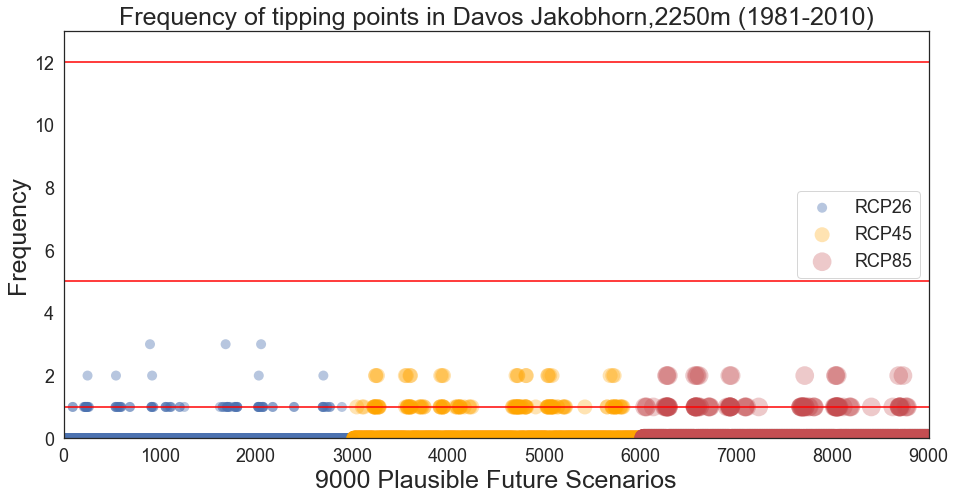

In [160]:
fig31, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_1980[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_1980[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_1980[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2010)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.svg'), format='svg', dpi=600)
fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.tiff'), format='tiff', dpi=150)

In [161]:
type(T1RCP85_m_3_1980)

numpy.ndarray

In [162]:
T1RCP26_m_3_1980_df = pd.DataFrame(T1RCP26_m_3_1980, columns =['tippingPoint26_1980'])
tipping26_3_1980_df = pd.DataFrame(tipping26_3_1980, columns =['tippingPoint26_1_1980'])
scenario26_3_1980_df = pd.DataFrame(scenario26_3_1980, columns =['scenario26_1980'])
policy26_3_1980_df = pd.DataFrame(policy26_3_1980, columns =['policy26_1980'])

T1RCP45_m_3_1980_df = pd.DataFrame(T1RCP45_m_3_1980, columns =['tippingPoint45_1980'])
tipping45_3_1980_df = pd.DataFrame(tipping45_3_1980, columns =['tippingPoint45_1_1980'])
scenario45_3_1980_df = pd.DataFrame(scenario45_3_1980, columns =['scenario45_1980'])
policy45_3_1980_df = pd.DataFrame(policy45_3_1980, columns =['policy45_1980'])

T1RCP85_m_3_1980_df = pd.DataFrame(T1RCP85_m_3_1980, columns =['tippingPoint85_1980'])
tipping85_3_1980_df = pd.DataFrame(tipping85_3_1980, columns =['tippingPoint85_1_1980'])
scenario85_3_1980_df = pd.DataFrame(scenario85_3_1980, columns =['scenario85_1980'])
policy85_3_1980_df = pd.DataFrame(policy85_3_1980, columns =['policy85_1980'])

In [218]:
df_final_tipping_point_1980 = pd.concat((T1RCP26_m_3_1980_df, tipping26_3_1980_df, scenario26_3_1980_df, policy26_3_1980_df,
                                         T1RCP45_m_3_1980_df, tipping45_3_1980_df, scenario45_3_1980_df, policy45_3_1980_df,
                                         T1RCP85_m_3_1980_df, tipping85_3_1980_df, scenario85_3_1980_df, policy85_3_1980_df), axis = 1)
df_final_tipping_point_1980.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_1980.csv'), index = False)

In [164]:
print(T1RCP26_m_3_1980_df['tippingPoint26_1980'].value_counts())
print(T1RCP45_m_3_1980_df['tippingPoint45_1980'].value_counts())
print(T1RCP85_m_3_1980_df['tippingPoint85_1980'].value_counts())

0.0    2919
1.0      89
2.0       5
3.0       3
Name: tippingPoint26_1980, dtype: int64
0.0    2867
1.0     127
2.0      22
Name: tippingPoint45_1980, dtype: int64
0.0    2853
1.0     103
2.0      15
Name: tippingPoint85_1980, dtype: int64


In [165]:
print(tipping26_3_1980_df['tippingPoint26_1_1980'].value_counts())
print(tipping45_3_1980_df['tippingPoint45_1_1980'].value_counts())
print(tipping85_3_1980_df['tippingPoint85_1_1980'].value_counts())

0.0    2918
1.0      89
2.0       5
3.0       3
Name: tippingPoint26_1_1980, dtype: int64
0.0    2866
1.0     127
2.0      22
Name: tippingPoint45_1_1980, dtype: int64
0.0    2852
1.0     103
2.0      15
Name: tippingPoint85_1_1980, dtype: int64


In [166]:
print(scenario26_3_1980_df['scenario26_1980'].value_counts())
print(scenario45_3_1980_df['scenario45_1980'].value_counts())
print(scenario85_3_1980_df['scenario85_1980'].value_counts())

43    67
42    67
38    67
36    67
34    67
32    67
30    67
28    67
26    67
24    67
22    67
20    67
18    67
16    67
14    67
12    67
10    67
8     67
6     67
4     67
2     67
40    67
44    67
41    67
1     67
39    67
37    67
35    67
33    67
31    67
29    67
27    67
25    67
23    67
21    67
19    67
17    67
15    67
13    67
11    67
9     67
7     67
5     67
3     67
0     67
Name: scenario26_1980, dtype: int64
43    67
42    67
38    67
36    67
34    67
32    67
30    67
28    67
26    67
24    67
22    67
20    67
18    67
16    67
14    67
12    67
10    67
8     67
6     67
4     67
2     67
40    67
44    67
41    67
1     67
39    67
37    67
35    67
33    67
31    67
29    67
27    67
25    67
23    67
21    67
19    67
17    67
15    67
13    67
11    67
9     67
7     67
5     67
3     67
0     67
Name: scenario45_1980, dtype: int64
43    66
42    66
38    66
36    66
34    66
32    66
30    66
28    66
26    66
24    66
22    66
20    66
18    66
1

In [167]:
print(policy26_3_1980_df['policy26_1980'].value_counts())
print(policy45_3_1980_df['policy45_1980'].value_counts())
print(policy85_3_1980_df['policy85_1980'].value_counts())

195    45
116    45
184    45
182    45
180    45
162    45
154    45
148    45
146    45
142    45
140    45
138    45
136    45
132    45
124    45
122    45
106    45
190    45
96     45
92     45
90     45
86     45
84     45
80     45
76     45
60     45
54     45
52     45
46     45
30     45
22     45
18     45
186    45
194    45
193    45
101    45
187    45
183    45
181    45
177    45
173    45
171    45
161    45
159    45
155    45
145    45
139    45
117    45
113    45
103    45
91     45
11     45
85     45
83     45
77     45
75     45
73     45
67     45
63     45
61     45
55     45
41     45
31     45
29     45
27     45
19     45
8      45
Name: policy26_1980, dtype: int64
199    45
70     45
3      45
178    45
176    45
174    45
164    45
158    45
150    45
134    45
112    45
110    45
108    45
102    45
100    45
94     45
68     45
7      45
66     45
64     45
62     45
56     45
42     45
36     45
34     45
26     45
24     45
20     45
16     45
14    

In [222]:
T1RCP26_m_3_2020 , tipping26_3_2020, scenario26_3_2020, policy26_3_2020= tipping_points_freq3(df26_all, thresholds_26_m, 2020, 2049, thresholds_26_pol_m, 2, thresholds_26_sce_m)
T1RCP45_m_3_2020 , tipping45_3_2020, scenario45_3_2020, policy45_3_2020= tipping_points_freq3(df45_all, thresholds_45_m, 2020, 2049, thresholds_45_pol_m, 2, thresholds_45_sce_m)
T1RCP85_m_3_2020 , tipping85_3_2020, scenario85_3_2020, policy85_3_2020= tipping_points_freq3(df85_all, thresholds_85_m, 2020, 2049, thresholds_85_pol_m, 2, thresholds_85_sce_m)

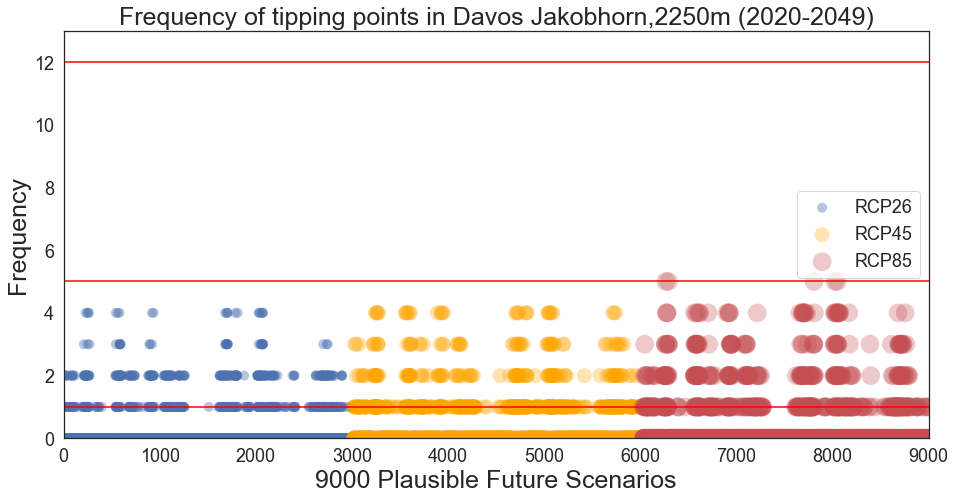

In [223]:
fig32, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2020[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2020[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2020[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2020-2049)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.svg'), format='svg', dpi=600)
fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.tiff'), format='tiff', dpi=150)

In [224]:
T1RCP26_m_3_2020_df = pd.DataFrame(T1RCP26_m_3_2020, columns =['tippingPoint26_2020'])
tipping26_3_2020_df = pd.DataFrame(tipping26_3_2020, columns =['tippingPoint26_1_2020'])
scenario26_3_2020_df = pd.DataFrame(scenario26_3_2020, columns =['scenario26_2020'])
policy26_3_2020_df = pd.DataFrame(policy26_3_2020, columns =['policy26_2020'])

T1RCP45_m_3_2020_df = pd.DataFrame(T1RCP45_m_3_2020, columns =['tippingPoint45_2020'])
tipping45_3_2020_df = pd.DataFrame(tipping45_3_2020, columns =['tippingPoint45_1_2020'])
scenario45_3_2020_df = pd.DataFrame(scenario45_3_2020, columns =['scenario45_2020'])
policy45_3_2020_df = pd.DataFrame(policy45_3_2020, columns =['policy45_2020'])

T1RCP85_m_3_2020_df = pd.DataFrame(T1RCP85_m_3_2020, columns =['tippingPoint85_2020'])
tipping85_3_2020_df = pd.DataFrame(tipping85_3_2020, columns =['tippingPoint85_1_2020'])
scenario85_3_2020_df = pd.DataFrame(scenario85_3_2020, columns =['scenario85_2020'])
policy85_3_2020_df = pd.DataFrame(policy85_3_2020, columns =['policy85_2020'])

In [225]:
df_final_tipping_point_2020 = pd.concat((T1RCP26_m_3_2020_df, tipping26_3_2020_df, scenario26_3_2020_df, policy26_3_2020_df,
                                         T1RCP45_m_3_2020_df, tipping45_3_2020_df, scenario45_3_2020_df, policy45_3_2020_df,
                                         T1RCP85_m_3_2020_df, tipping85_3_2020_df, scenario85_3_2020_df, policy85_3_2020_df), axis = 1)
df_final_tipping_point_2020.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2020.csv'), index = False)

In [226]:
print(T1RCP26_m_3_2020_df['tippingPoint26_2020'].value_counts())
print(T1RCP45_m_3_2020_df['tippingPoint45_2020'].value_counts())
print(T1RCP85_m_3_2020_df['tippingPoint85_2020'].value_counts())

0.0    2366
1.0     344
2.0     250
3.0      35
4.0      21
Name: tippingPoint26_2020, dtype: int64
0.0    2361
1.0     463
2.0     105
3.0      55
4.0      32
Name: tippingPoint45_2020, dtype: int64
0.0    2421
1.0     312
2.0     134
3.0      62
4.0      37
5.0       5
Name: tippingPoint85_2020, dtype: int64


In [227]:
print(tipping26_3_2020_df['tippingPoint26_1_2020'].value_counts())
print(tipping45_3_2020_df['tippingPoint45_1_2020'].value_counts())
print(tipping85_3_2020_df['tippingPoint85_1_2020'].value_counts())

0.0    2365
1.0     344
Name: tippingPoint26_1_2020, dtype: int64
0.0    2360
1.0     463
Name: tippingPoint45_1_2020, dtype: int64
0.0    2420
1.0     312
Name: tippingPoint85_1_2020, dtype: int64


In [228]:
print(scenario26_3_2020_df['scenario26_2020'].value_counts())
print(scenario45_3_2020_df['scenario45_2020'].value_counts())
print(scenario85_3_2020_df['scenario85_2020'].value_counts())

44    67
21    67
36    67
34    67
5     67
7     67
9     67
22    67
20    67
14    67
38    67
19    67
23    67
12    67
27    67
29    67
6     67
4     67
37    67
2     67
42    67
11    66
33    66
28    66
43    63
35    63
17    62
0     61
1     61
15    60
18    60
31    59
39    59
32    58
41    57
24    55
10    55
16    52
26    49
13    44
25    42
40    42
3     38
8     33
30    31
Name: scenario26_2020, dtype: int64
44    67
23    67
34    67
5     67
7     67
9     67
20    67
14    67
12    67
21    67
19    67
6     67
27    67
29    67
4     67
37    67
2     67
36    67
38    66
11    66
33    66
35    66
22    66
28    66
42    66
43    65
17    65
15    65
18    63
1     63
24    62
0     62
32    62
10    61
39    61
41    60
31    60
16    58
26    56
40    54
13    52
25    50
3     46
30    45
8     45
Name: scenario45_2020, dtype: int64
43    66
9     66
2     66
4     66
6     66
12    66
14    66
20    66
22    66
28    66
34    66
36    66
38    66
4

In [229]:
print(policy26_3_2020_df['policy26_2020'].value_counts())
print(policy45_3_2020_df['policy45_2020'].value_counts())
print(policy85_3_2020_df['policy85_2020'].value_counts())

19     45
116    43
41     43
101    43
29     43
181    43
148    43
177    42
61     42
122    42
83     42
91     42
18     42
27     42
136    42
142    42
22     42
31     41
184    41
67     41
46     41
146    41
63     41
77     41
73     41
75     41
85     41
106    41
139    41
52     41
159    41
90     41
171    41
80     41
187    41
162    41
154    40
124    40
92     40
86     40
194    40
103    40
117    40
193    40
173    40
161    40
155    40
60     40
55     40
183    39
145    39
182    39
186    39
132    39
11     39
138    39
140    39
76     39
54     38
8      38
84     38
180    38
113    38
96     37
190    37
195    37
30     35
Name: policy26_2020, dtype: int64
68     45
64     45
10     45
35     45
37     45
20     45
4      44
97     44
108    44
110    44
112    44
164    44
174    44
15     44
42     44
135    44
45     43
7      43
191    43
127    43
176    43
16     43
158    43
62     43
59     43
71     43
26     43
95     43
6      42
151   

In [230]:
T1RCP26_m_3_2050 , tipping26_3_2050, scenario26_3_2050, policy26_3_2050= tipping_points_freq3(df26_all, thresholds_26_m, 2050, 2079, thresholds_26_pol_m, 2, thresholds_26_sce_m)
T1RCP45_m_3_2050 , tipping45_3_2050, scenario45_3_2050, policy45_3_2050= tipping_points_freq3(df45_all, thresholds_45_m, 2050, 2079, thresholds_45_pol_m, 2, thresholds_45_sce_m)
T1RCP85_m_3_2050 , tipping85_3_2050, scenario85_3_2050, policy85_3_2050= tipping_points_freq3(df85_all, thresholds_85_m, 2050, 2079, thresholds_85_pol_m, 2, thresholds_85_sce_m)

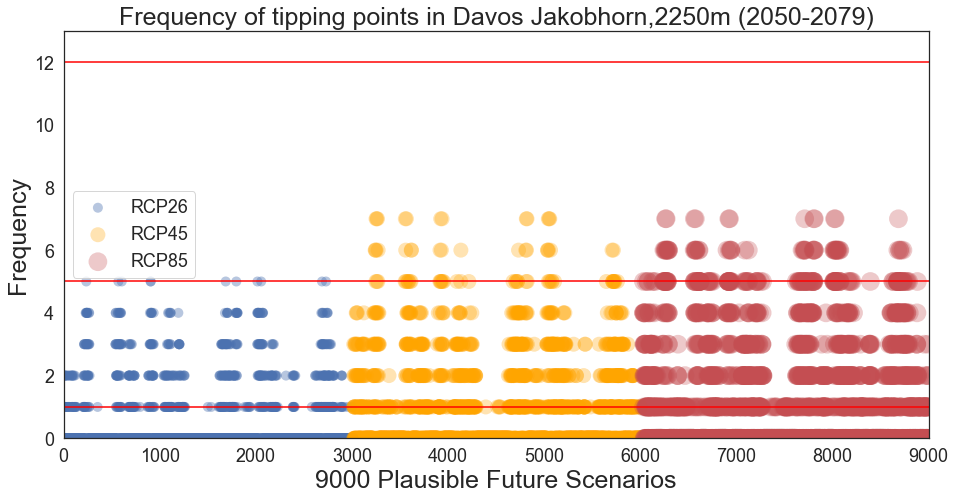

In [231]:
fig33, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2050[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2050[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2050[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2050-2079)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.svg'), format='svg', dpi=600)
fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.tiff'), format='tiff', dpi=150)

In [232]:
T1RCP26_m_3_2050_df = pd.DataFrame(T1RCP26_m_3_2050, columns =['tippingPoint26_2050'])
tipping26_3_2050_df = pd.DataFrame(tipping26_3_2050, columns =['tippingPoint26_1_2050'])
scenario26_3_2050_df = pd.DataFrame(scenario26_3_2050, columns =['scenario26_2050'])
policy26_3_2050_df = pd.DataFrame(policy26_3_2050, columns =['policy26_2050'])

T1RCP45_m_3_2050_df = pd.DataFrame(T1RCP45_m_3_2050, columns =['tippingPoint45_2050'])
tipping45_3_2050_df = pd.DataFrame(tipping45_3_2050, columns =['tippingPoint45_1_2050'])
scenario45_3_2050_df = pd.DataFrame(scenario45_3_2050, columns =['scenario45_2050'])
policy45_3_2050_df = pd.DataFrame(policy45_3_2050, columns =['policy45_2050'])

T1RCP85_m_3_2050_df = pd.DataFrame(T1RCP85_m_3_2050, columns =['tippingPoint85_2050'])
tipping85_3_2050_df = pd.DataFrame(tipping85_3_2050, columns =['tippingPoint85_1_2050'])
scenario85_3_2050_df = pd.DataFrame(scenario85_3_2050, columns =['scenario85_2050'])
policy85_3_2050_df = pd.DataFrame(policy85_3_2050, columns =['policy85_2050'])

In [233]:
df_final_tipping_point_2050 = pd.concat((T1RCP26_m_3_2050_df, tipping26_3_2050_df, scenario26_3_2050_df, policy26_3_2050_df,
                                         T1RCP45_m_3_2050_df, tipping45_3_2050_df, scenario45_3_2050_df, policy45_3_2050_df,
                                         T1RCP85_m_3_2050_df, tipping85_3_2050_df, scenario85_3_2050_df, policy85_3_2050_df), axis = 1)
df_final_tipping_point_2050.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2050.csv'), index = False)

In [234]:
print(T1RCP26_m_3_2050_df['tippingPoint26_2050'].value_counts())
print(T1RCP45_m_3_2050_df['tippingPoint45_2050'].value_counts())
print(T1RCP85_m_3_2050_df['tippingPoint85_2050'].value_counts())

0.0    2340
1.0     276
2.0     204
3.0     118
4.0      67
5.0      11
Name: tippingPoint26_2050, dtype: int64
0.0    2035
1.0     435
2.0     210
3.0     183
4.0      81
5.0      41
6.0      19
7.0      12
Name: tippingPoint45_2050, dtype: int64
0.0    1601
1.0     510
2.0     274
3.0     198
4.0     162
5.0     159
6.0      55
7.0      12
Name: tippingPoint85_2050, dtype: int64


In [235]:
print(tipping26_3_2050_df['tippingPoint26_1_2050'].value_counts())
print(tipping45_3_2050_df['tippingPoint45_1_2050'].value_counts())
print(tipping85_3_2050_df['tippingPoint85_1_2050'].value_counts())

0.0    2339
1.0     276
Name: tippingPoint26_1_2050, dtype: int64
0.0    2034
1.0     435
Name: tippingPoint45_1_2050, dtype: int64
0.0    1600
1.0     510
Name: tippingPoint85_1_2050, dtype: int64


In [236]:
print(scenario26_3_2050_df['scenario26_2050'].value_counts())
print(scenario45_3_2050_df['scenario45_2050'].value_counts())
print(scenario85_3_2050_df['scenario85_2050'].value_counts())

44    67
38    67
36    67
28    67
5     67
7     67
9     67
11    67
22    67
20    67
14    67
19    67
21    67
23    67
12    67
27    67
29    67
6     67
4     67
37    67
2     67
42    67
33    66
34    66
43    64
18    61
15    61
35    61
31    61
1     60
39    58
0     58
17    55
32    53
24    50
41    49
16    47
10    47
26    42
25    38
13    34
40    33
3     29
8     26
30    22
Name: scenario26_2050, dtype: int64
12    67
7     67
14    67
20    67
36    67
19    67
21    67
23    67
6     67
27    67
29    67
4     67
22    67
37    67
2     67
9     67
42    66
5     66
44    66
33    64
35    64
11    63
34    63
38    63
15    61
28    59
43    59
17    55
1     51
18    50
0     47
39    46
31    46
32    45
24    44
16    37
41    37
10    36
13    35
26    33
25    33
40    31
3     26
30    26
8     25
Name: scenario45_2050, dtype: int64
21    66
9     66
22    66
20    66
19    66
23    66
12    66
27    66
29    66
36    66
4     66
37    66
7     66
6

In [237]:
print(policy26_3_2050_df['policy26_2050'].value_counts())
print(policy45_3_2050_df['policy45_2050'].value_counts())
print(policy85_3_2050_df['policy85_2050'].value_counts())

18     42
75     42
139    42
86     42
8      41
146    41
19     41
76     41
171    41
31     41
132    40
142    40
162    40
182    40
136    40
29     40
83     40
96     40
101    40
92     40
159    40
173    40
177    40
181    40
11     40
124    39
90     39
80     39
154    39
186    39
22     39
195    39
27     39
73     39
187    39
155    39
117    39
103    39
85     39
77     39
194    39
63     39
148    38
113    38
183    38
30     38
46     38
52     38
54     38
60     38
161    38
41     38
145    38
122    38
116    38
91     38
67     37
55     37
84     37
106    37
193    37
180    37
61     37
138    37
140    37
184    37
190    36
Name: policy26_2050, dtype: int64
10     42
42     41
158    40
7      40
26     40
127    40
25     39
45     39
97     39
105    39
39     39
37     39
131    39
5      39
3      39
185    39
68     38
191    38
13     38
112    38
81     38
95     38
147    38
141    38
134    37
174    37
176    37
178    37
151    37
149   

In [238]:
T1RCP26_m_3_2070 , tipping26_3_2070, scenario26_3_2070, policy26_3_2070= tipping_points_freq3(df26_all, thresholds_26_m, 2070, 2097, thresholds_26_pol_m, 2, thresholds_26_sce_m)
T1RCP45_m_3_2070 , tipping45_3_2070, scenario45_3_2070, policy45_3_2070= tipping_points_freq3(df45_all, thresholds_45_m, 2070, 2097, thresholds_45_pol_m, 2, thresholds_45_sce_m)
T1RCP85_m_3_2070 , tipping85_3_2070, scenario85_3_2070, policy85_3_2070= tipping_points_freq3(df85_all, thresholds_85_m, 2070, 2097, thresholds_85_pol_m, 2, thresholds_85_sce_m)

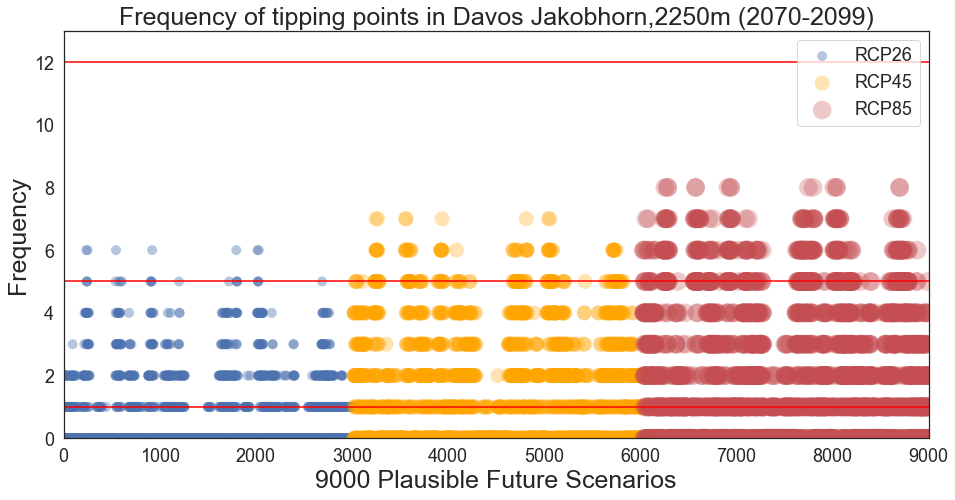

In [239]:
fig34, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2070[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2070[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2070[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2070-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.svg'), format='svg', dpi=600)
fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.tiff'), format='tiff', dpi=150)

In [240]:
T1RCP26_m_3_2070_df = pd.DataFrame(T1RCP26_m_3_2070, columns =['tippingPoint26_2070'])
tipping26_3_2070_df = pd.DataFrame(tipping26_3_2070, columns =['tippingPoint26_1_2070'])
scenario26_3_2070_df = pd.DataFrame(scenario26_3_2070, columns =['scenario26_2070'])
policy26_3_2070_df = pd.DataFrame(policy26_3_2070, columns =['policy26_2070'])

T1RCP45_m_3_2070_df = pd.DataFrame(T1RCP45_m_3_2070, columns =['tippingPoint45_2070'])
tipping45_3_2070_df = pd.DataFrame(tipping45_3_2070, columns =['tippingPoint45_1_2070'])
scenario45_3_2070_df = pd.DataFrame(scenario45_3_2070, columns =['scenario45_2070'])
policy45_3_2070_df = pd.DataFrame(policy45_3_2070, columns =['policy45_2070'])

T1RCP85_m_3_2070_df = pd.DataFrame(T1RCP85_m_3_2070, columns =['tippingPoint85_2070'])
tipping85_3_2070_df = pd.DataFrame(tipping85_3_2070, columns =['tippingPoint85_1_2070'])
scenario85_3_2070_df = pd.DataFrame(scenario85_3_2070, columns =['scenario85_2070'])
policy85_3_2070_df = pd.DataFrame(policy85_3_2070, columns =['policy85_2070'])

In [241]:
df_final_tipping_point_2070 = pd.concat((T1RCP26_m_3_2070_df, tipping26_3_2070_df, scenario26_3_2070_df, policy26_3_2070_df,
                                         T1RCP45_m_3_2070_df, tipping45_3_2070_df, scenario45_3_2070_df, policy45_3_2070_df,
                                         T1RCP85_m_3_2070_df, tipping85_3_2070_df, scenario85_3_2070_df, policy85_3_2070_df), axis = 1)
df_final_tipping_point_2070.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2070.csv'), index = False)

In [242]:
print(T1RCP26_m_3_2070_df['tippingPoint26_2070'].value_counts())
print(T1RCP45_m_3_2070_df['tippingPoint45_2070'].value_counts())
print(T1RCP85_m_3_2070_df['tippingPoint85_2070'].value_counts())

0.0    2161
1.0     342
2.0     311
3.0      98
4.0      77
5.0      20
6.0       7
Name: tippingPoint26_2070, dtype: int64
0.0    1854
2.0     334
1.0     294
4.0     182
3.0     179
5.0     113
6.0      52
7.0       8
Name: tippingPoint45_2070, dtype: int64
0.0    1123
1.0     532
2.0     336
5.0     251
3.0     249
4.0     238
6.0     154
7.0      73
8.0      15
Name: tippingPoint85_2070, dtype: int64


In [243]:
print(tipping26_3_2070_df['tippingPoint26_1_2070'].value_counts())
print(tipping45_3_2070_df['tippingPoint45_1_2070'].value_counts())
print(tipping85_3_2070_df['tippingPoint85_1_2070'].value_counts())

0.0    2160
1.0     342
Name: tippingPoint26_1_2070, dtype: int64
0.0    1853
1.0     294
Name: tippingPoint45_1_2070, dtype: int64
0.0    1122
1.0     532
Name: tippingPoint85_1_2070, dtype: int64


In [244]:
print(scenario26_3_2070_df['scenario26_2070'].value_counts())
print(scenario45_3_2070_df['scenario45_2070'].value_counts())
print(scenario85_3_2070_df['scenario85_2070'].value_counts())

44    67
21    67
36    67
5     67
7     67
9     67
11    67
22    67
20    67
14    67
19    67
23    67
12    67
27    67
29    67
6     67
4     67
37    67
2     67
42    67
38    66
33    66
28    65
34    64
43    62
35    59
15    58
31    57
18    56
1     53
17    53
0     52
32    51
39    49
41    46
10    45
24    43
16    40
26    36
25    30
13    28
40    25
3     23
8     19
30    16
Name: scenario26_2070, dtype: int64
19    67
20    67
7     67
4     67
29    67
27    67
9     67
23    67
21    67
12    66
22    66
37    66
36    65
14    64
2     64
6     62
42    59
5     58
35    58
44    54
38    51
15    51
33    51
11    50
34    49
43    49
28    46
18    40
17    40
1     34
0     34
31    33
39    33
32    32
24    31
41    30
16    28
10    28
26    27
13    23
25    22
40    22
3     21
30    19
8     18
Name: scenario45_2070, dtype: int64
21    66
19    66
23    65
7     64
9     63
36    63
29    63
27    63
4     63
37    62
20    62
12    60
2     56
6

In [245]:
print(policy26_3_2070_df['policy26_2070'].value_counts())
print(policy45_3_2070_df['policy45_2070'].value_counts())
print(policy85_3_2070_df['policy85_2070'].value_counts())

19     41
136    40
122    40
96     40
92     40
75     40
8      39
103    39
154    39
148    39
63     39
77     39
182    39
54     39
183    39
177    39
80     38
187    38
11     38
18     38
132    38
31     38
22     38
46     38
117    38
73     38
155    38
145    38
162    38
86     38
91     38
101    38
83     38
60     37
90     37
142    37
146    37
76     37
195    37
186    37
181    37
173    37
171    37
27     37
29     37
161    37
159    37
180    36
184    36
30     36
139    36
84     36
67     36
194    36
41     36
193    36
190    36
106    35
113    35
116    35
124    35
52     35
140    35
61     35
55     34
85     34
138    34
Name: policy26_2070, dtype: int64
10     39
127    39
105    36
112    36
68     36
97     36
3      35
49     35
109    35
42     34
164    34
100    34
94     34
134    34
26     34
150    34
151    34
107    33
39     33
179    33
176    33
5      33
108    33
149    33
37     33
25     33
13     33
20     33
71     33
131   

### Tables of the paper: Uncertainty analysis of CH2018 randomness scenarios


In [193]:
from scipy.integrate import simps

def area_max_min_df (df, a, b, lengthSim):

    max_scenario = np.array(df.max(axis=1))
    min_scenario = np.array(df.min(axis=1))
    
    # Compute the area using the composite trapezoidal rule.
    areamax1 = trapz(max_scenario[a:b], dx=1)
    areamin1 = trapz(min_scenario[a:b], dx=1)
    Uncertainty1 = ((areamax1 + areamin1)/2 )/ lengthSim
    
    # Compute the area using the composite Simpson's rule.
    areamax2 = simps(max_scenario[a:b], dx=1)
    areamin2 = simps(min_scenario[a:b], dx=1)
    Uncertainty2 = ((areamax2 + areamin2)/2 )/ lengthSim
    
    print("Start" + "**" * 30)
    print("Uncertainty Band1 ={} {}".format(Decimal(str(Uncertainty1)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("Uncertainty Band2 ={} {}".format(Decimal(str(Uncertainty2)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("**" * 20 +"End" + "\n")

    return
    #return    max_scenario, min_scenario, Uncertainty1, Uncertainty2

In [194]:
max_scenario = df26_all.max(axis=1)
min_scenario = df26_all.min(axis=1)

In [195]:
max_scenario.to_numpy()

array(['99.99150000000003', '99.9206296296297', '98.40396428571427',
       '97.65912000000019', '98.5168620689654', '99.79333333333344',
       '98.8989615384615', '99.9442413793104', '97.30030000000001',
       '99.23571428571425', '98.11434482758614', '98.96358620689658',
       '1993-1994', '98.0656923076922', '99.9958928571429',
       '98.18023333333335', '99.97451724137929', '99.82575999999997',
       '99.94933333333321', '99.1411851851852', '99.89434482758622',
       '99.57570370370367', '99.43588888888893', '99.93299999999999',
       '99.41951999999999', '99.91270370370368', '99.09486666666669',
       '99.93905000000001', '99.93260714285717', '99.61193103448277',
       '99.86458620689663', '99.99119999999998', '99.72195454545454',
       '99.68189999999998', '99.36831034482752', '99.93679310344827',
       '99.77237931034483', '99.86465384615389', '99.82811999999998',
       '99.81038461538463', '99.99764', '99.93703333333333',
       '99.98641666666668', '99.951931034482

In [196]:
min_scenario.to_numpy()

array([100.066     , 101.00264286, 100.96114815, 100.55062069,
       100.4747931 , 100.05843333, 101.61228   , 100.28992593,
       100.98665   , 100.40146667, 101.547     , 100.57312   ,
       112.40966667, 101.62832   , 100.02545833, 100.52727586,
       100.0072069 , 100.16685185, 101.24406667, 100.37539286,
       100.28680769, 100.0076    , 100.0125    , 100.10762069,
       100.14725   , 101.09468966, 100.00889286, 100.01668   ,
       101.69892593, 100.21776923, 100.24806667, 100.0564    ,
       100.11525926, 100.0311    , 100.44305   , 100.42721429,
       100.04793103, 100.04896154, 100.2132    , 100.60408   ,
       100.65396429, 100.14628   , 100.50933333, 100.20139286,
       100.45586667, 100.56858621, 101.11286207, 100.29734483,
       100.02114286, 100.16723077, 100.0063    , 100.4015    ,
       100.637375  , 100.466875  , 100.38553571, 100.03228   ,
       100.5145    , 100.00225926, 101.02240909, 100.35325   ,
       100.42793333, 100.18313793, 100.27504167, 100.23

In [197]:
max_scenario.shape

(118,)

## Changes in Good Days

In [198]:
max_scenario.to_numpy()

array(['99.99150000000003', '99.9206296296297', '98.40396428571427',
       '97.65912000000019', '98.5168620689654', '99.79333333333344',
       '98.8989615384615', '99.9442413793104', '97.30030000000001',
       '99.23571428571425', '98.11434482758614', '98.96358620689658',
       '1993-1994', '98.0656923076922', '99.9958928571429',
       '98.18023333333335', '99.97451724137929', '99.82575999999997',
       '99.94933333333321', '99.1411851851852', '99.89434482758622',
       '99.57570370370367', '99.43588888888893', '99.93299999999999',
       '99.41951999999999', '99.91270370370368', '99.09486666666669',
       '99.93905000000001', '99.93260714285717', '99.61193103448277',
       '99.86458620689663', '99.99119999999998', '99.72195454545454',
       '99.68189999999998', '99.36831034482752', '99.93679310344827',
       '99.77237931034483', '99.86465384615389', '99.82811999999998',
       '99.81038461538463', '99.99764', '99.93703333333333',
       '99.98641666666668', '99.951931034482

In [199]:
max_scenario.shape

(118,)

In [200]:
min_scenario.to_numpy()

array([100.066     , 101.00264286, 100.96114815, 100.55062069,
       100.4747931 , 100.05843333, 101.61228   , 100.28992593,
       100.98665   , 100.40146667, 101.547     , 100.57312   ,
       112.40966667, 101.62832   , 100.02545833, 100.52727586,
       100.0072069 , 100.16685185, 101.24406667, 100.37539286,
       100.28680769, 100.0076    , 100.0125    , 100.10762069,
       100.14725   , 101.09468966, 100.00889286, 100.01668   ,
       101.69892593, 100.21776923, 100.24806667, 100.0564    ,
       100.11525926, 100.0311    , 100.44305   , 100.42721429,
       100.04793103, 100.04896154, 100.2132    , 100.60408   ,
       100.65396429, 100.14628   , 100.50933333, 100.20139286,
       100.45586667, 100.56858621, 101.11286207, 100.29734483,
       100.02114286, 100.16723077, 100.0063    , 100.4015    ,
       100.637375  , 100.466875  , 100.38553571, 100.03228   ,
       100.5145    , 100.00225926, 101.02240909, 100.35325   ,
       100.42793333, 100.18313793, 100.27504167, 100.23

In [201]:
df26_all_1 = df26_all.iloc[:, 1:]
df45_all_1 = df45_all.iloc[:, 1:]
df85_all_1 = df85_all.iloc[:, 1:]

In [202]:
print("1981-2010")
area_max_min_df(df26_all_1, 0, 30, 30)
area_max_min_df(df45_all_1, 0, 30, 30)
area_max_min_df(df85_all_1, 0, 30, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

1981-2010
Start************************************************************
Uncertainty Band1 =98.14 days
Uncertainty Band2 =98.15 days
****************************************End

Start************************************************************
Uncertainty Band1 =97.38 days
Uncertainty Band2 =97.27 days
****************************************End

Start************************************************************
Uncertainty Band1 =101.03 days
Uncertainty Band2 =101.03 days
****************************************End



In [203]:
print("2021-2050")
area_max_min_df(df26_all_1, 40, 70, 30)
area_max_min_df(df45_all_1, 40, 70, 30)
area_max_min_df(df85_all_1, 40, 70, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2021-2050
Start************************************************************
Uncertainty Band1 =96.69 days
Uncertainty Band2 =96.69 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.68 days
Uncertainty Band2 =96.68 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.64 days
Uncertainty Band2 =96.64 days
****************************************End



In [204]:
print("2051-2080")
area_max_min_df(df26_all_1, 70, 100, 30)
area_max_min_df(df45_all_1, 70, 100, 30)
area_max_min_df(df85_all_1, 70, 100, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2051-2080
Start************************************************************
Uncertainty Band1 =96.66 days
Uncertainty Band2 =96.67 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.67 days
Uncertainty Band2 =96.67 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.68 days
Uncertainty Band2 =96.67 days
****************************************End



In [205]:
print("2071-2100")
area_max_min_df(df26_all_1, 90, 119, 30)
area_max_min_df(df45_all_1, 90, 119, 30)
area_max_min_df(df85_all_1, 90, 119, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)

2071-2100
Start************************************************************
Uncertainty Band1 =89.99 days
Uncertainty Band2 =89.99 days
****************************************End

Start************************************************************
Uncertainty Band1 =89.95 days
Uncertainty Band2 =89.95 days
****************************************End

Start************************************************************
Uncertainty Band1 =89.99 days
Uncertainty Band2 =89.99 days
****************************************End



## Changes in Financial situation

In [206]:
df26_all_fin_1 = df26_all_fin.iloc[:, 1:]
df45_all_fin_1 = df45_all_fin.iloc[:, 1:]
df85_all_fin_1 = df85_all_fin.iloc[:, 1:]

In [207]:
max_scenario = df26_all_fin_1.max(axis=1)
min_scenario = df26_all_fin_1.min(axis=1)

In [208]:
print("1981-2010")
area_max_min_df(df26_all_fin_1, 0, 30, 30)
area_max_min_df(df45_all_fin_1, 0, 30, 30)
area_max_min_df(df85_all_fin_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =5.57 days
Uncertainty Band2 =5.57 days
****************************************End

Start************************************************************
Uncertainty Band1 =5.44 days
Uncertainty Band2 =5.44 days
****************************************End

Start************************************************************
Uncertainty Band1 =5.55 days
Uncertainty Band2 =5.55 days
****************************************End



In [209]:
print("2021-2050")
area_max_min_df(df26_all_fin_1, 40, 70, 30)
area_max_min_df(df45_all_fin_1, 40, 70, 30)
area_max_min_df(df85_all_fin_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =5.25 days
Uncertainty Band2 =5.25 days
****************************************End

Start************************************************************
Uncertainty Band1 =5.21 days
Uncertainty Band2 =5.21 days
****************************************End

Start************************************************************
Uncertainty Band1 =5.21 days
Uncertainty Band2 =5.21 days
****************************************End



In [210]:
print("2051-2080")
area_max_min_df(df26_all_fin_1, 70, 100, 30)
area_max_min_df(df45_all_fin_1, 70, 100, 30)
area_max_min_df(df85_all_fin_1, 70, 100, 30)


2051-2080
Start************************************************************
Uncertainty Band1 =5.15 days
Uncertainty Band2 =5.15 days
****************************************End

Start************************************************************
Uncertainty Band1 =5.07 days
Uncertainty Band2 =5.07 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.82 days
Uncertainty Band2 =4.82 days
****************************************End



In [211]:
print("2071-2100")
area_max_min_df(df26_all_fin_1, 90, 119, 30)
area_max_min_df(df45_all_fin_1, 90, 119, 30)
area_max_min_df(df85_all_fin_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =4.81 days
Uncertainty Band2 =4.81 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.57 days
Uncertainty Band2 =4.57 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.23 days
Uncertainty Band2 =4.23 days
****************************************End



## Changes in Artificial Snow

In [212]:
df26_all_Art_1 = df26_all_Art.iloc[:, 1:]
df45_all_Art_1 = df45_all_Art.iloc[:, 1:]
df85_all_Art_1 = df85_all_Art.iloc[:, 1:]

In [213]:
print("1981-2010")
area_max_min_df(df26_all_Art_1, 0, 30, 30)
area_max_min_df(df45_all_Art_1, 0, 30, 30)
area_max_min_df(df85_all_Art_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =148.04 days
Uncertainty Band2 =148.03 days
****************************************End

Start************************************************************
Uncertainty Band1 =147.32 days
Uncertainty Band2 =147.32 days
****************************************End

Start************************************************************
Uncertainty Band1 =147.63 days
Uncertainty Band2 =147.60 days
****************************************End



In [214]:
print("2021-2050")
area_max_min_df(df26_all_Art_1, 40, 70, 30)
area_max_min_df(df45_all_Art_1, 40, 70, 30)
area_max_min_df(df85_all_Art_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =135.93 days
Uncertainty Band2 =135.96 days
****************************************End

Start************************************************************
Uncertainty Band1 =132.62 days
Uncertainty Band2 =132.53 days
****************************************End

Start************************************************************
Uncertainty Band1 =128.85 days
Uncertainty Band2 =128.87 days
****************************************End



In [215]:
print("2051-2080")
area_max_min_df(df26_all_Art_1, 70, 100, 30)
area_max_min_df(df45_all_Art_1, 70, 100, 30)
area_max_min_df(df85_all_Art_1, 70, 100, 30)

2051-2080
Start************************************************************
Uncertainty Band1 =131.40 days
Uncertainty Band2 =131.43 days
****************************************End

Start************************************************************
Uncertainty Band1 =113.05 days
Uncertainty Band2 =113.16 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.44 days
Uncertainty Band2 =96.45 days
****************************************End



In [216]:
print("2071-2100")
area_max_min_df(df26_all_Art_1, 90, 119, 30)
area_max_min_df(df45_all_Art_1, 90, 119, 30)
area_max_min_df(df85_all_Art_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =119.83 days
Uncertainty Band2 =119.82 days
****************************************End

Start************************************************************
Uncertainty Band1 =96.91 days
Uncertainty Band2 =97.00 days
****************************************End

Start************************************************************
Uncertainty Band1 =90.03 days
Uncertainty Band2 =90.02 days
****************************************End



## End